<a href="https://colab.research.google.com/github/Tomler123/gans-generative-adversarial-networks/blob/main/Basic_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import libs
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
# visualisation function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784
  data = tensor.detach().cpu().view(-1,ch,*size)
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()

In [ ]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75

In [ ]:
# delare our models

# Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, h_dim*2), # 128, 256
        genBlock(h_dim*2, h_dim*4), # 256, 512
        genBlock(h_dim*4, h_dim*8), # 512, 1024
        nn.Linear(h_dim*8, i_dim), # 1024, 784 (28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
      return self.gen(noise)

def gen_noise(number, z_dim):
    return torch.randn(number, z_dim).to(device)

# Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim = 256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
      return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([0, 1, 7, 3, 3, 8, 2, 4, 7, 9])


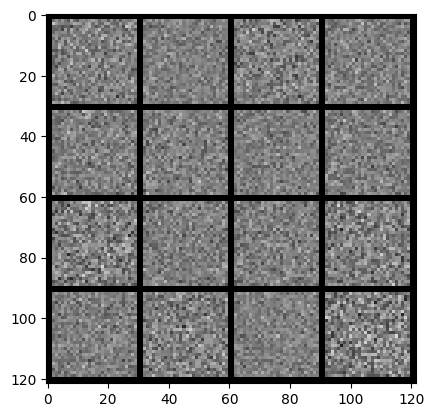

In [ ]:
x, y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets=torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)

  return gen_loss

def calc_dis_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets=torch.zeros_like(disc_fake)
  disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss=(disc_real_loss+disc_fake_loss)/2

  return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

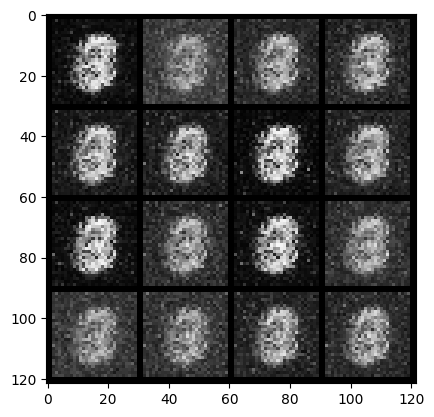

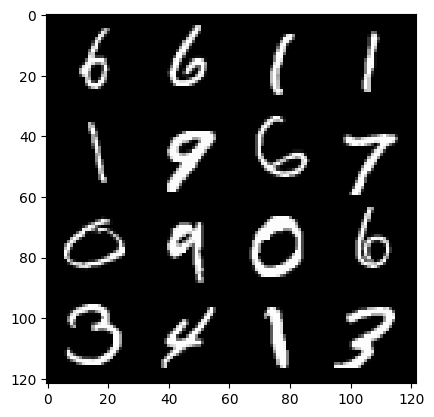

0: step 300 / Gen loss: 1.9242675127585727 / disc_loss: 0.3315812994291388


  0%|          | 0/469 [00:00<?, ?it/s]

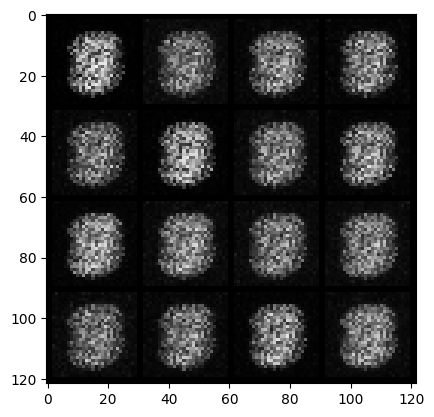

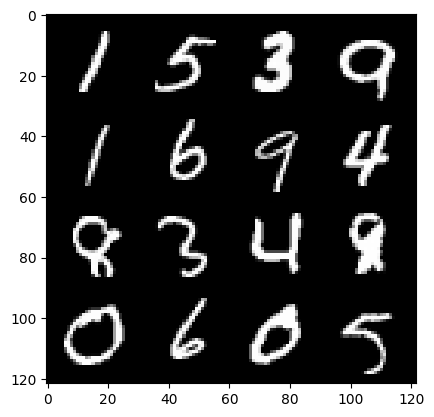

1: step 600 / Gen loss: 3.431008585294084 / disc_loss: 0.12705612053473794


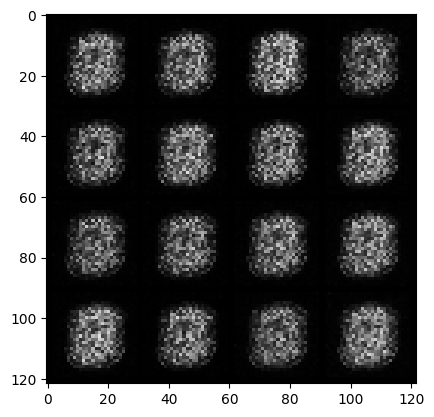

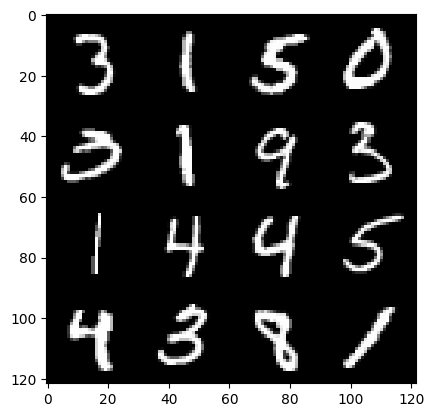

1: step 900 / Gen loss: 3.2175803510348 / disc_loss: 0.0667287545775374


  0%|          | 0/469 [00:00<?, ?it/s]

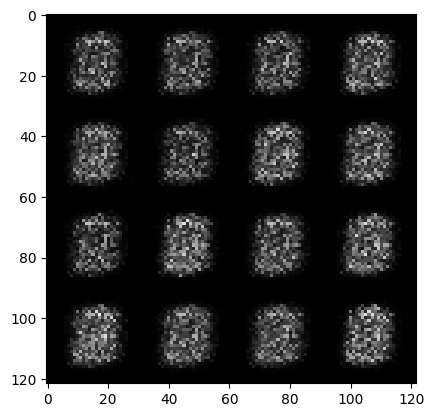

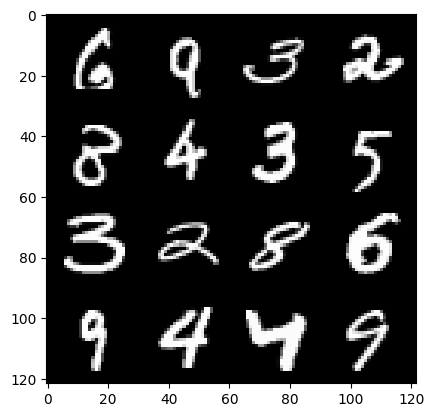

2: step 1200 / Gen loss: 3.3099908677736924 / disc_loss: 0.04574522582814097


  0%|          | 0/469 [00:00<?, ?it/s]

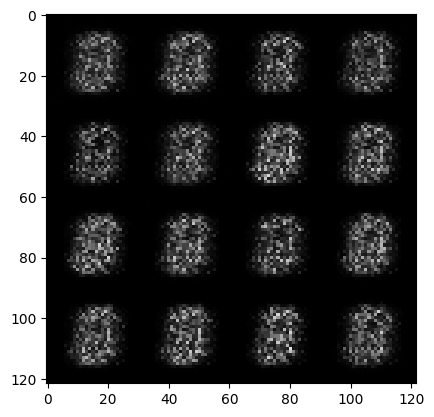

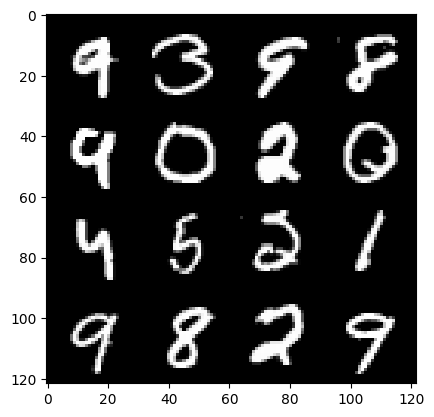

3: step 1500 / Gen loss: 3.375739850203194 / disc_loss: 0.04022386106972892


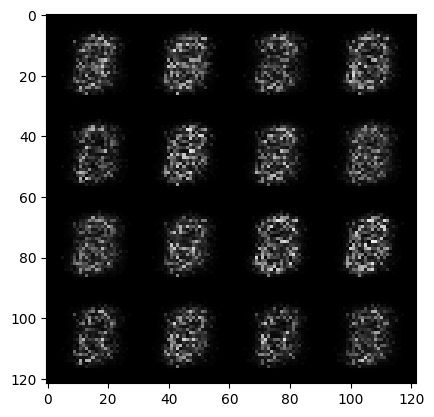

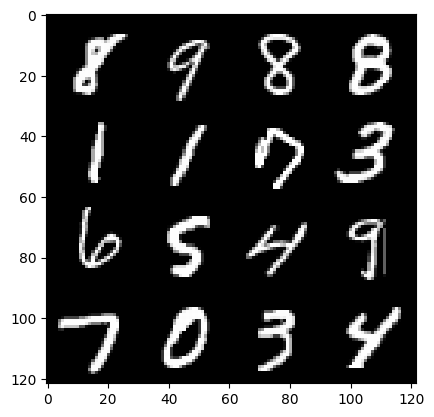

3: step 1800 / Gen loss: 3.5171131801605227 / disc_loss: 0.038451639208942644


  0%|          | 0/469 [00:00<?, ?it/s]

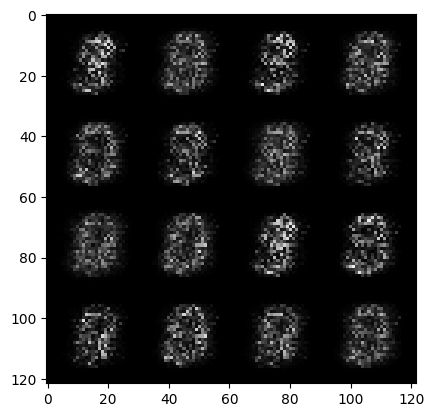

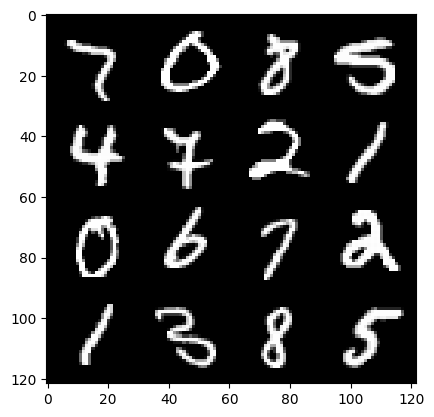

4: step 2100 / Gen loss: 3.7399448935190844 / disc_loss: 0.03751643734052777


  0%|          | 0/469 [00:00<?, ?it/s]

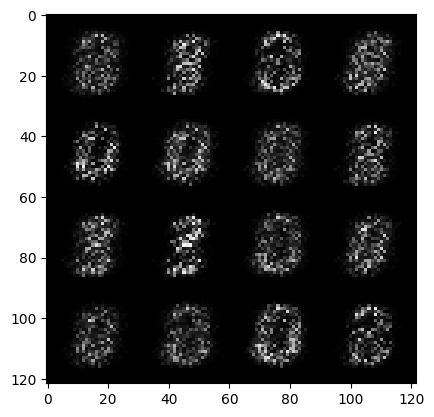

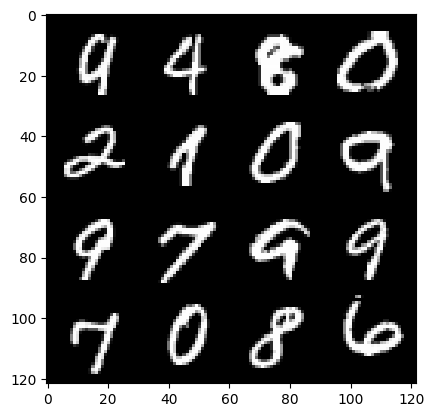

5: step 2400 / Gen loss: 3.9795345306396475 / disc_loss: 0.03818341219797735


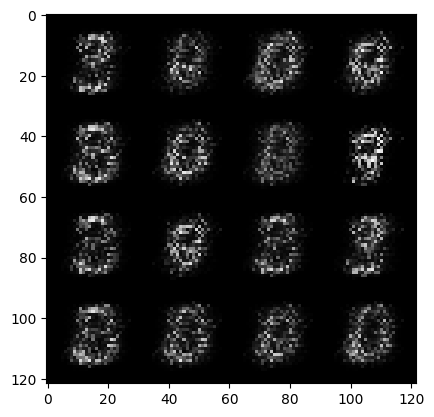

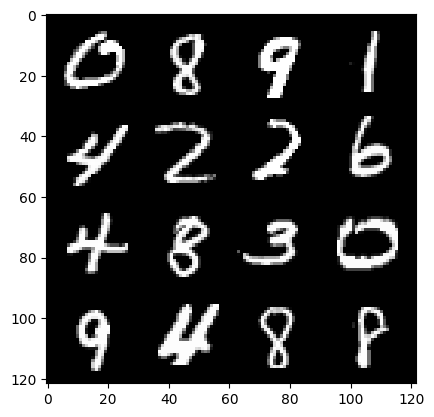

5: step 2700 / Gen loss: 4.704268024762472 / disc_loss: 0.027792566341037547


  0%|          | 0/469 [00:00<?, ?it/s]

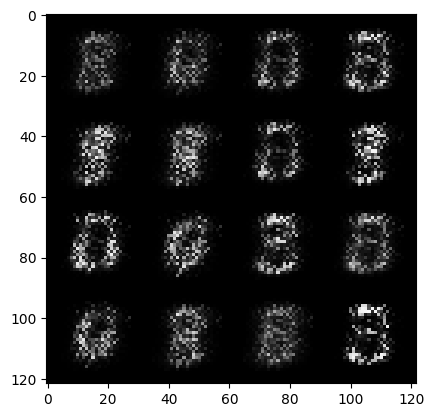

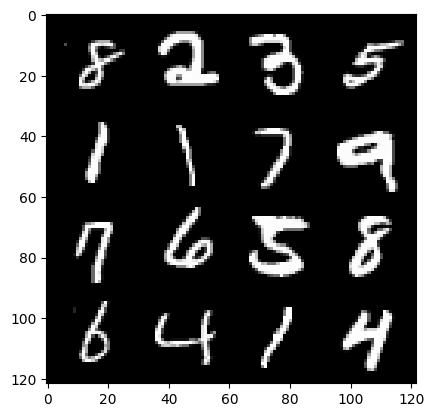

6: step 3000 / Gen loss: 4.847683367729184 / disc_loss: 0.025913214671115084


  0%|          | 0/469 [00:00<?, ?it/s]

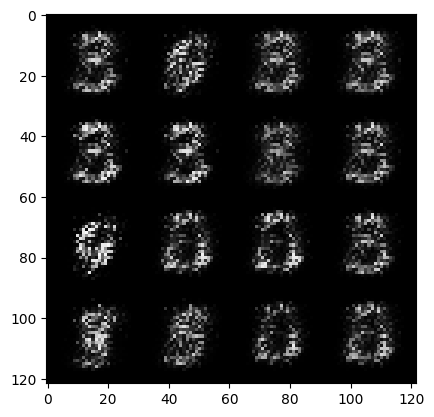

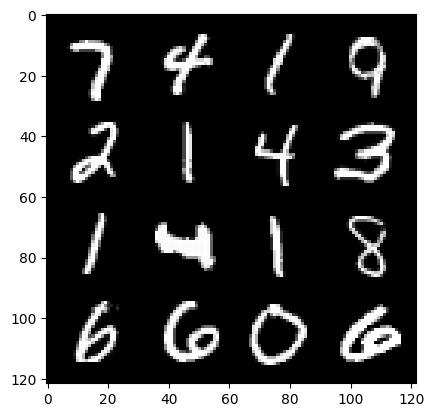

7: step 3300 / Gen loss: 5.167547324498498 / disc_loss: 0.018336240425705932


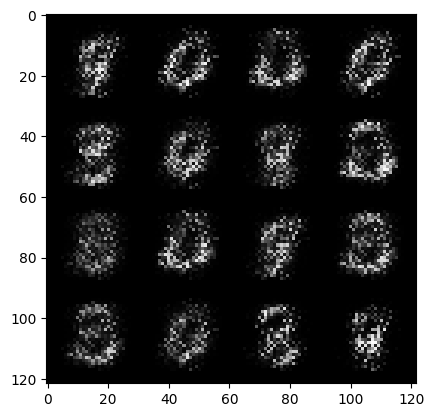

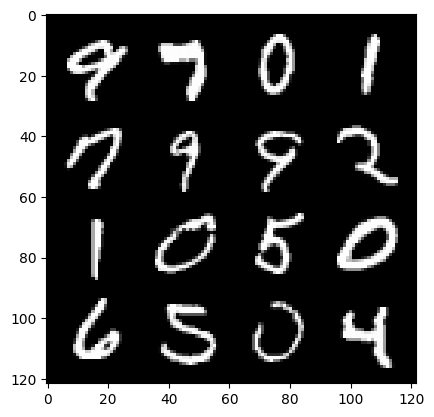

7: step 3600 / Gen loss: 5.276291077931724 / disc_loss: 0.017777640824206183


  0%|          | 0/469 [00:00<?, ?it/s]

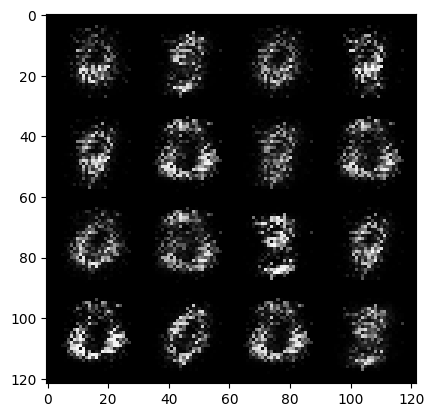

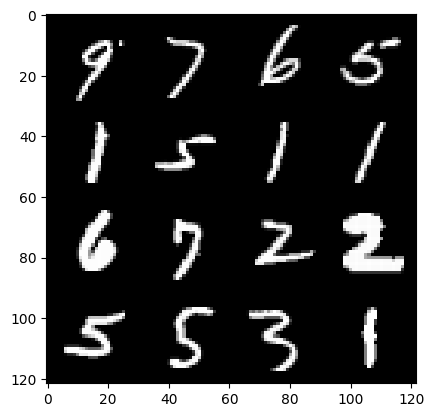

8: step 3900 / Gen loss: 5.7580927769343075 / disc_loss: 0.015968180331401526


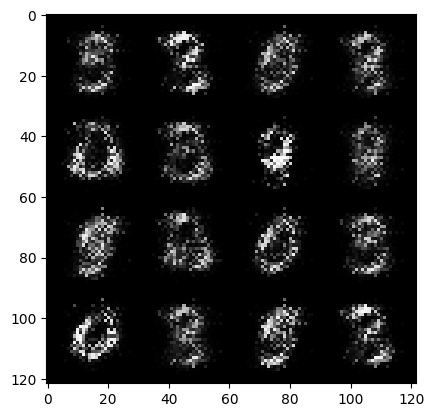

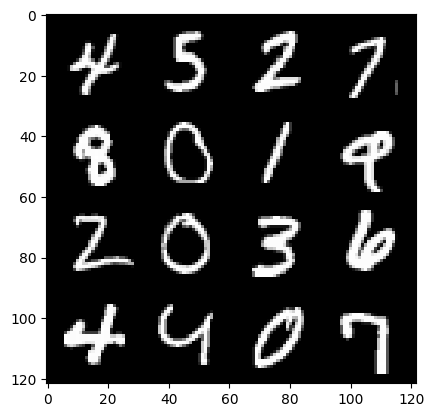

8: step 4200 / Gen loss: 5.865243306159977 / disc_loss: 0.014640129910161092


  0%|          | 0/469 [00:00<?, ?it/s]

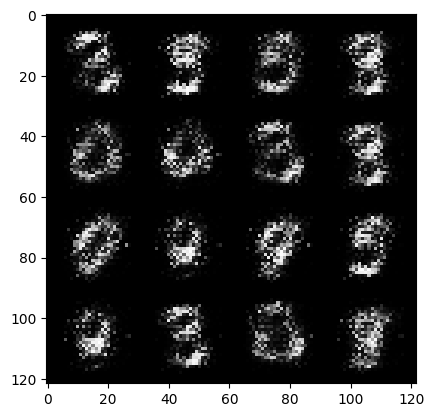

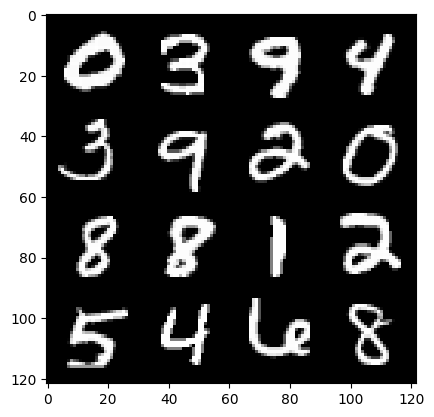

9: step 4500 / Gen loss: 5.865533995628352 / disc_loss: 0.01514439891868581


  0%|          | 0/469 [00:00<?, ?it/s]

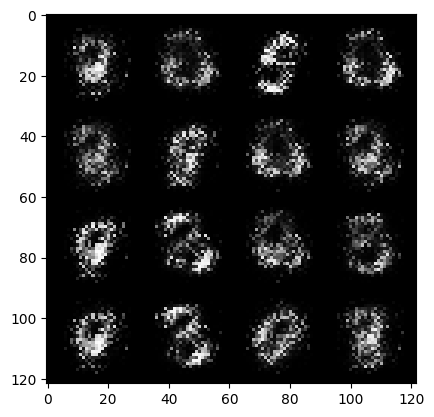

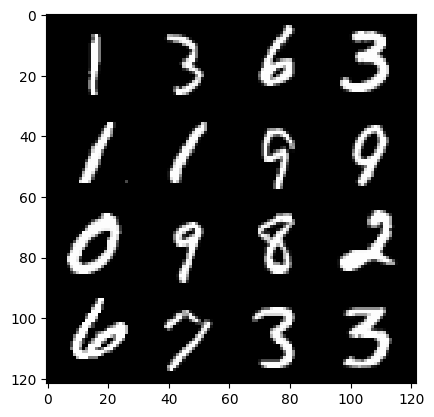

10: step 4800 / Gen loss: 6.339876136779786 / disc_loss: 0.01170849030526975


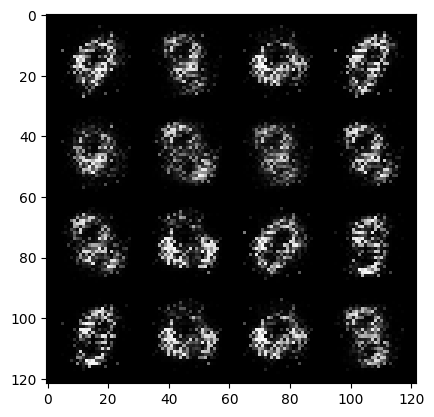

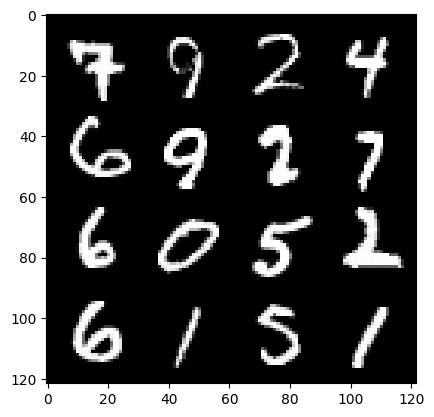

10: step 5100 / Gen loss: 6.134455990791323 / disc_loss: 0.011271908519168691


  0%|          | 0/469 [00:00<?, ?it/s]

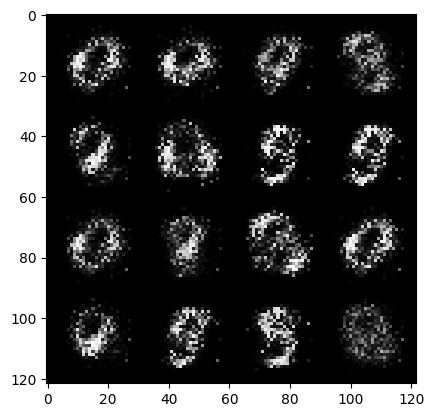

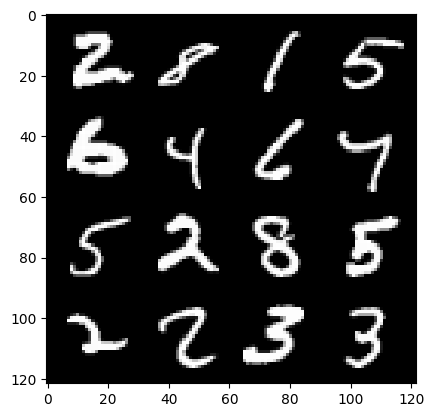

11: step 5400 / Gen loss: 6.683203953107194 / disc_loss: 0.010672752131552745


  0%|          | 0/469 [00:00<?, ?it/s]

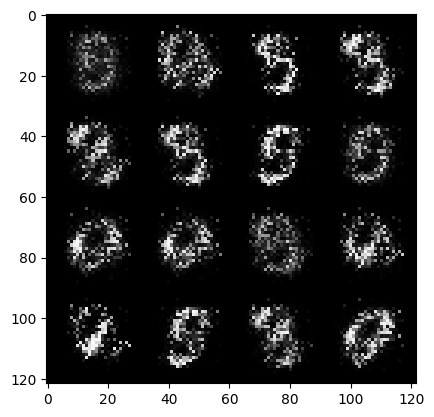

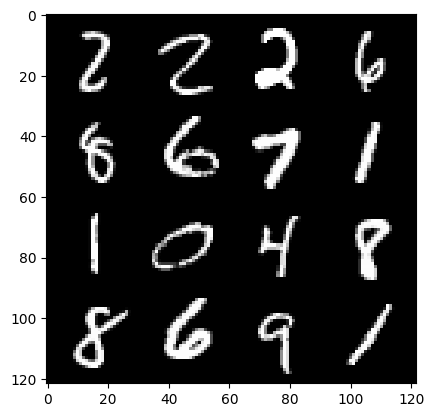

12: step 5700 / Gen loss: 6.675671849250798 / disc_loss: 0.00915943342881898


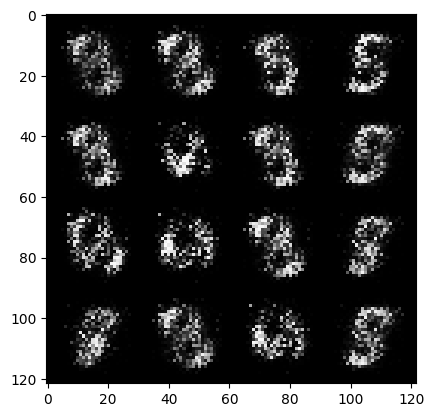

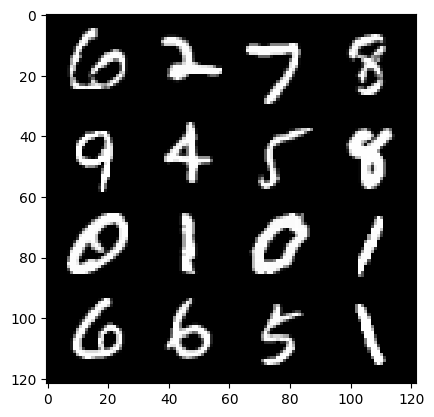

12: step 6000 / Gen loss: 6.91963449160258 / disc_loss: 0.00985662310461825


  0%|          | 0/469 [00:00<?, ?it/s]

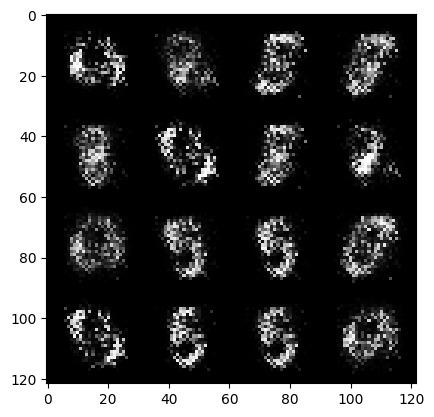

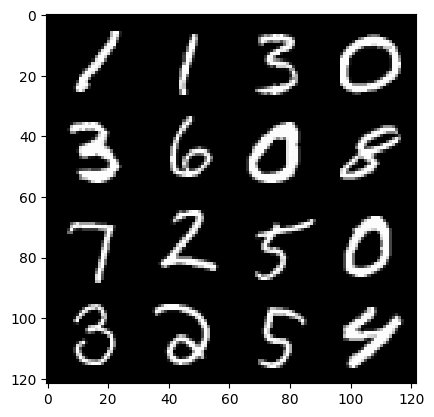

13: step 6300 / Gen loss: 6.958211355209353 / disc_loss: 0.011288866628116616


  0%|          | 0/469 [00:00<?, ?it/s]

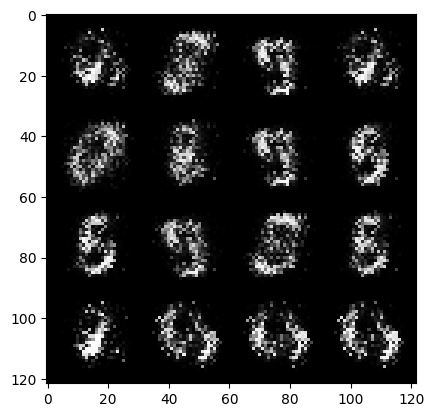

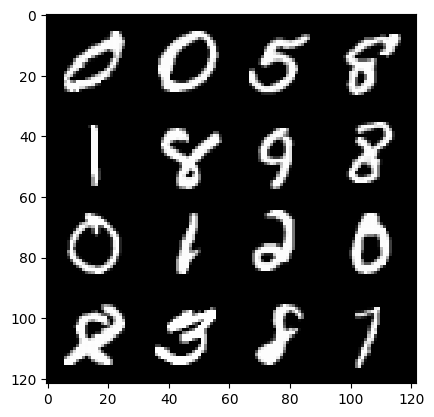

14: step 6600 / Gen loss: 7.035280060768129 / disc_loss: 0.012904928317293514


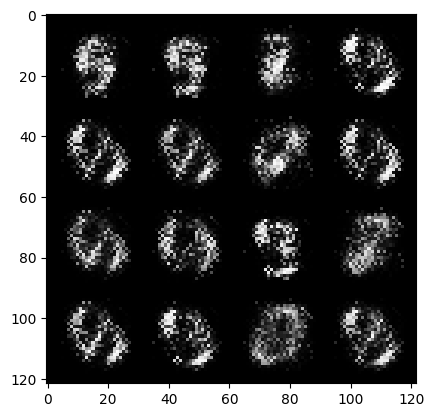

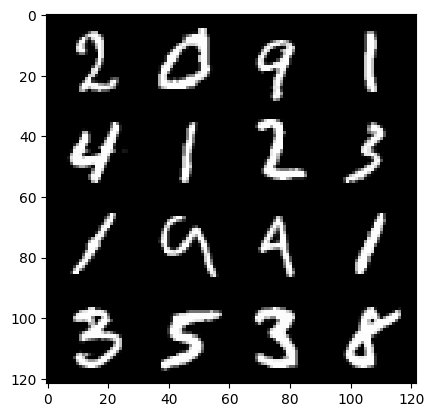

14: step 6900 / Gen loss: 7.4698909489313765 / disc_loss: 0.014147440524927024


  0%|          | 0/469 [00:00<?, ?it/s]

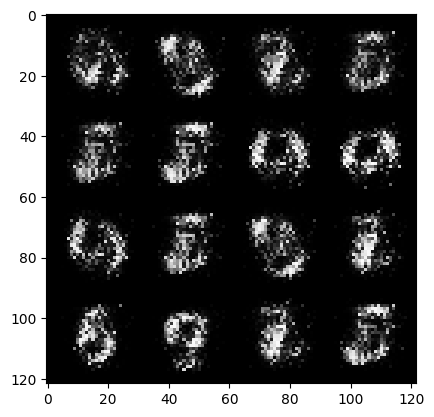

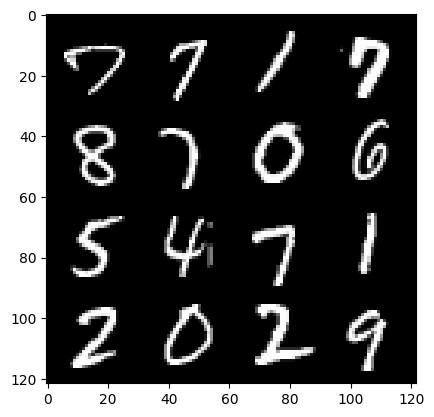

15: step 7200 / Gen loss: 7.195903714497887 / disc_loss: 0.014481056725295876


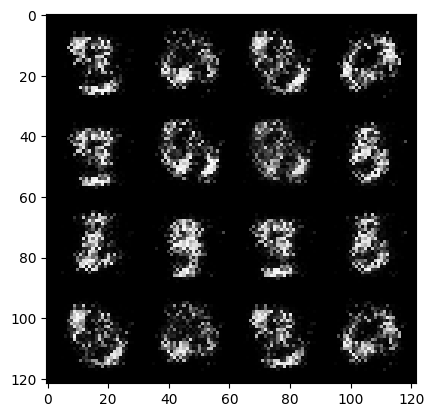

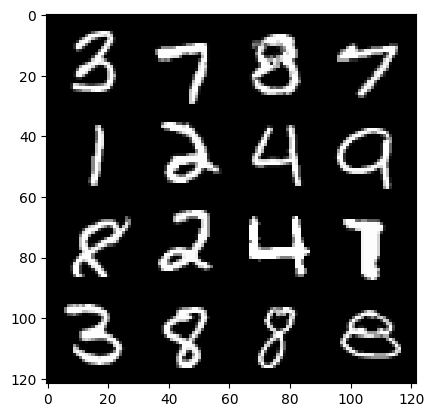

15: step 7500 / Gen loss: 6.803540364901224 / disc_loss: 0.012415893761596334


  0%|          | 0/469 [00:00<?, ?it/s]

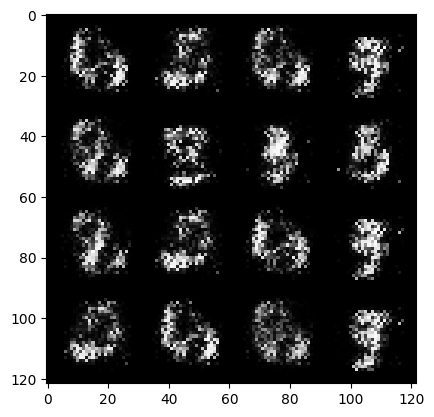

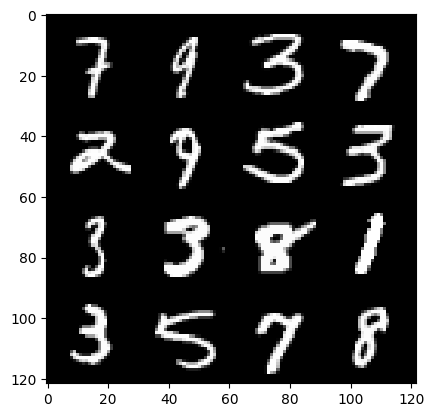

16: step 7800 / Gen loss: 6.6975084543228105 / disc_loss: 0.010612443005666135


  0%|          | 0/469 [00:00<?, ?it/s]

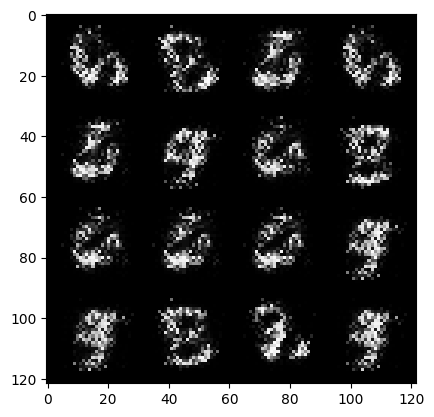

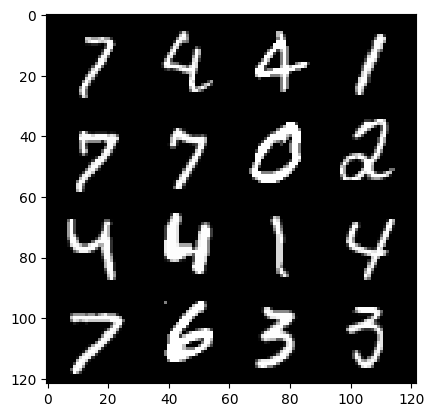

17: step 8100 / Gen loss: 7.214851851463316 / disc_loss: 0.010767915514297784


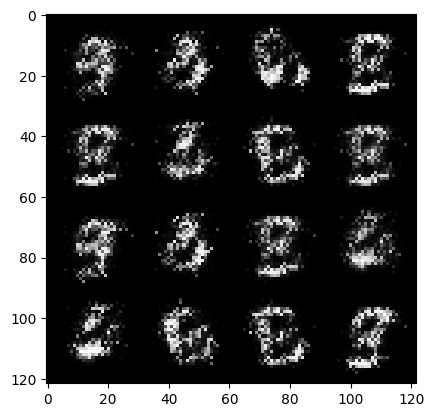

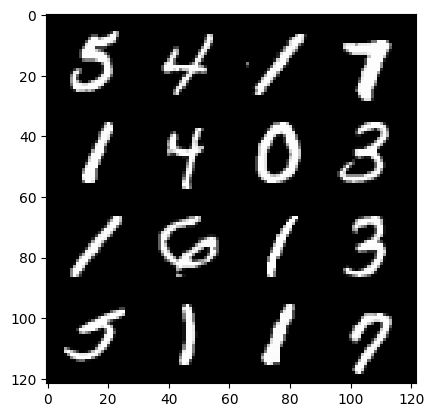

17: step 8400 / Gen loss: 7.343817543983457 / disc_loss: 0.011645348774036397


  0%|          | 0/469 [00:00<?, ?it/s]

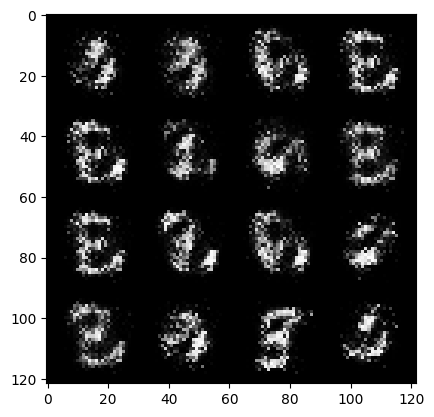

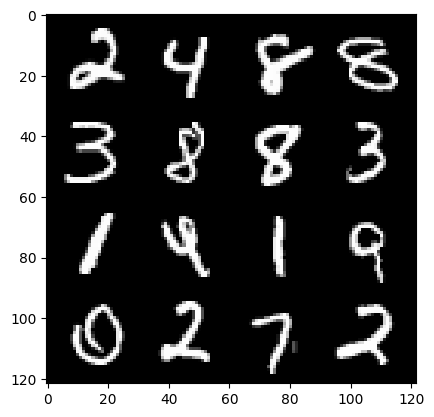

18: step 8700 / Gen loss: 6.863991759618125 / disc_loss: 0.013096157558417566


  0%|          | 0/469 [00:00<?, ?it/s]

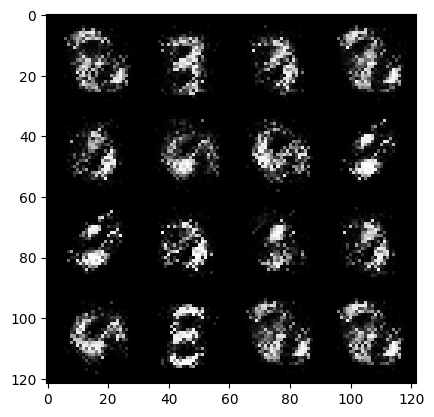

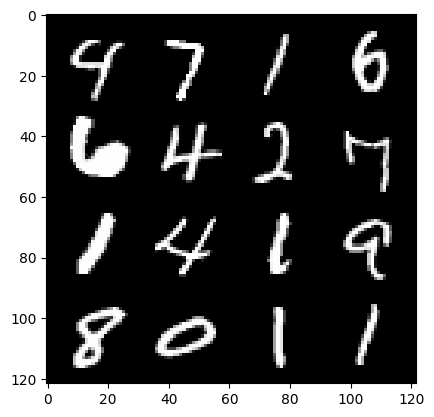

19: step 9000 / Gen loss: 6.511455202102661 / disc_loss: 0.014054225107344484


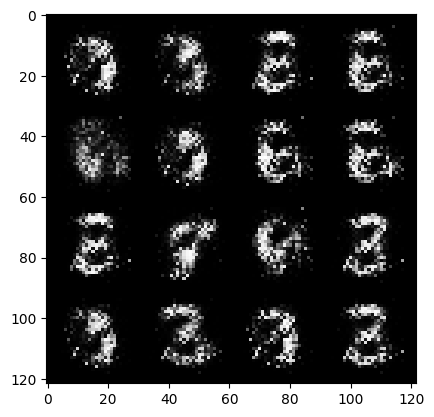

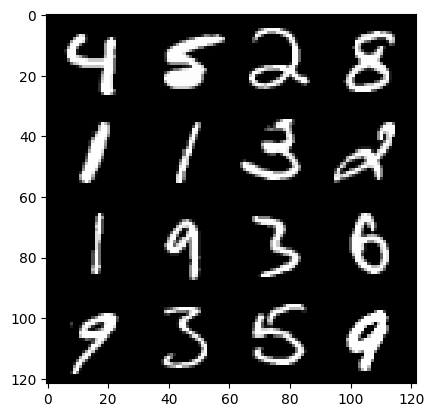

19: step 9300 / Gen loss: 6.714690508842468 / disc_loss: 0.011761957119063766


  0%|          | 0/469 [00:00<?, ?it/s]

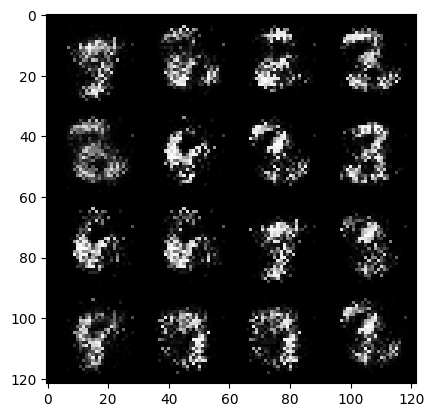

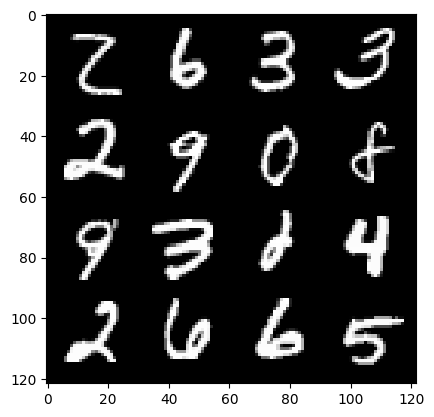

20: step 9600 / Gen loss: 6.797554725011188 / disc_loss: 0.009263786517549309


  0%|          | 0/469 [00:00<?, ?it/s]

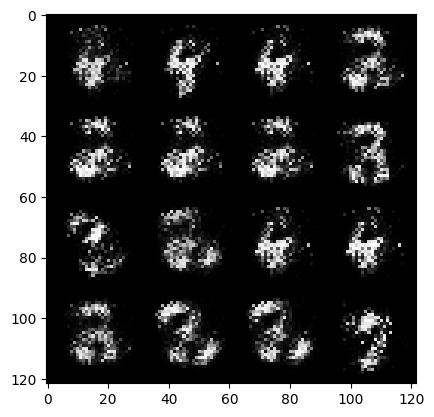

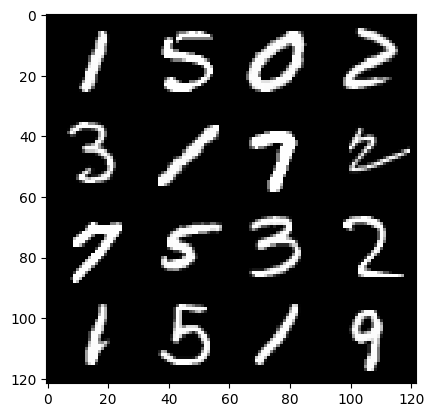

21: step 9900 / Gen loss: 6.848965757687888 / disc_loss: 0.008607642748393117


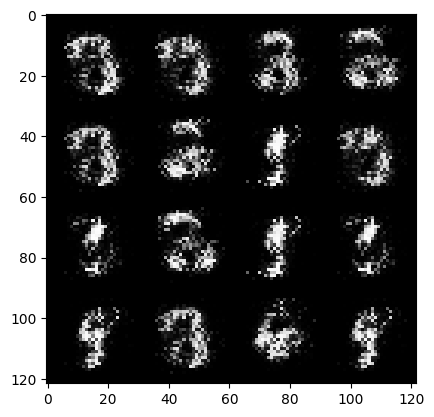

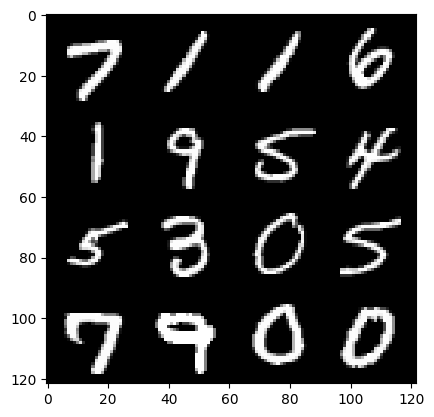

21: step 10200 / Gen loss: 7.097505489985144 / disc_loss: 0.009288638037396596


  0%|          | 0/469 [00:00<?, ?it/s]

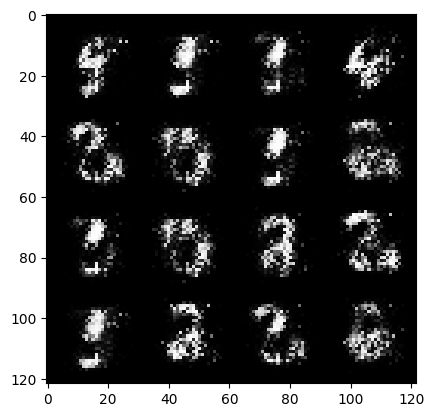

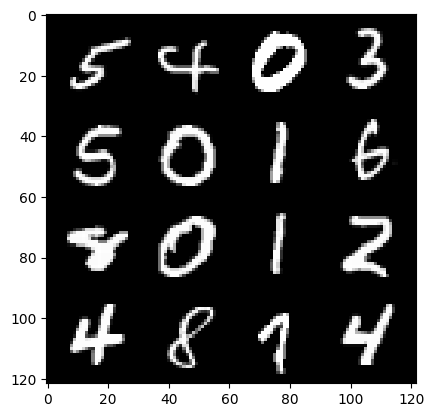

22: step 10500 / Gen loss: 7.614222299257918 / disc_loss: 0.009607526931989319


  0%|          | 0/469 [00:00<?, ?it/s]

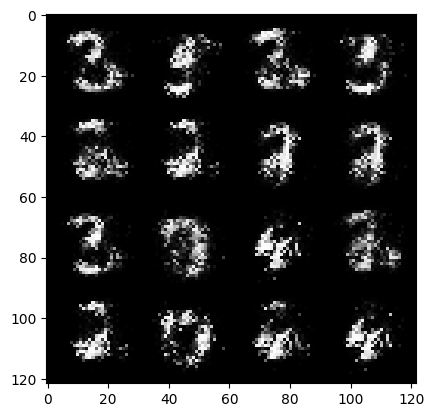

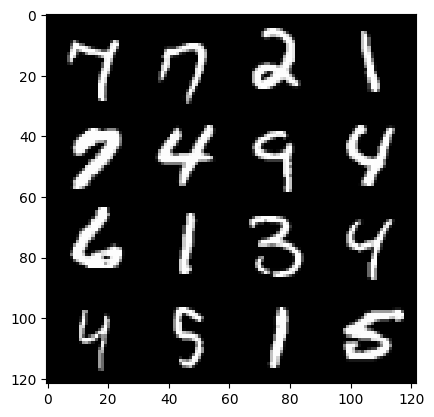

23: step 10800 / Gen loss: 7.384140977859497 / disc_loss: 0.008965475796333826


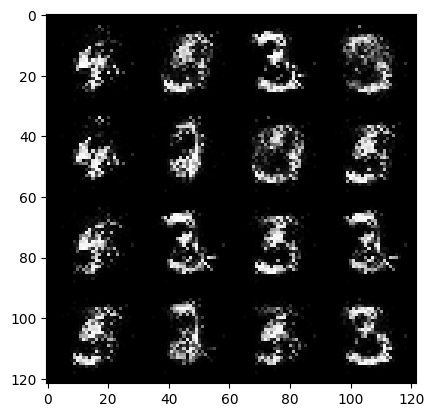

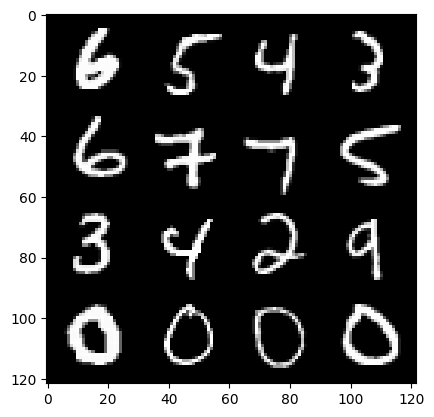

23: step 11100 / Gen loss: 7.283450263341264 / disc_loss: 0.008551085587435715


  0%|          | 0/469 [00:00<?, ?it/s]

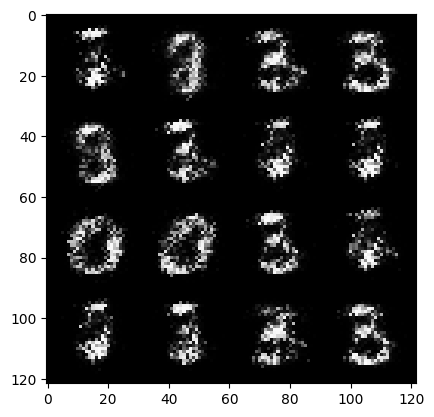

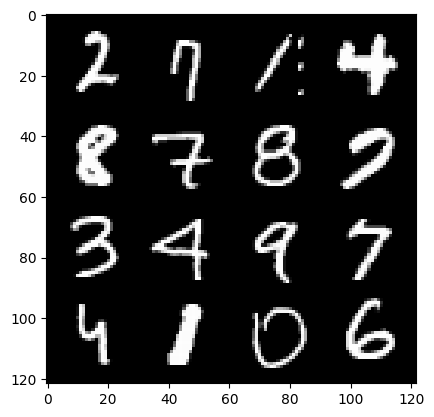

24: step 11400 / Gen loss: 7.002885848681128 / disc_loss: 0.008593312462326143


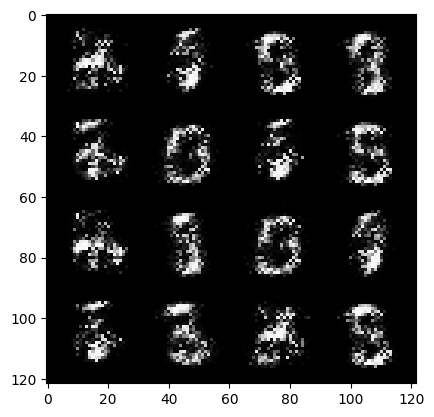

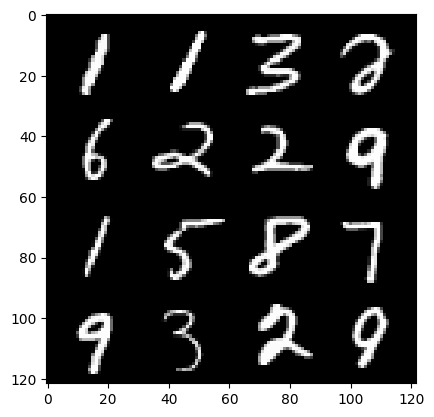

24: step 11700 / Gen loss: 6.617106973330179 / disc_loss: 0.008849576085728282


  0%|          | 0/469 [00:00<?, ?it/s]

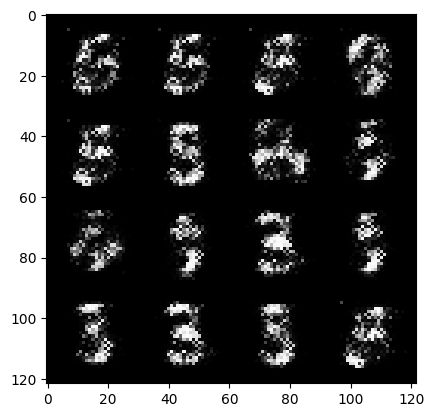

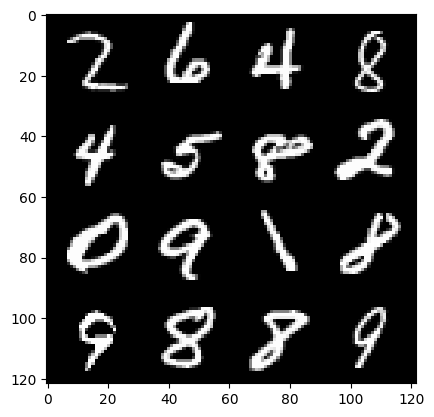

25: step 12000 / Gen loss: 6.848052150408431 / disc_loss: 0.010897418458868447


  0%|          | 0/469 [00:00<?, ?it/s]

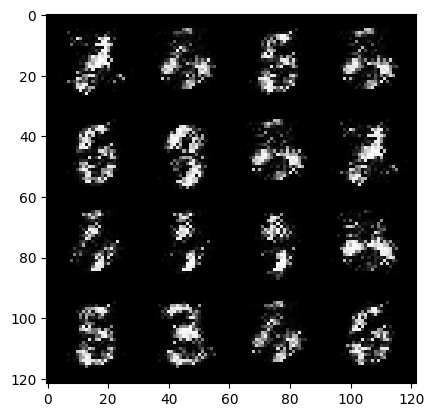

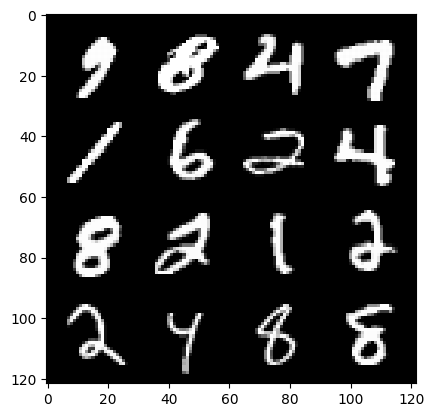

26: step 12300 / Gen loss: 6.685107841491704 / disc_loss: 0.010314510509682209


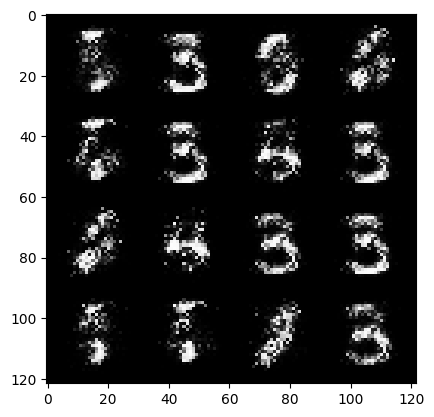

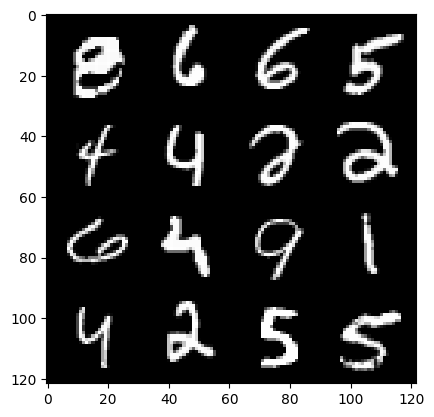

26: step 12600 / Gen loss: 6.393905102411908 / disc_loss: 0.013477517069162188


  0%|          | 0/469 [00:00<?, ?it/s]

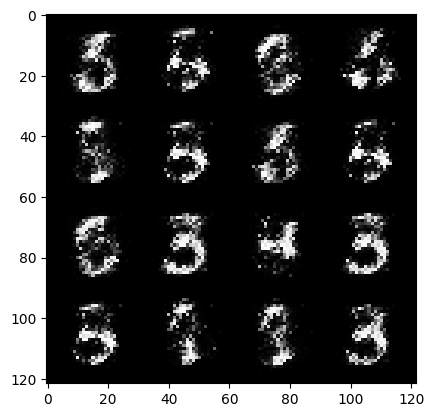

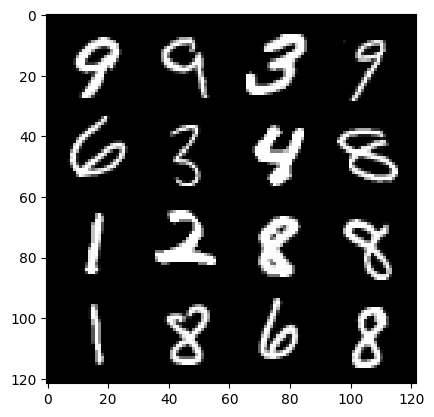

27: step 12900 / Gen loss: 6.335830957094828 / disc_loss: 0.01188104006461799


  0%|          | 0/469 [00:00<?, ?it/s]

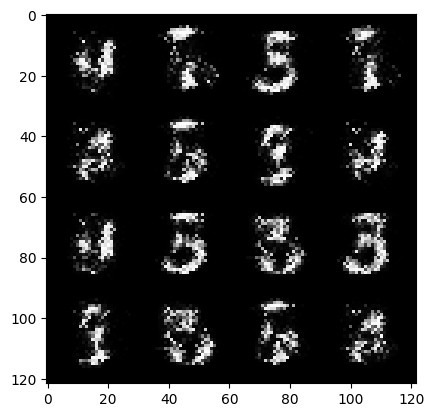

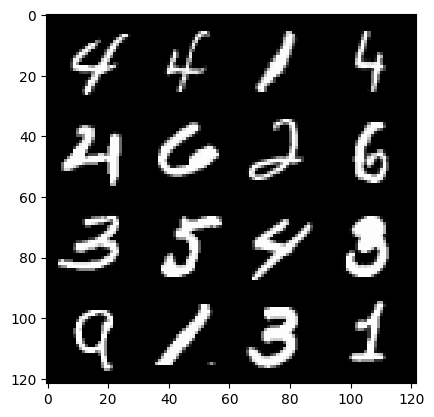

28: step 13200 / Gen loss: 6.139956129391987 / disc_loss: 0.015160553885313375


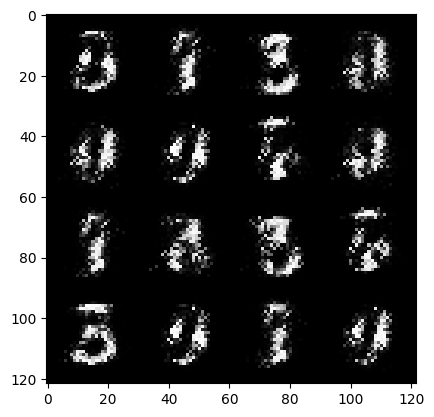

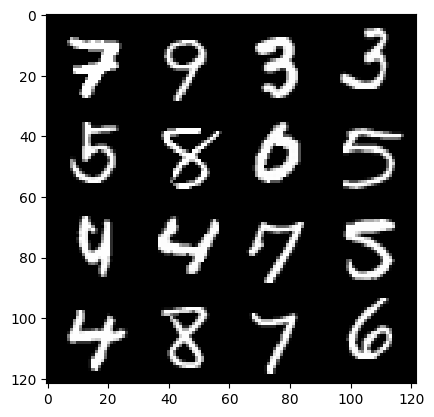

28: step 13500 / Gen loss: 6.1443747854232775 / disc_loss: 0.013733285827717434


  0%|          | 0/469 [00:00<?, ?it/s]

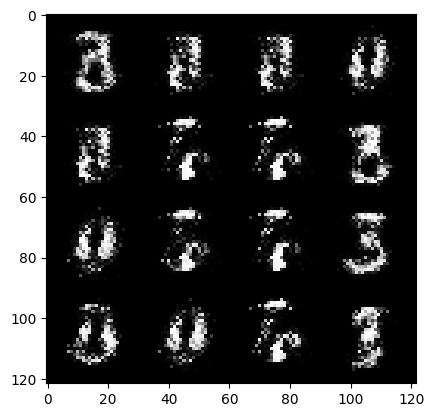

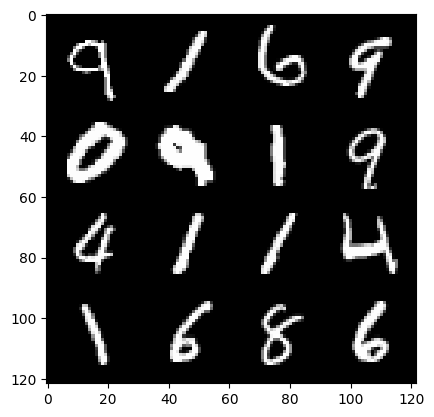

29: step 13800 / Gen loss: 6.464474339485166 / disc_loss: 0.011560763526552678


  0%|          | 0/469 [00:00<?, ?it/s]

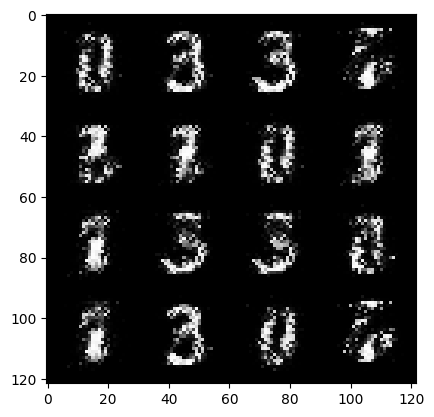

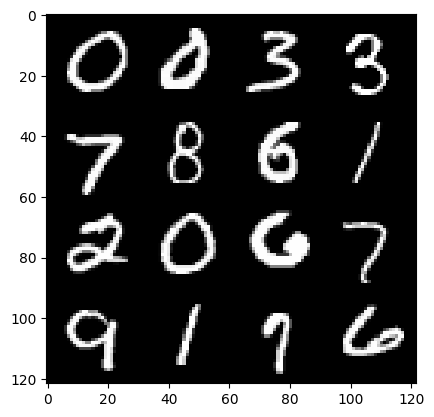

30: step 14100 / Gen loss: 6.683625734647114 / disc_loss: 0.010732670143479485


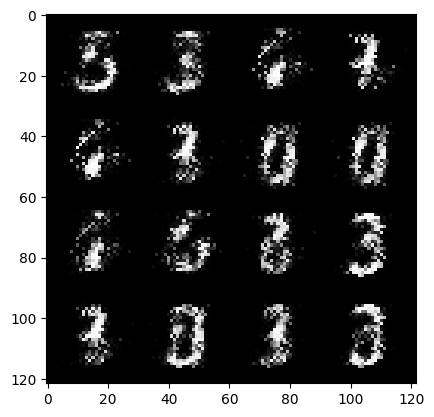

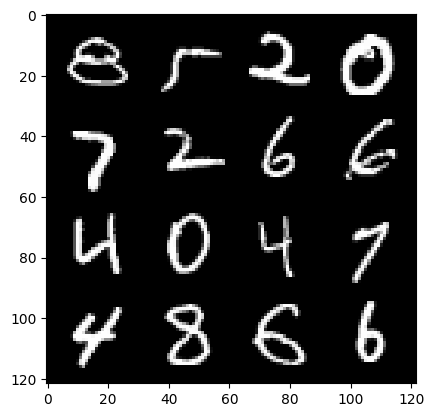

30: step 14400 / Gen loss: 7.4854582452774086 / disc_loss: 0.01007030408014543


  0%|          | 0/469 [00:00<?, ?it/s]

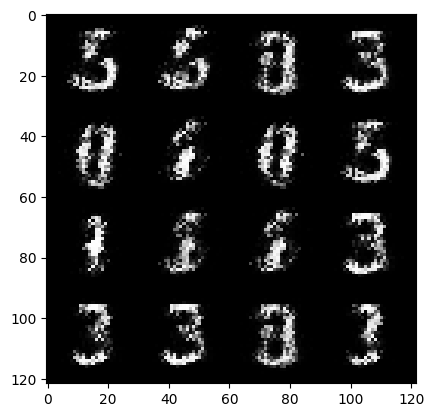

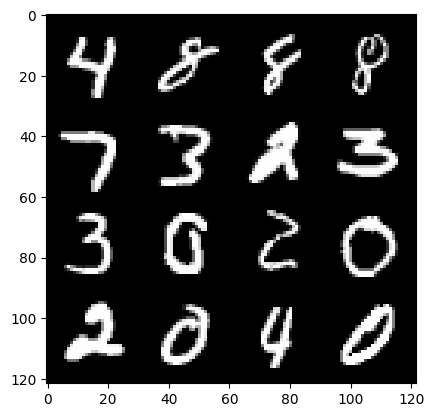

31: step 14700 / Gen loss: 6.65128294150035 / disc_loss: 0.012226008941264212


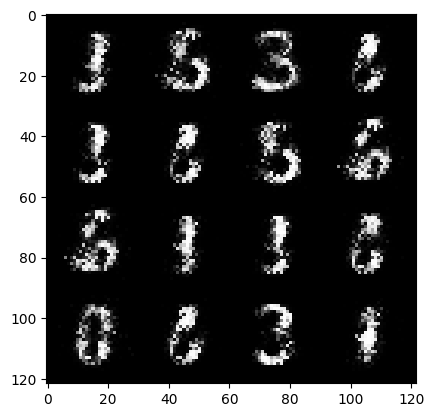

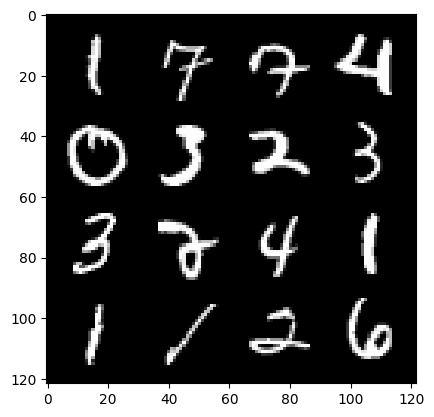

31: step 15000 / Gen loss: 6.822263970375064 / disc_loss: 0.017223373637534668


  0%|          | 0/469 [00:00<?, ?it/s]

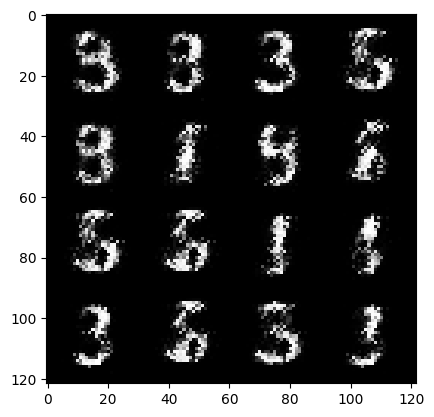

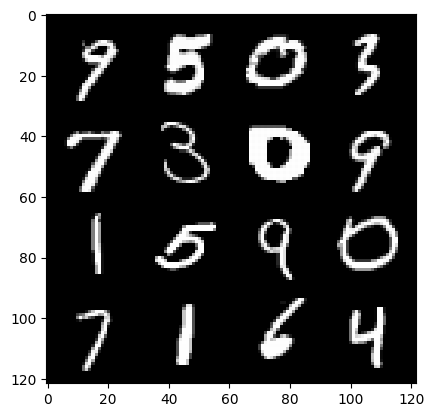

32: step 15300 / Gen loss: 6.21100889046987 / disc_loss: 0.017698230155122778


  0%|          | 0/469 [00:00<?, ?it/s]

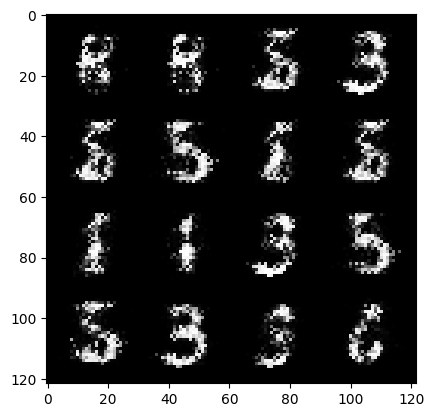

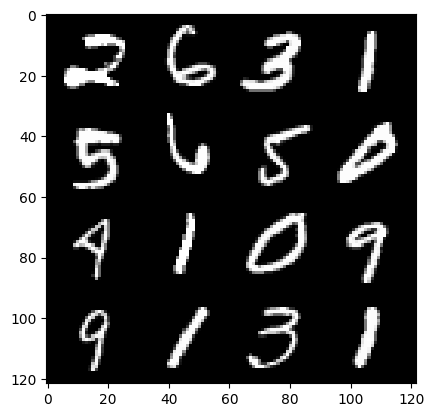

33: step 15600 / Gen loss: 6.375525492032369 / disc_loss: 0.014627673927461728


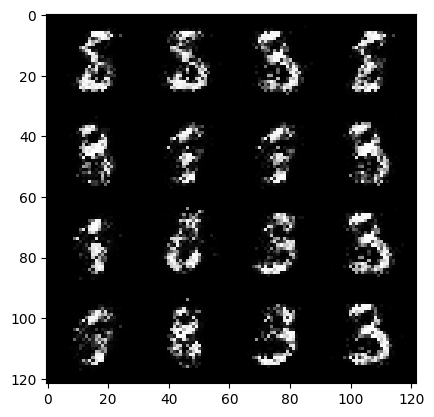

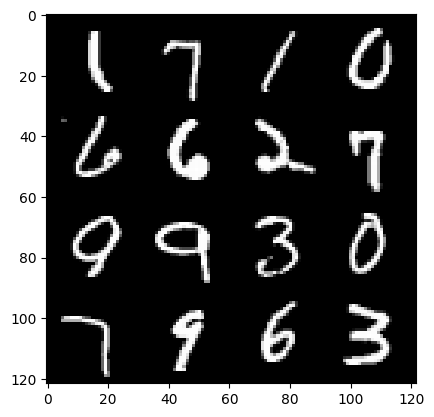

33: step 15900 / Gen loss: 6.803691898981728 / disc_loss: 0.013443783893405153


  0%|          | 0/469 [00:00<?, ?it/s]

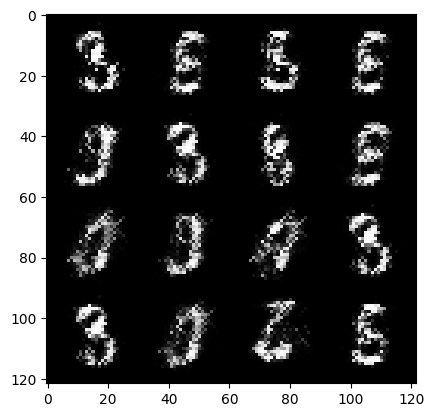

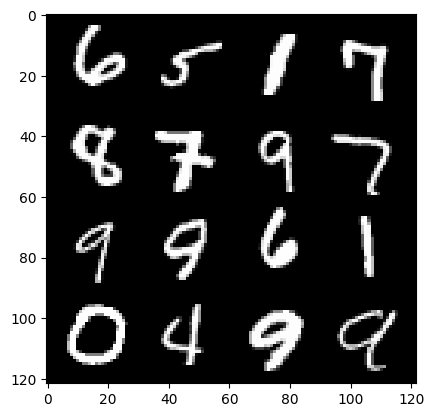

34: step 16200 / Gen loss: 6.453142204284666 / disc_loss: 0.017145692902461943


  0%|          | 0/469 [00:00<?, ?it/s]

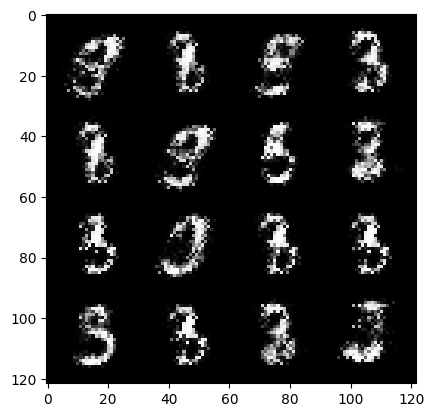

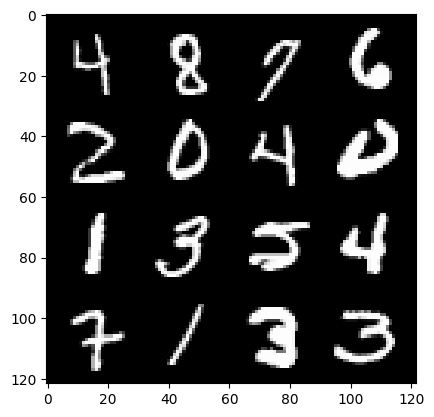

35: step 16500 / Gen loss: 6.362810905774439 / disc_loss: 0.01977552819841853


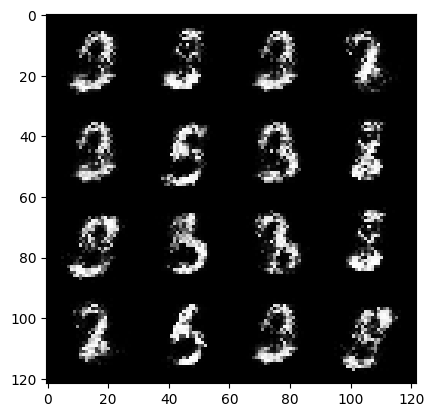

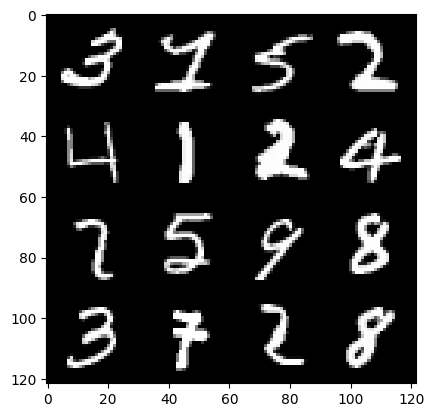

35: step 16800 / Gen loss: 6.235790254275003 / disc_loss: 0.019978666323780384


  0%|          | 0/469 [00:00<?, ?it/s]

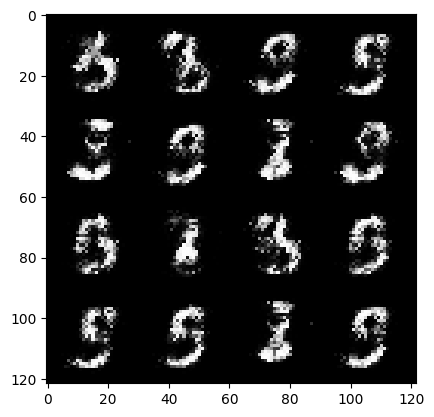

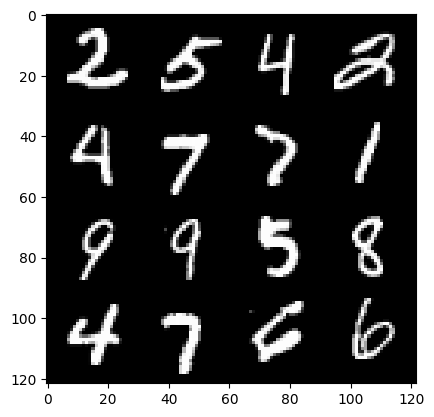

36: step 17100 / Gen loss: 6.315200058619173 / disc_loss: 0.02105211900857587


  0%|          | 0/469 [00:00<?, ?it/s]

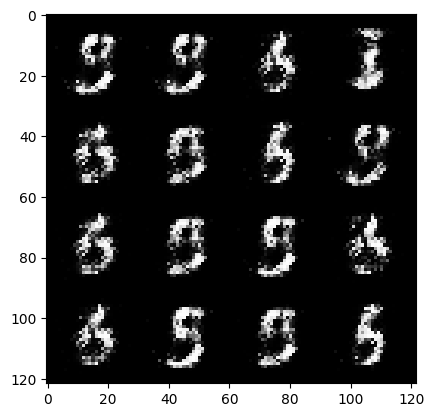

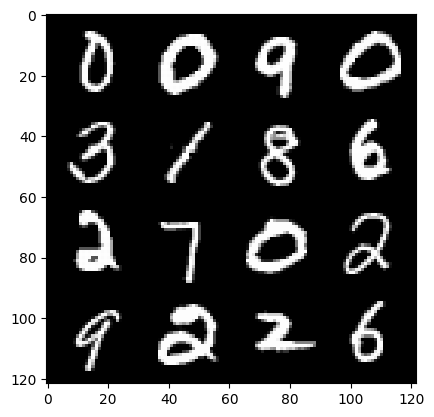

37: step 17400 / Gen loss: 6.3135540056228665 / disc_loss: 0.019933993936671557


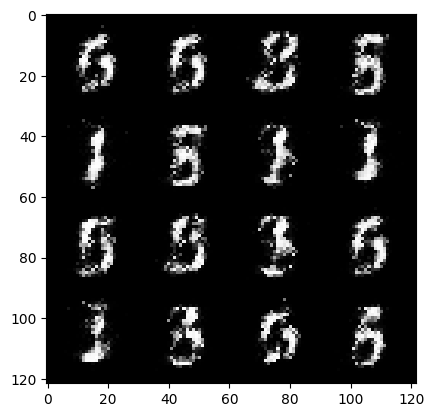

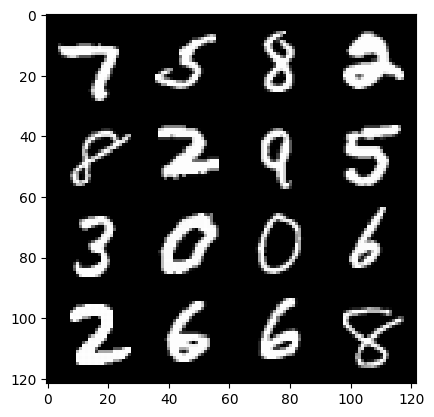

37: step 17700 / Gen loss: 6.28241918881734 / disc_loss: 0.021063468143499145


  0%|          | 0/469 [00:00<?, ?it/s]

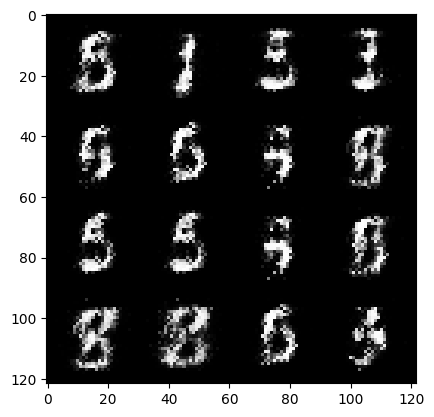

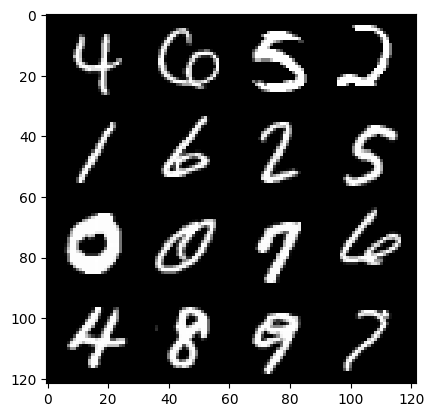

38: step 18000 / Gen loss: 6.075132296880088 / disc_loss: 0.025999856628477556


  0%|          | 0/469 [00:00<?, ?it/s]

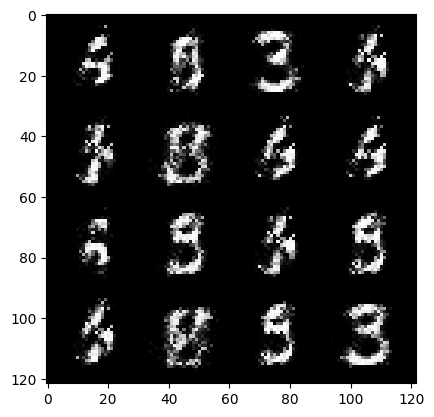

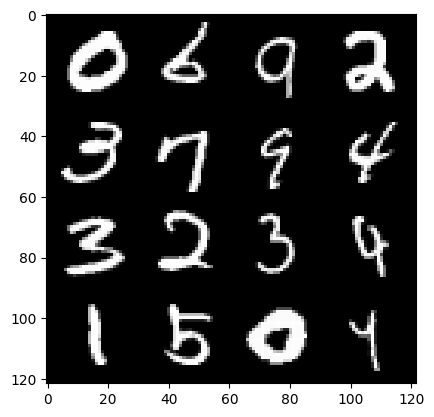

39: step 18300 / Gen loss: 5.794502080281582 / disc_loss: 0.028611164861358705


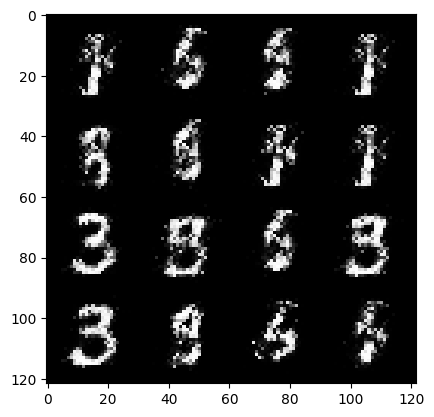

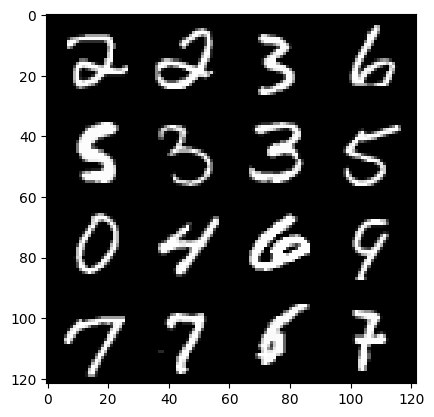

39: step 18600 / Gen loss: 6.032466572125758 / disc_loss: 0.023148282856370023


  0%|          | 0/469 [00:00<?, ?it/s]

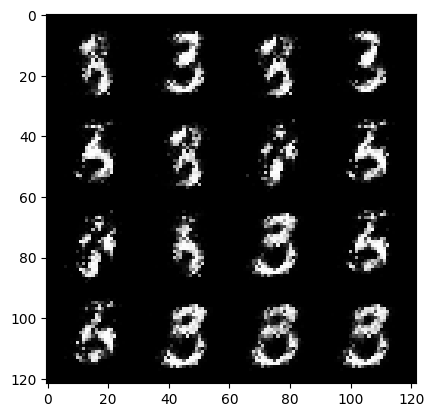

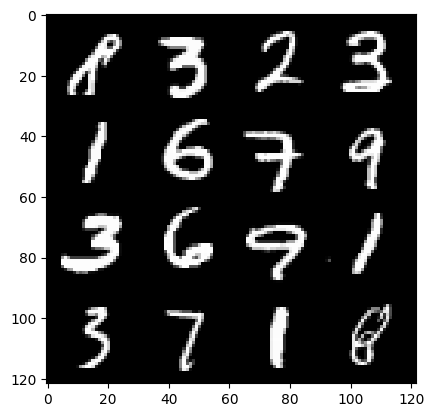

40: step 18900 / Gen loss: 6.127998998959863 / disc_loss: 0.02794331026729195


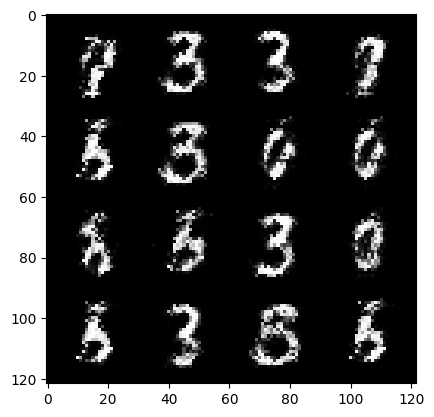

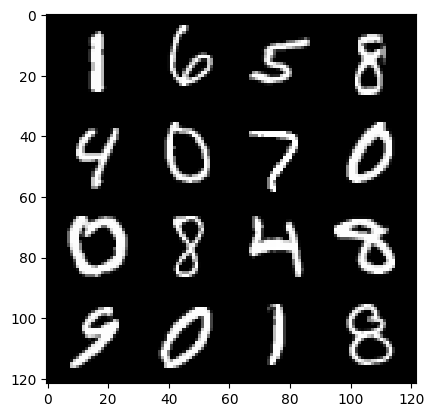

40: step 19200 / Gen loss: 6.101467180252076 / disc_loss: 0.03214346789289265


  0%|          | 0/469 [00:00<?, ?it/s]

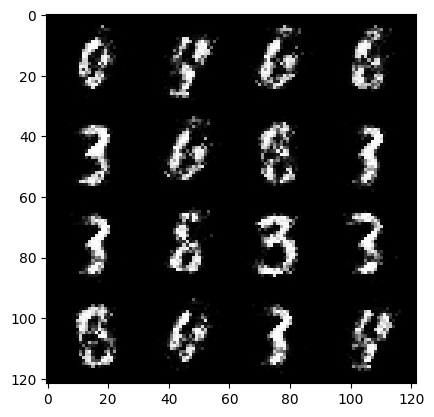

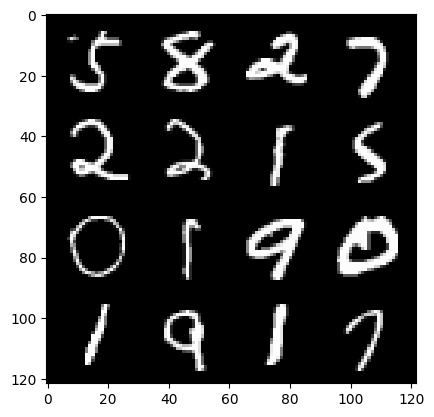

41: step 19500 / Gen loss: 6.003579033215843 / disc_loss: 0.0331829950477307


  0%|          | 0/469 [00:00<?, ?it/s]

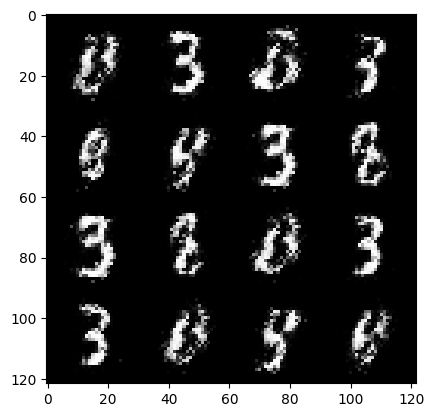

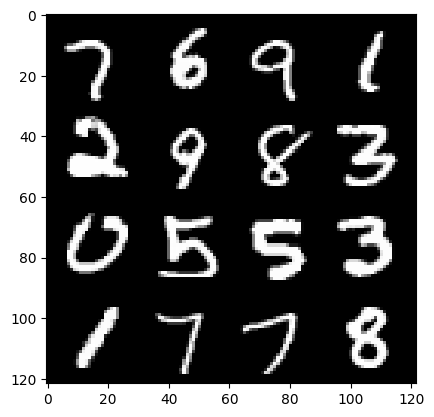

42: step 19800 / Gen loss: 5.5821820449829085 / disc_loss: 0.03424071030380825


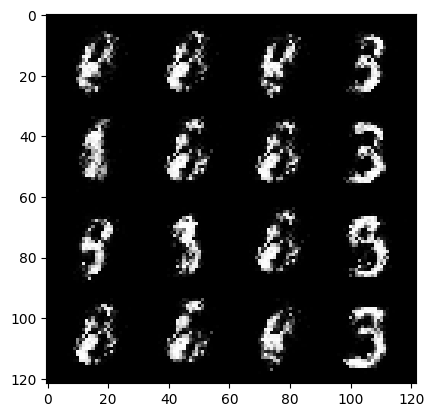

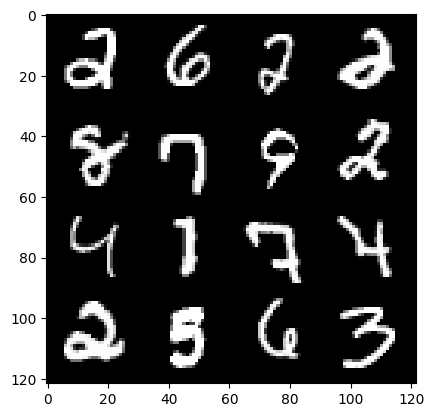

42: step 20100 / Gen loss: 5.396446914672852 / disc_loss: 0.0325194287331154


  0%|          | 0/469 [00:00<?, ?it/s]

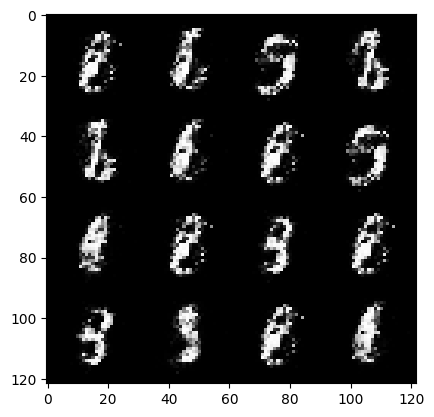

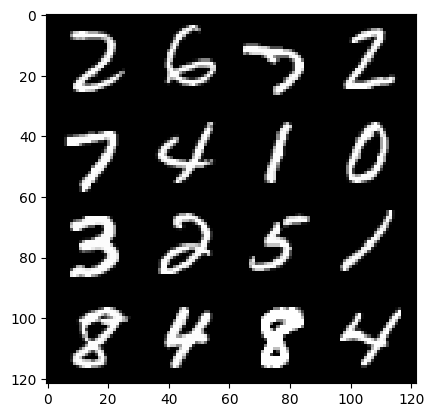

43: step 20400 / Gen loss: 5.610977505048118 / disc_loss: 0.0262866200483404


  0%|          | 0/469 [00:00<?, ?it/s]

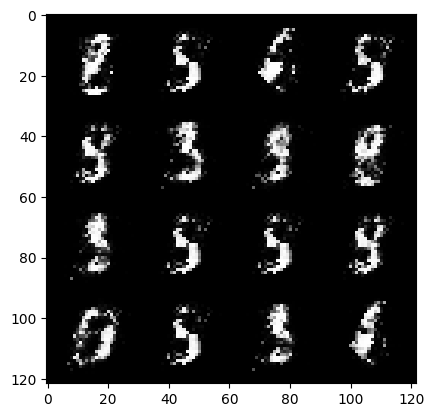

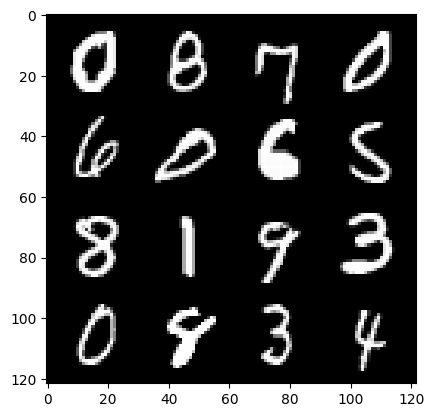

44: step 20700 / Gen loss: 5.901161845525106 / disc_loss: 0.024564303283113983


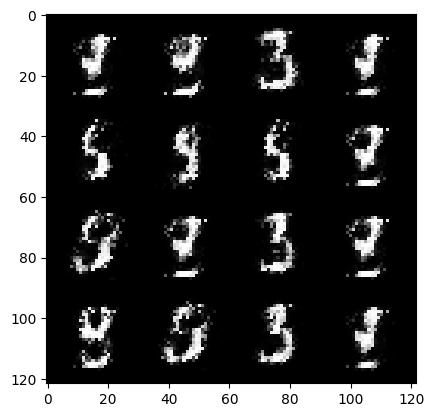

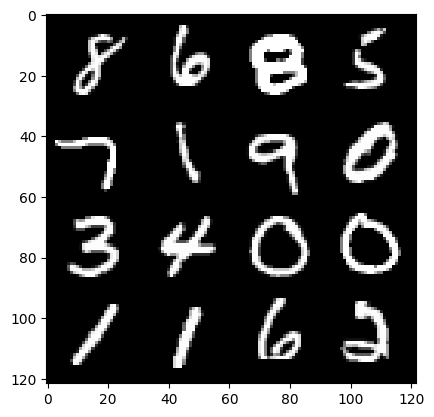

44: step 21000 / Gen loss: 5.826726767222084 / disc_loss: 0.027363577399713297


  0%|          | 0/469 [00:00<?, ?it/s]

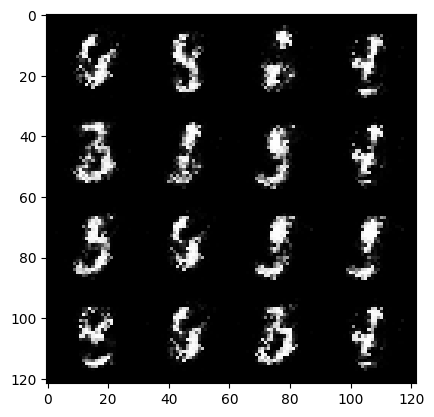

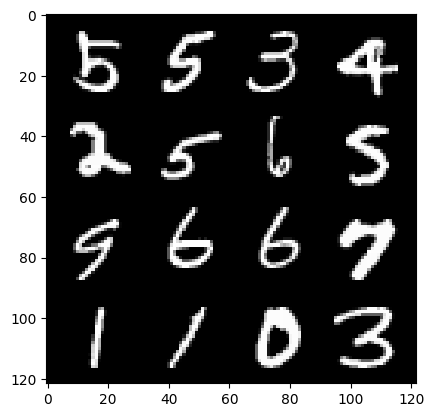

45: step 21300 / Gen loss: 5.608266884485887 / disc_loss: 0.033824543991747


  0%|          | 0/469 [00:00<?, ?it/s]

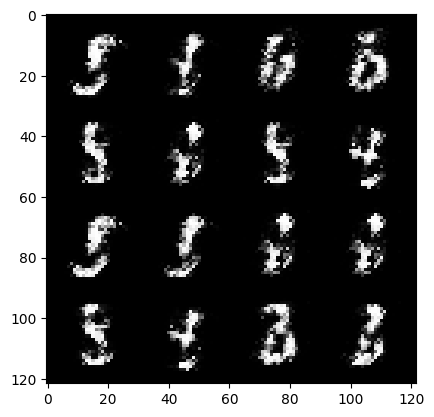

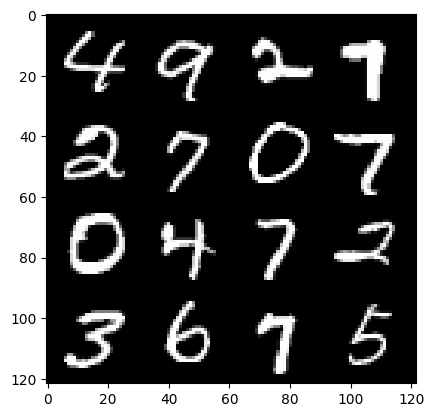

46: step 21600 / Gen loss: 5.783997373580935 / disc_loss: 0.03003791849905003


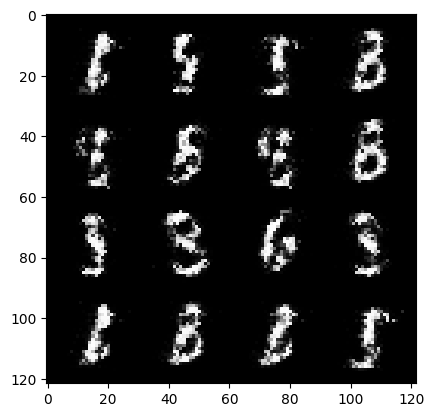

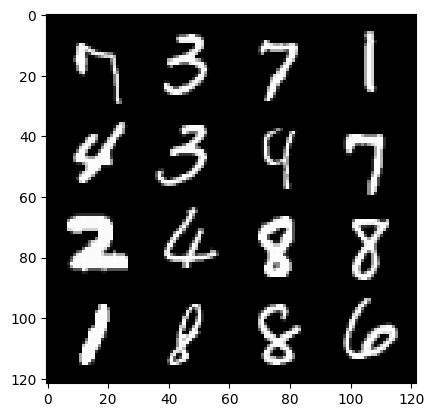

46: step 21900 / Gen loss: 5.470490277608232 / disc_loss: 0.033683159099891745


  0%|          | 0/469 [00:00<?, ?it/s]

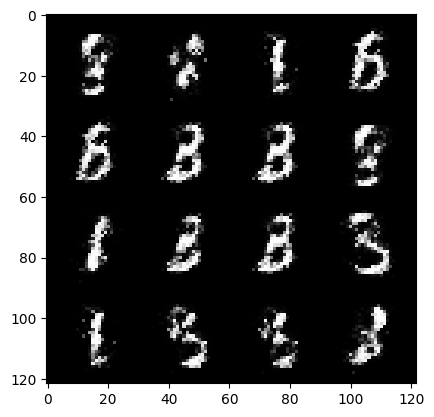

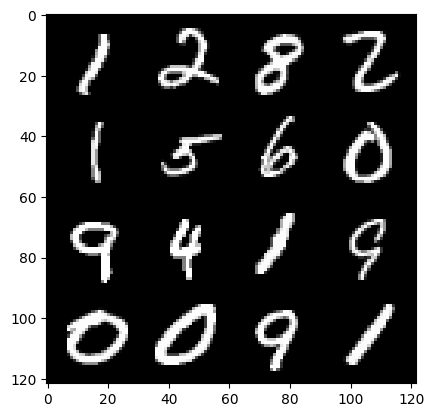

47: step 22200 / Gen loss: 5.8802246761322055 / disc_loss: 0.03408808316259334


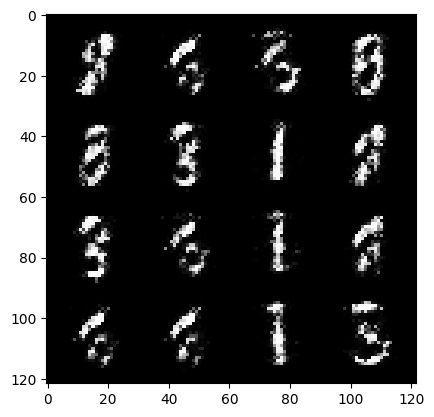

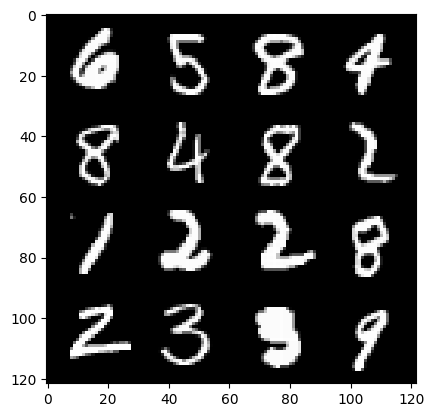

47: step 22500 / Gen loss: 5.299958227475484 / disc_loss: 0.040211419879148384


  0%|          | 0/469 [00:00<?, ?it/s]

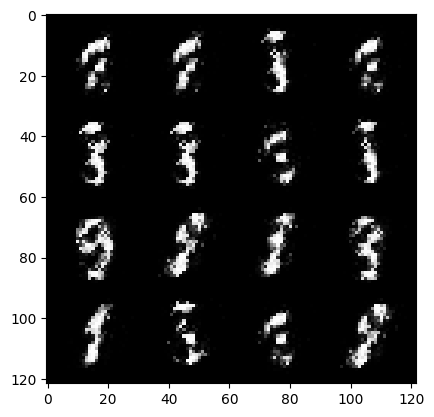

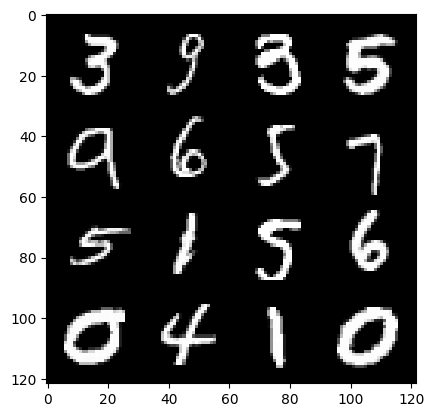

48: step 22800 / Gen loss: 5.678421427408854 / disc_loss: 0.04872991137206556


  0%|          | 0/469 [00:00<?, ?it/s]

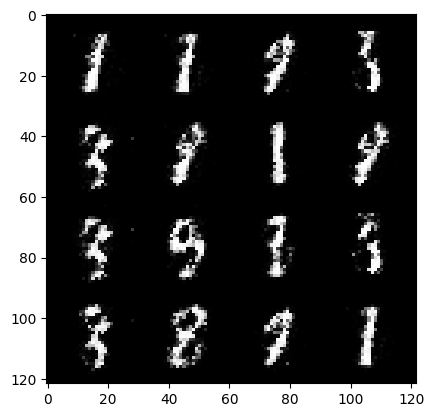

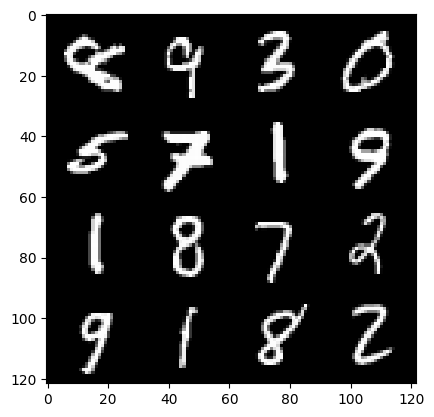

49: step 23100 / Gen loss: 5.412799070676167 / disc_loss: 0.042134938538074505


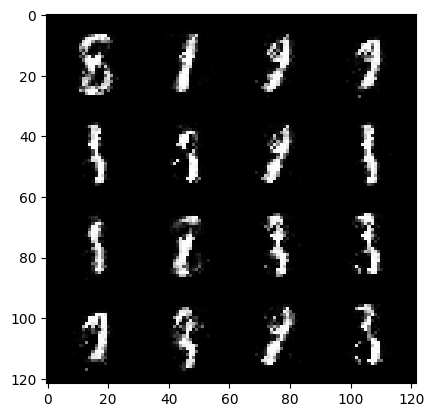

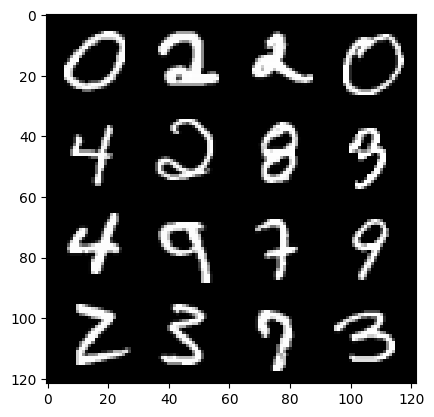

49: step 23400 / Gen loss: 5.094844039281209 / disc_loss: 0.04303403095652658


  0%|          | 0/469 [00:00<?, ?it/s]

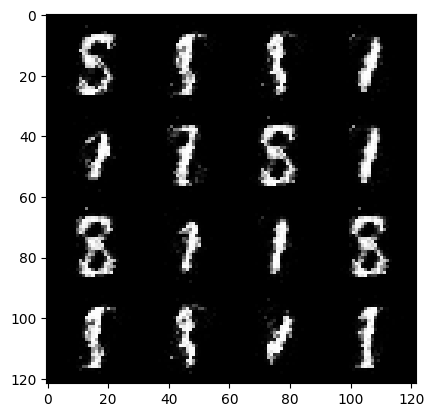

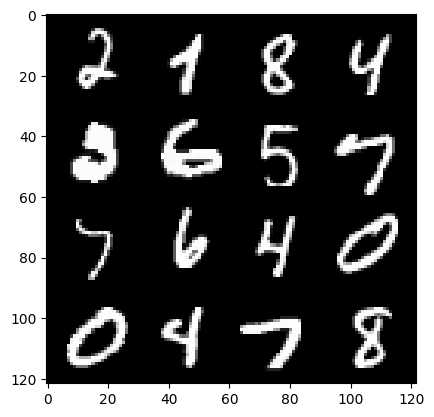

50: step 23700 / Gen loss: 5.131615004539489 / disc_loss: 0.04368906007148323


  0%|          | 0/469 [00:00<?, ?it/s]

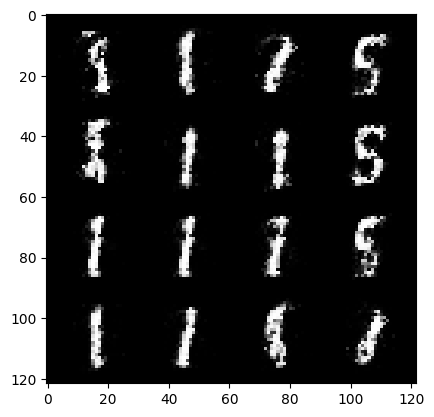

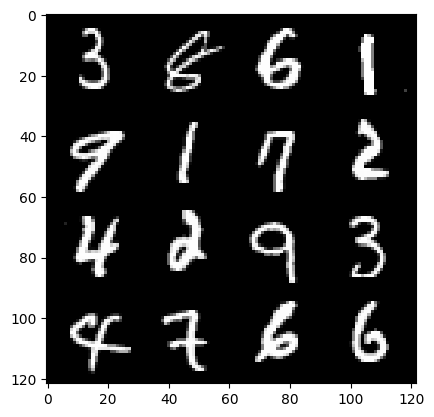

51: step 24000 / Gen loss: 5.27017853895823 / disc_loss: 0.042580773066729305


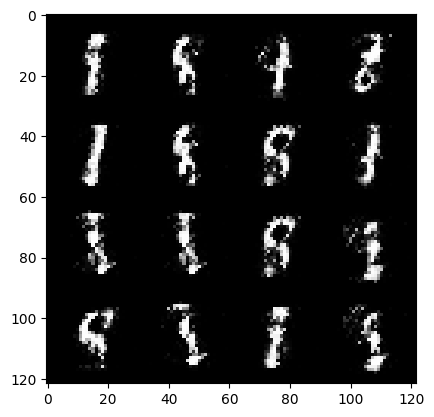

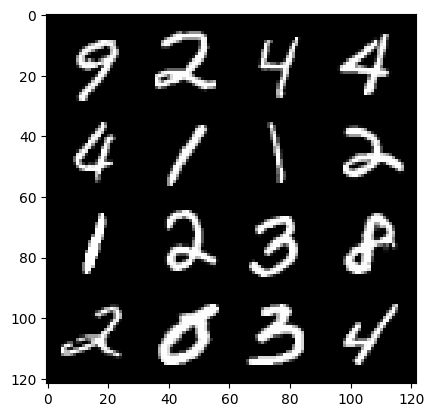

51: step 24300 / Gen loss: 5.287615491549175 / disc_loss: 0.049452564176171956


  0%|          | 0/469 [00:00<?, ?it/s]

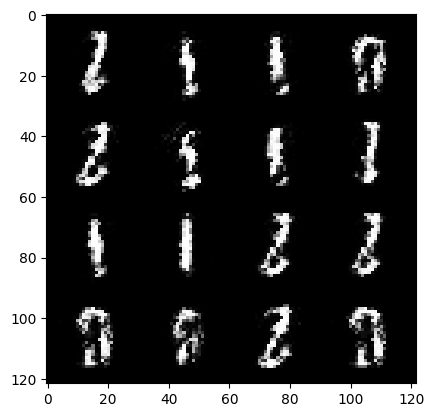

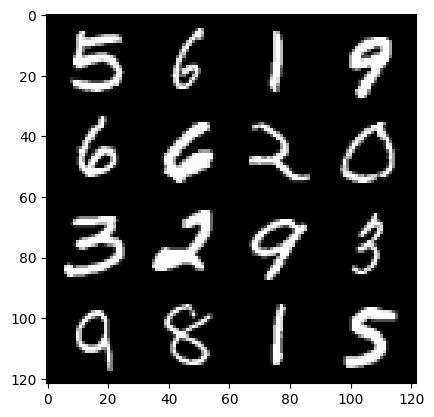

52: step 24600 / Gen loss: 4.658340156078337 / disc_loss: 0.06916213218122727


  0%|          | 0/469 [00:00<?, ?it/s]

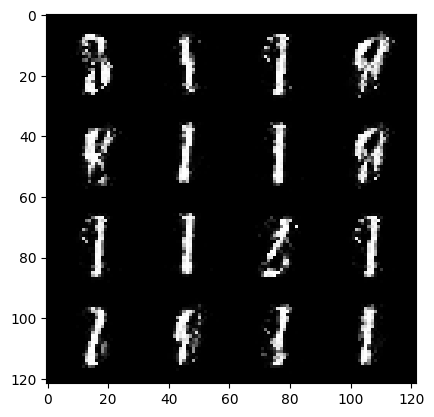

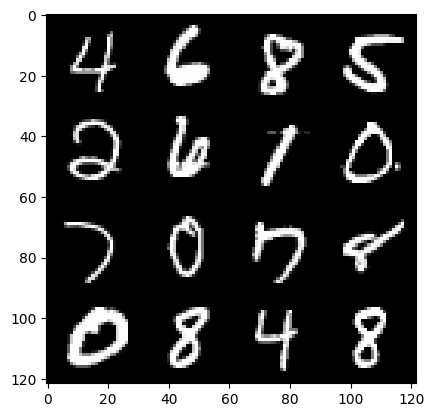

53: step 24900 / Gen loss: 4.5396843735377 / disc_loss: 0.06683258285125097


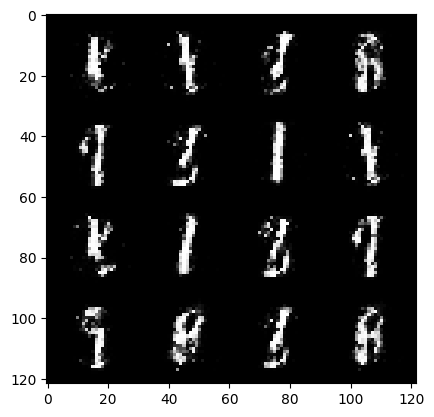

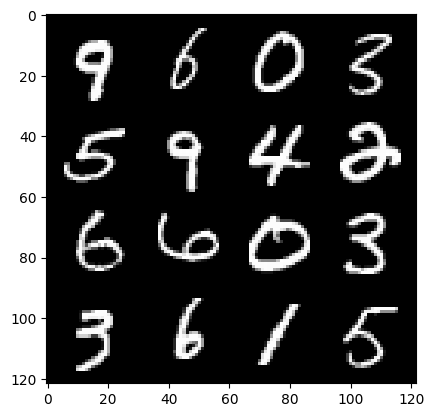

53: step 25200 / Gen loss: 4.708365852832794 / disc_loss: 0.06038040367886427


  0%|          | 0/469 [00:00<?, ?it/s]

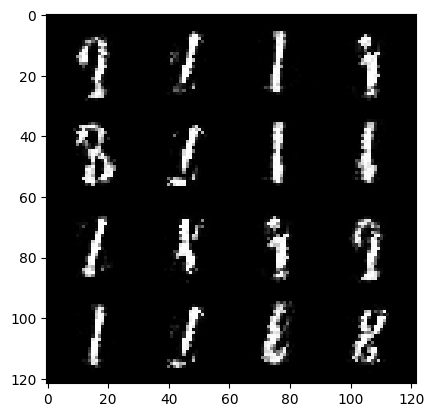

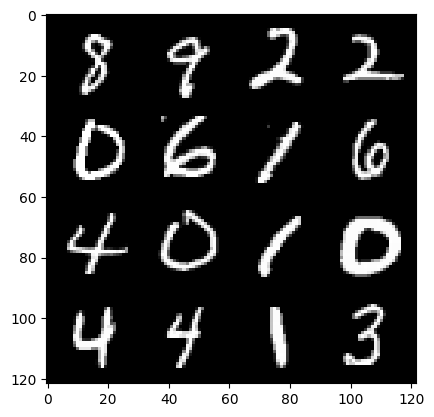

54: step 25500 / Gen loss: 4.739643143018085 / disc_loss: 0.07253032616650064


  0%|          | 0/469 [00:00<?, ?it/s]

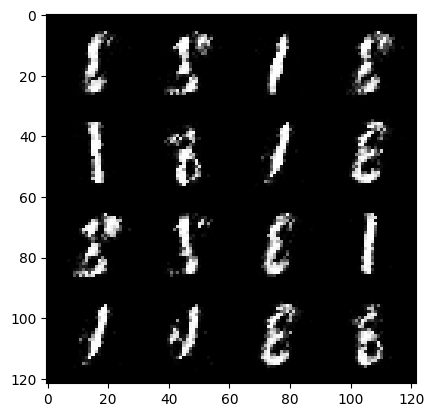

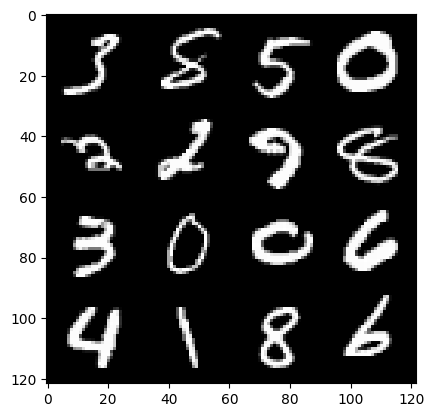

55: step 25800 / Gen loss: 4.440391008853911 / disc_loss: 0.08950193937246997


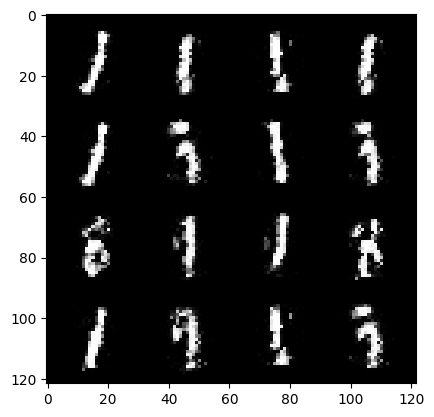

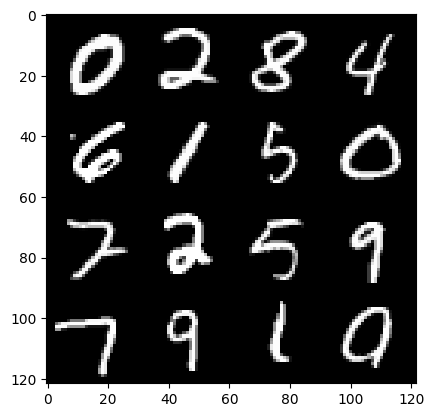

55: step 26100 / Gen loss: 4.595064671039579 / disc_loss: 0.07385270029306414


  0%|          | 0/469 [00:00<?, ?it/s]

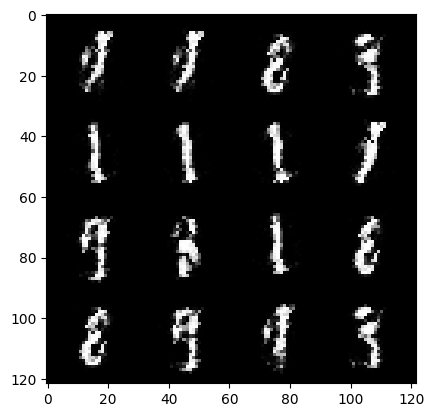

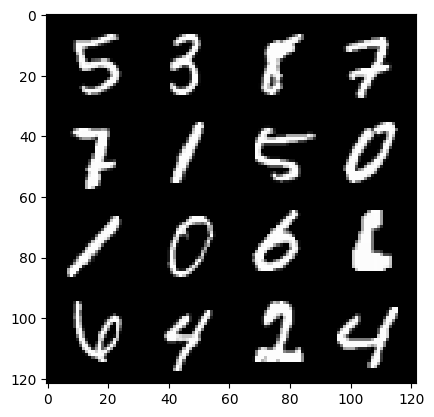

56: step 26400 / Gen loss: 4.307369516690574 / disc_loss: 0.0728905194128553


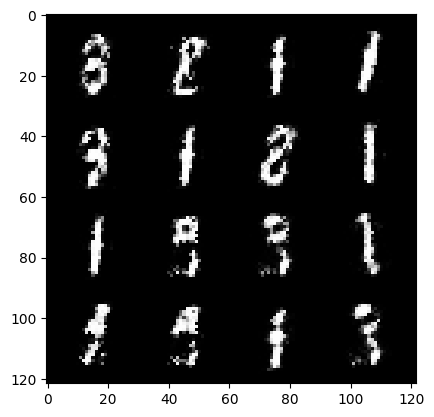

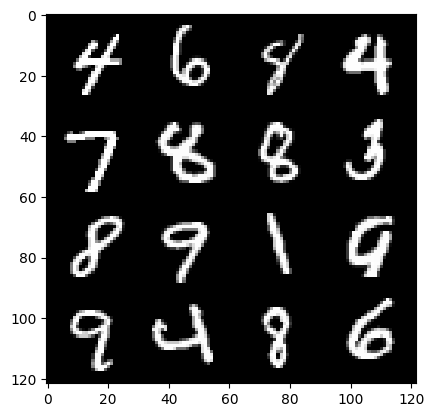

56: step 26700 / Gen loss: 4.4254644362131765 / disc_loss: 0.08013305831700564


  0%|          | 0/469 [00:00<?, ?it/s]

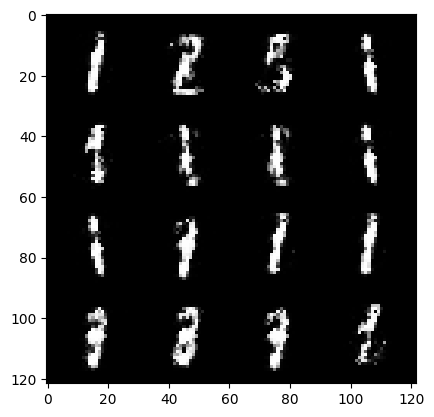

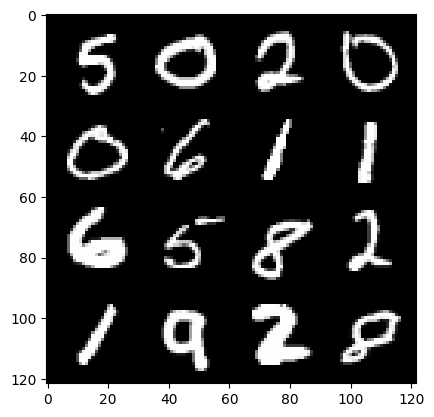

57: step 27000 / Gen loss: 4.2711740175883 / disc_loss: 0.08624731902033084


  0%|          | 0/469 [00:00<?, ?it/s]

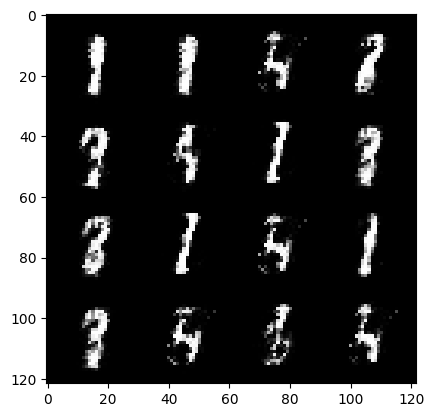

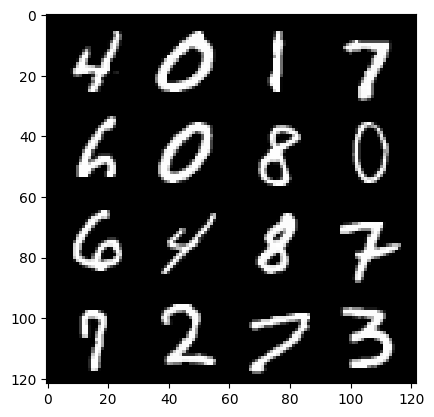

58: step 27300 / Gen loss: 4.354619627793631 / disc_loss: 0.08056689682106177


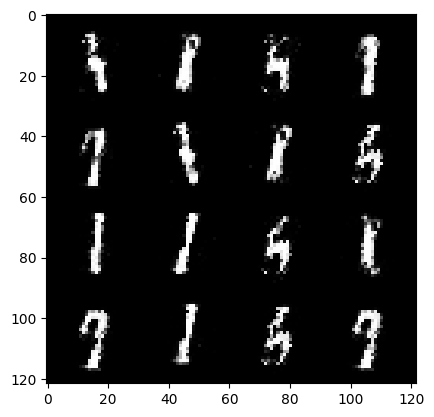

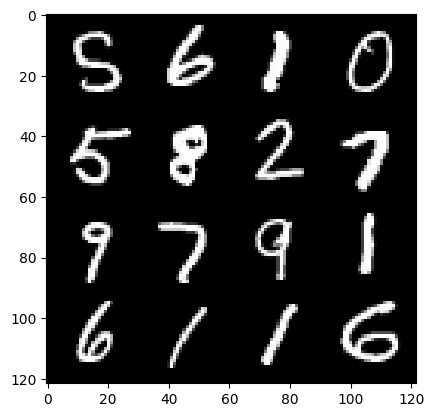

58: step 27600 / Gen loss: 4.075654214223228 / disc_loss: 0.08562064730872708


  0%|          | 0/469 [00:00<?, ?it/s]

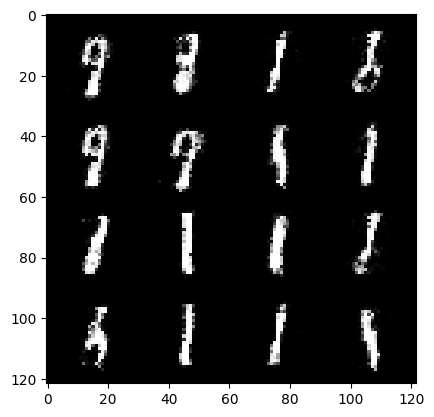

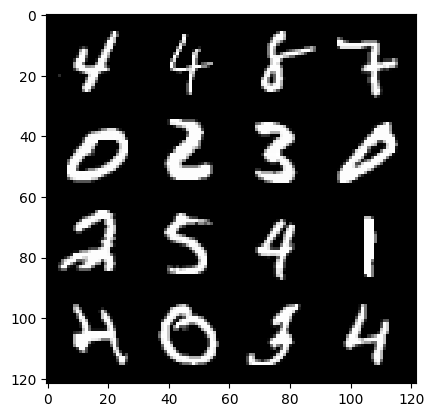

59: step 27900 / Gen loss: 4.228257296880087 / disc_loss: 0.09246700131644801


  0%|          | 0/469 [00:00<?, ?it/s]

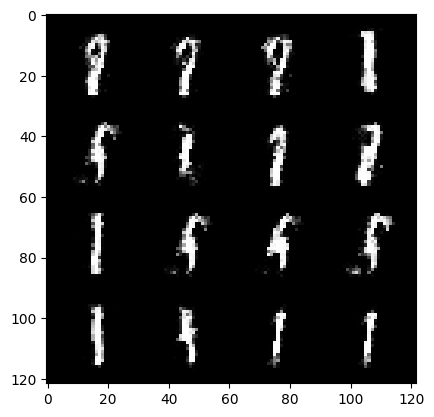

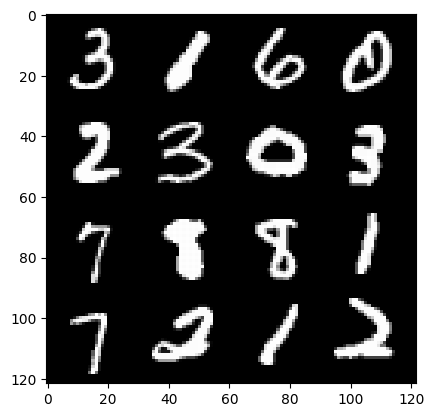

60: step 28200 / Gen loss: 3.683453842798869 / disc_loss: 0.10990445213392369


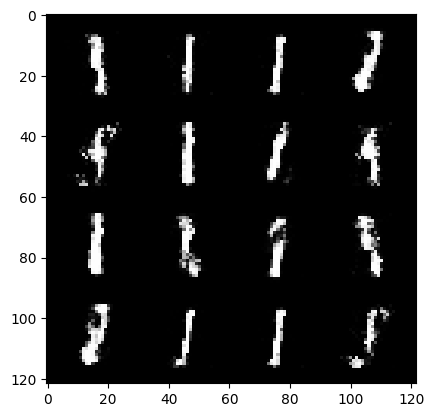

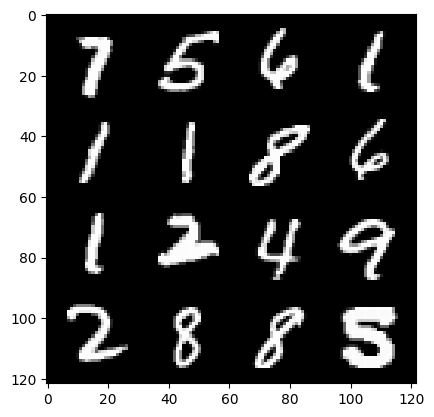

60: step 28500 / Gen loss: 4.006352624893188 / disc_loss: 0.09978338119884338


  0%|          | 0/469 [00:00<?, ?it/s]

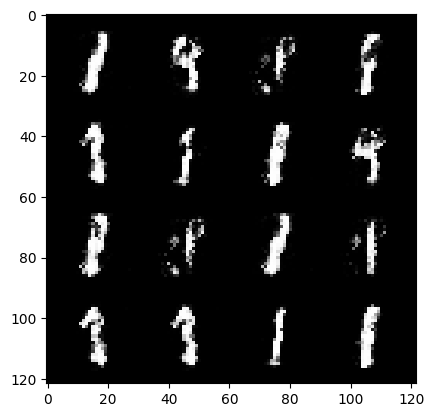

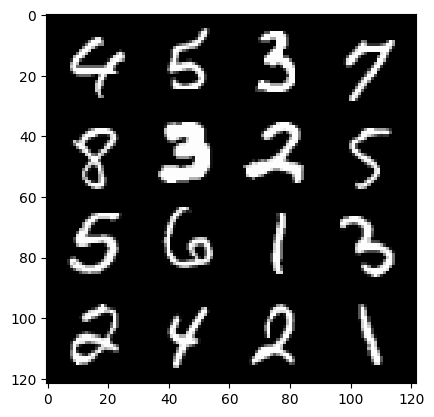

61: step 28800 / Gen loss: 3.861306525071463 / disc_loss: 0.09274244496598845


  0%|          | 0/469 [00:00<?, ?it/s]

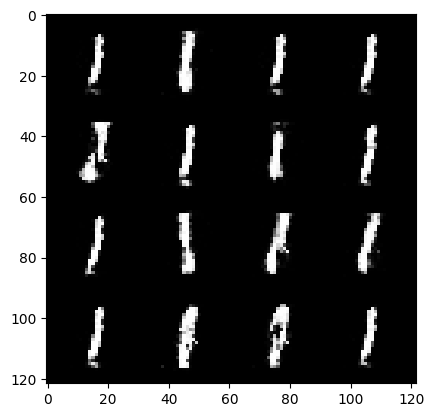

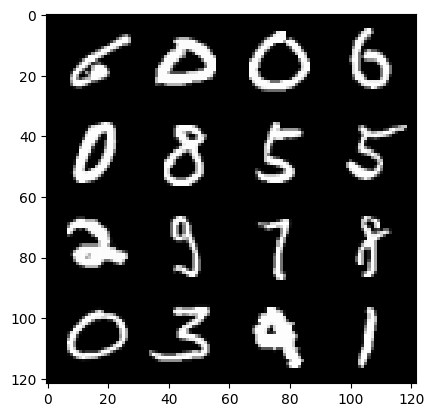

62: step 29100 / Gen loss: 3.8564056030909213 / disc_loss: 0.10294807485925653


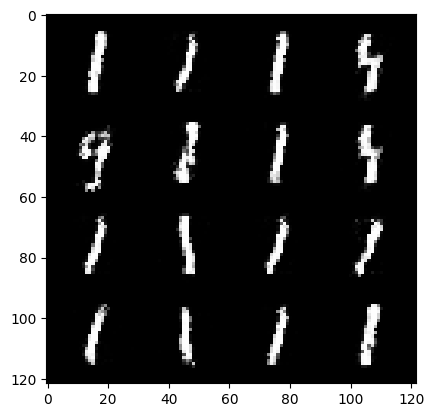

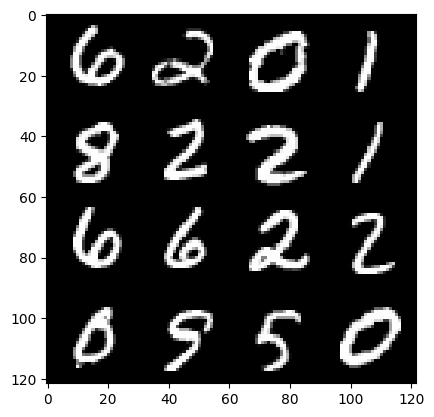

62: step 29400 / Gen loss: 3.521002021630602 / disc_loss: 0.12909705443928646


  0%|          | 0/469 [00:00<?, ?it/s]

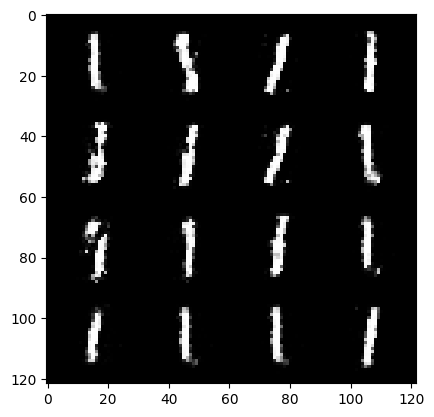

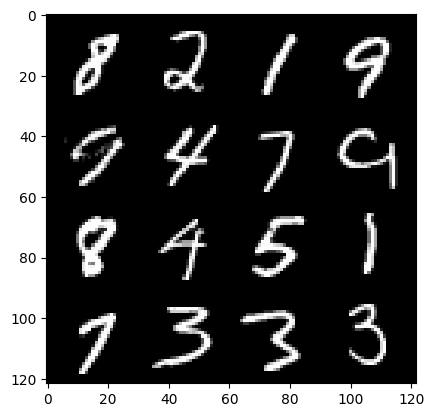

63: step 29700 / Gen loss: 3.4443891922632828 / disc_loss: 0.12688046101480718


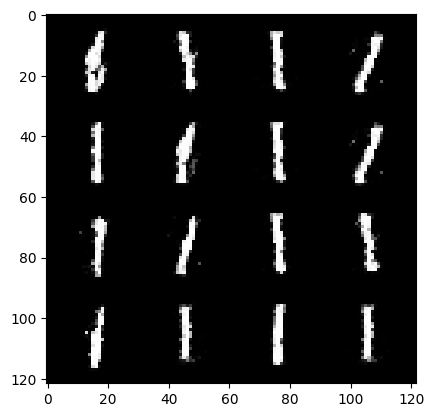

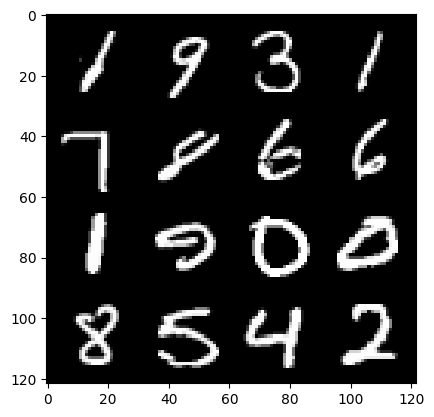

63: step 30000 / Gen loss: 3.440459408760072 / disc_loss: 0.12347875153024983


  0%|          | 0/469 [00:00<?, ?it/s]

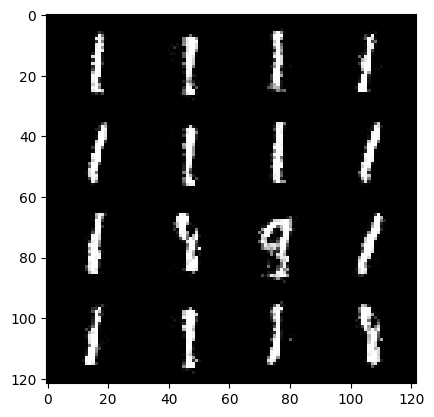

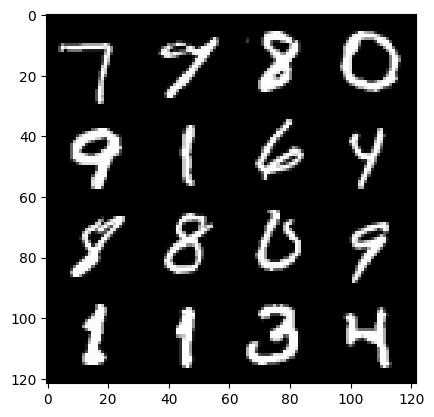

64: step 30300 / Gen loss: 3.453887384732565 / disc_loss: 0.13003700977812213


  0%|          | 0/469 [00:00<?, ?it/s]

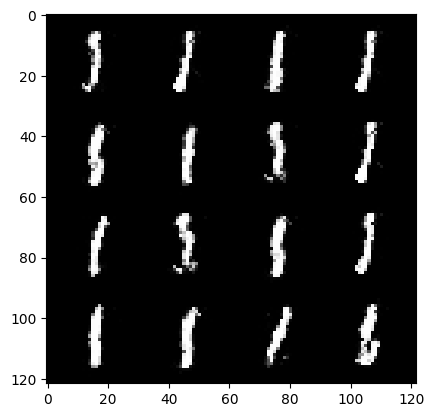

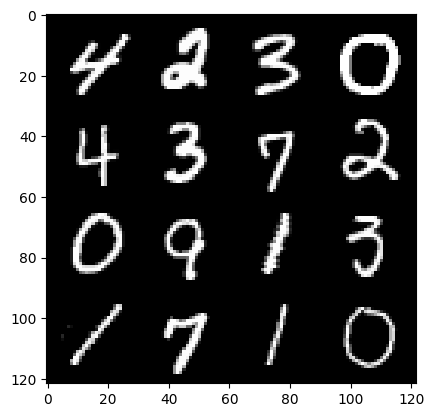

65: step 30600 / Gen loss: 3.356322851975758 / disc_loss: 0.11439932373662784


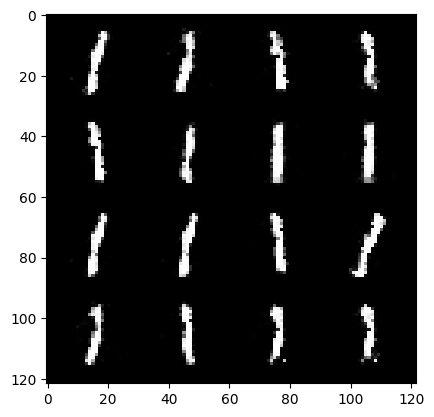

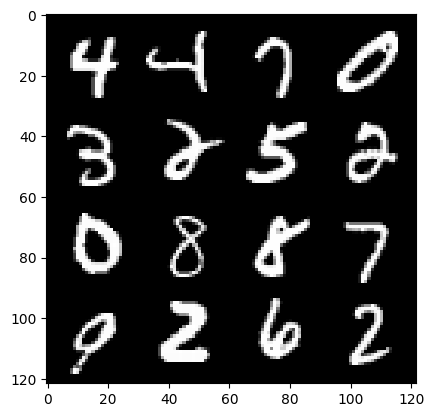

65: step 30900 / Gen loss: 3.540839457511902 / disc_loss: 0.10103931731233994


  0%|          | 0/469 [00:00<?, ?it/s]

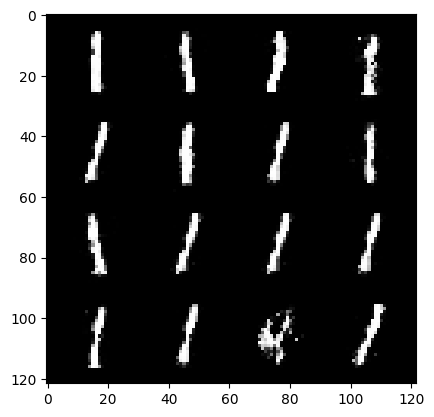

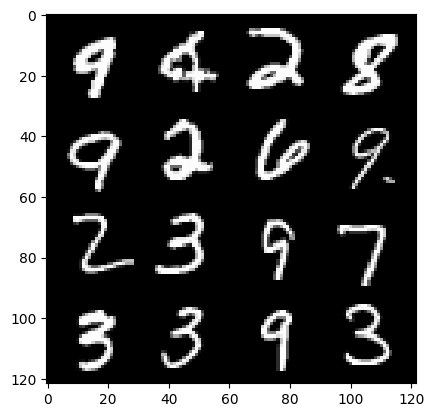

66: step 31200 / Gen loss: 3.378844124476113 / disc_loss: 0.1258694781114658


  0%|          | 0/469 [00:00<?, ?it/s]

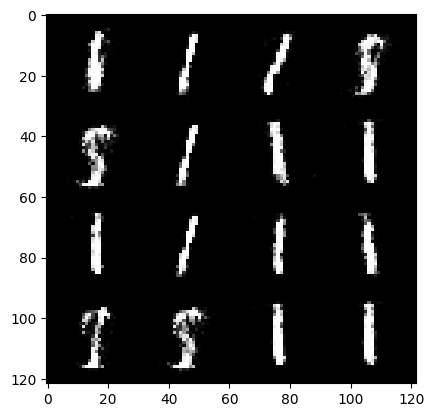

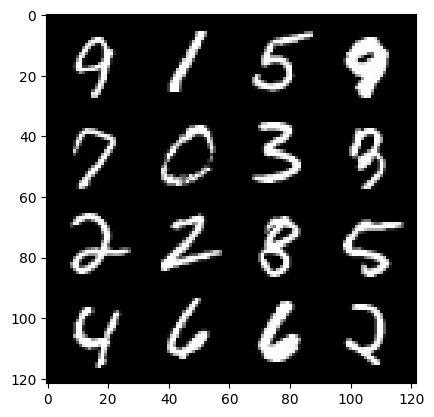

67: step 31500 / Gen loss: 3.321036781469981 / disc_loss: 0.1401354350025456


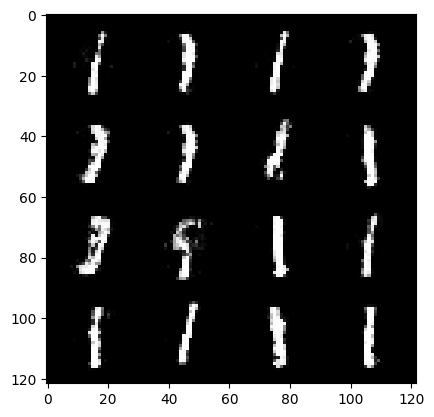

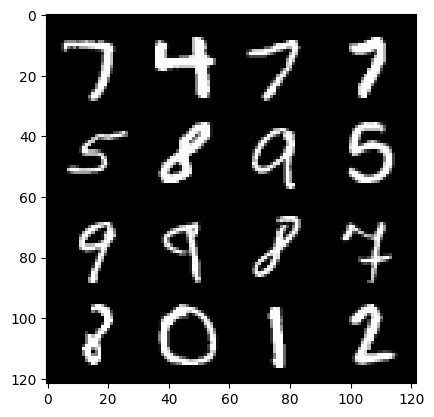

67: step 31800 / Gen loss: 3.303923972447716 / disc_loss: 0.14201271645724783


  0%|          | 0/469 [00:00<?, ?it/s]

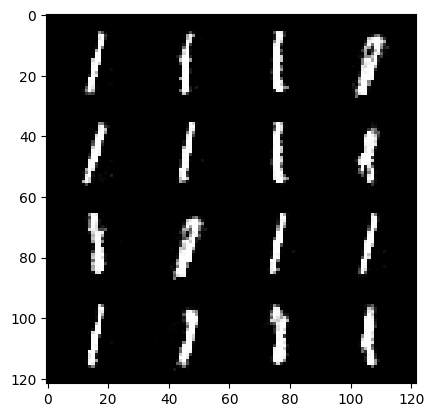

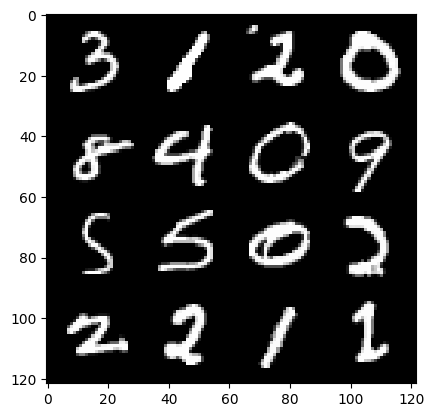

68: step 32100 / Gen loss: 3.2210208272933945 / disc_loss: 0.13212756264954806


  0%|          | 0/469 [00:00<?, ?it/s]

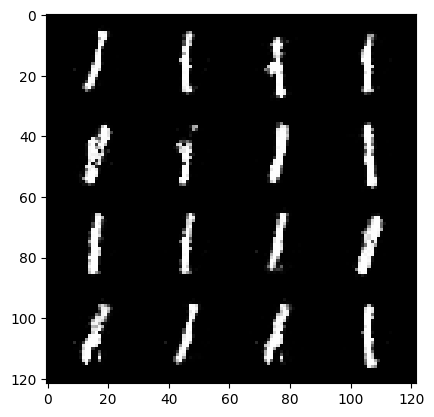

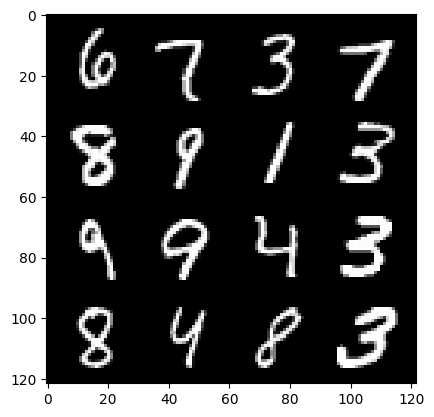

69: step 32400 / Gen loss: 3.08486136674881 / disc_loss: 0.1351217845082283


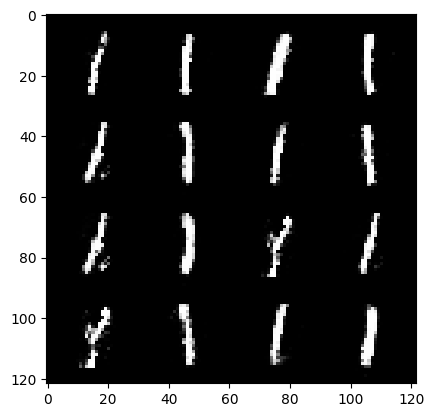

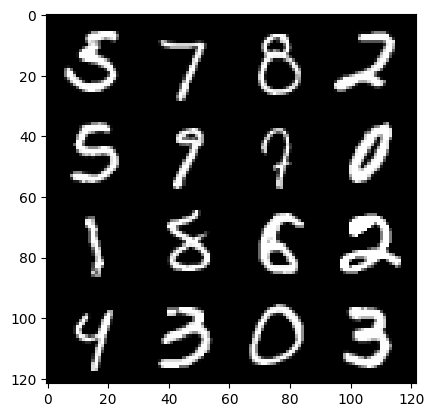

69: step 32700 / Gen loss: 3.2735413090387993 / disc_loss: 0.11382754864792026


  0%|          | 0/469 [00:00<?, ?it/s]

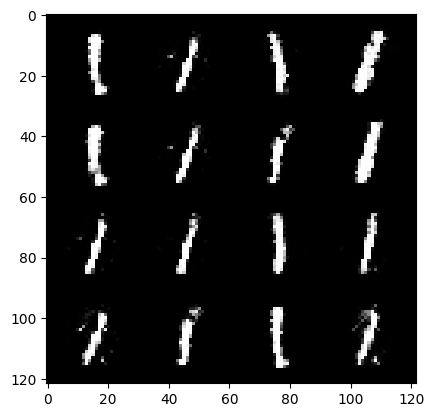

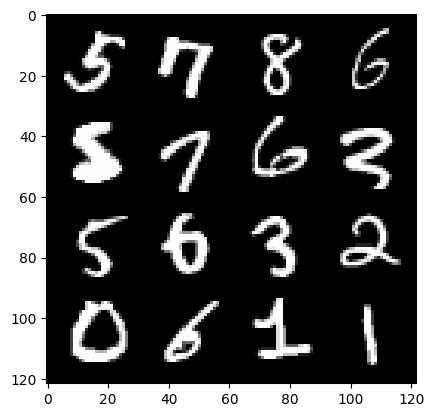

70: step 33000 / Gen loss: 3.1840678048133872 / disc_loss: 0.13212605558335777


  0%|          | 0/469 [00:00<?, ?it/s]

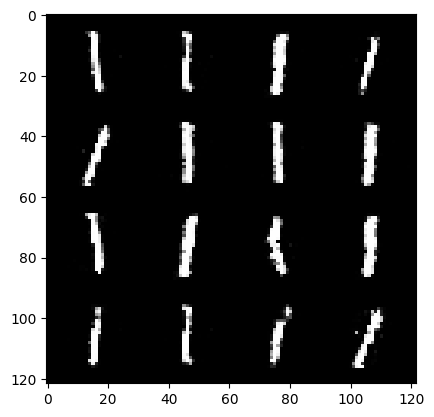

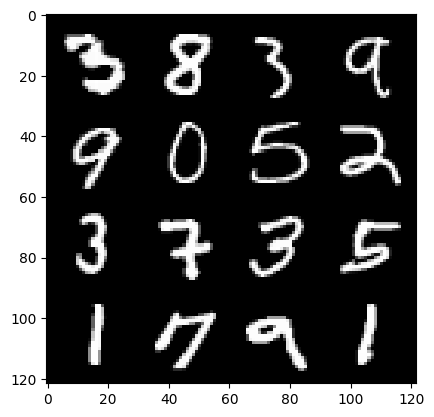

71: step 33300 / Gen loss: 3.14723432779312 / disc_loss: 0.12837528506914778


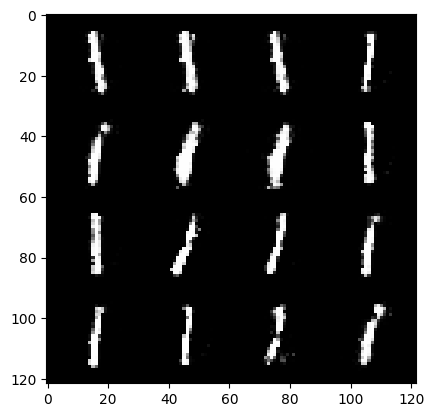

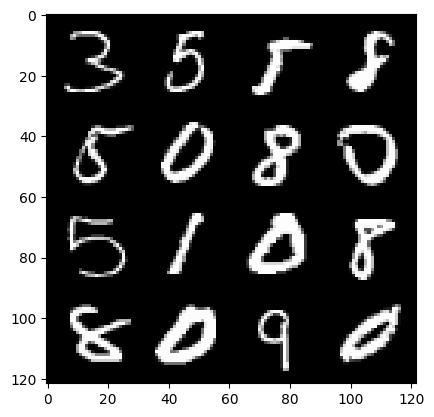

71: step 33600 / Gen loss: 3.070250368118285 / disc_loss: 0.1367199626751245


  0%|          | 0/469 [00:00<?, ?it/s]

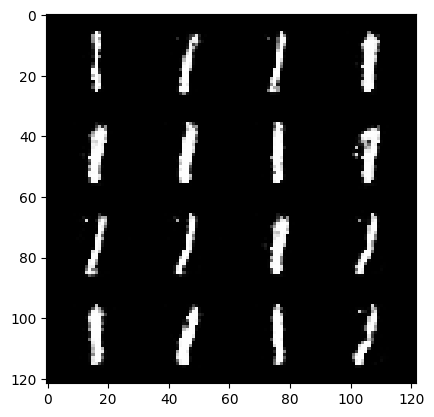

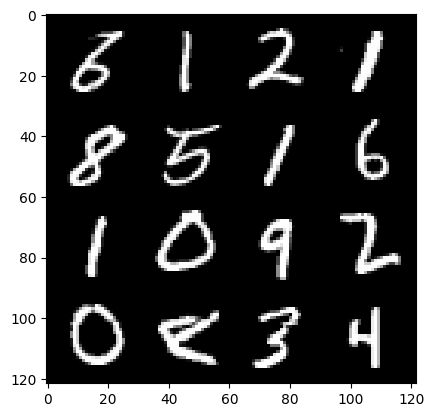

72: step 33900 / Gen loss: 3.1392360671361295 / disc_loss: 0.13220967091619973


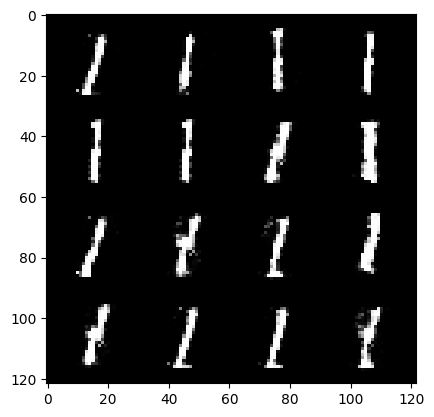

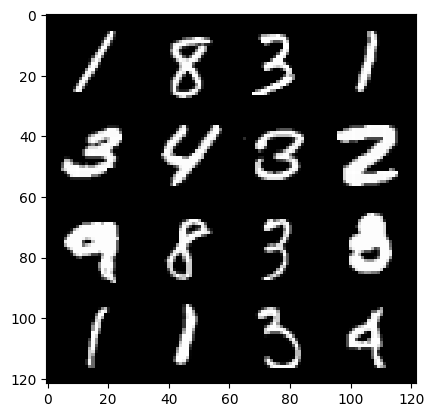

72: step 34200 / Gen loss: 3.1933719301223715 / disc_loss: 0.12730165733645352


  0%|          | 0/469 [00:00<?, ?it/s]

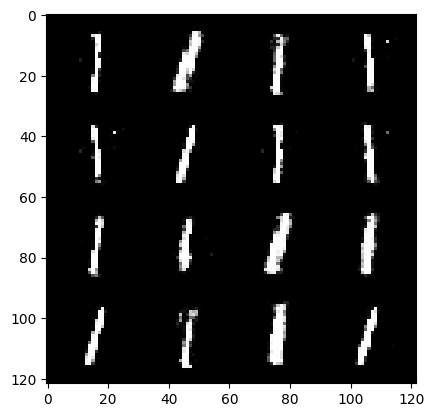

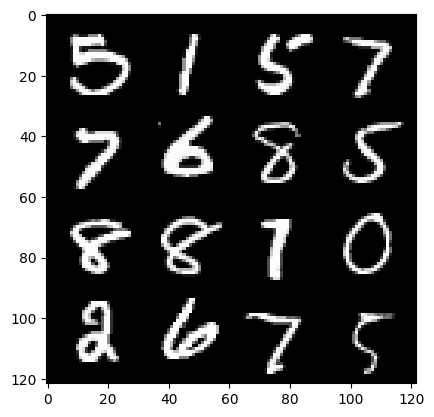

73: step 34500 / Gen loss: 3.2585908039410922 / disc_loss: 0.12531101359675328


  0%|          | 0/469 [00:00<?, ?it/s]

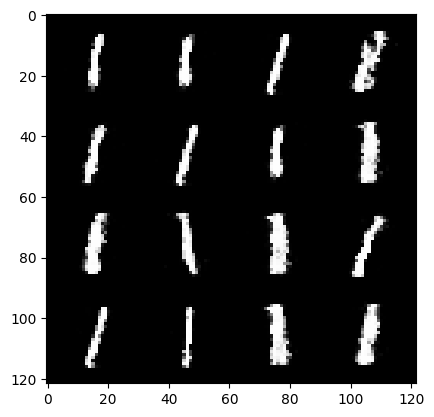

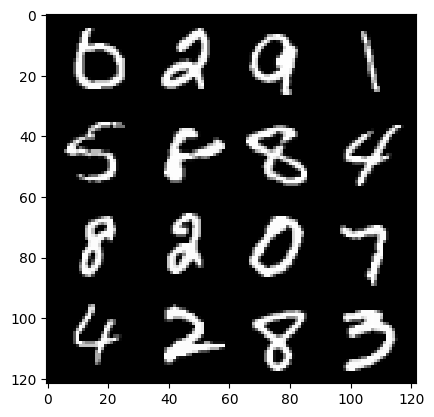

74: step 34800 / Gen loss: 2.9773094050089517 / disc_loss: 0.1471246506273747


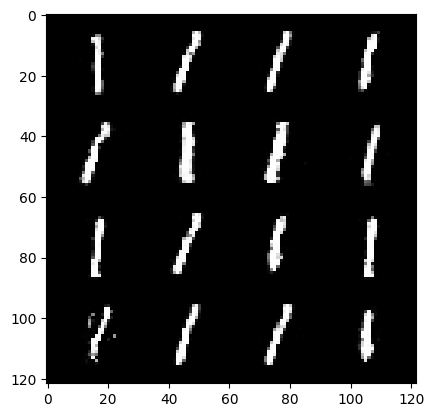

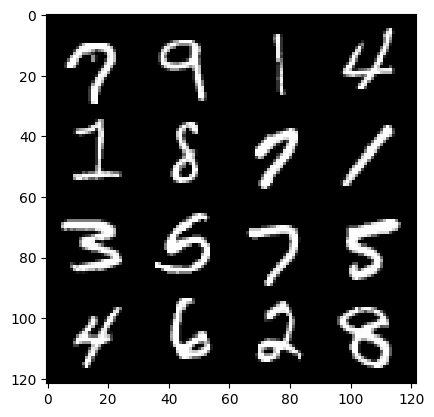

74: step 35100 / Gen loss: 3.035133824348451 / disc_loss: 0.13780151151120665


  0%|          | 0/469 [00:00<?, ?it/s]

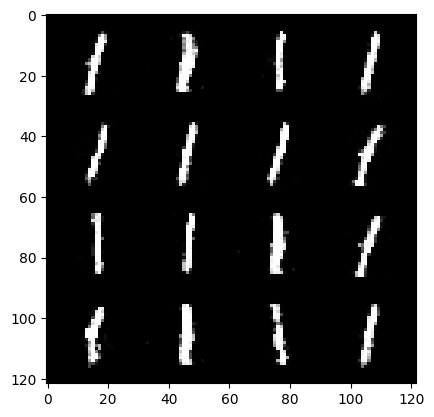

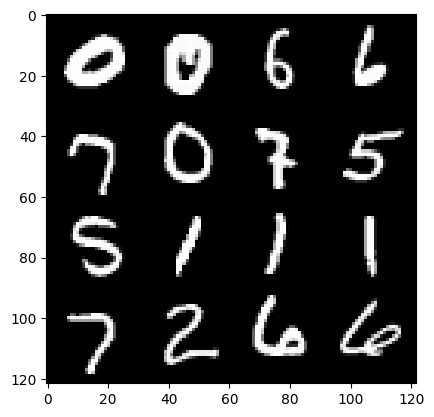

75: step 35400 / Gen loss: 2.9944613377253204 / disc_loss: 0.15053474845985573


  0%|          | 0/469 [00:00<?, ?it/s]

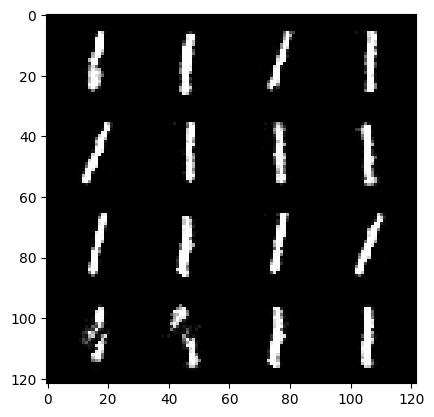

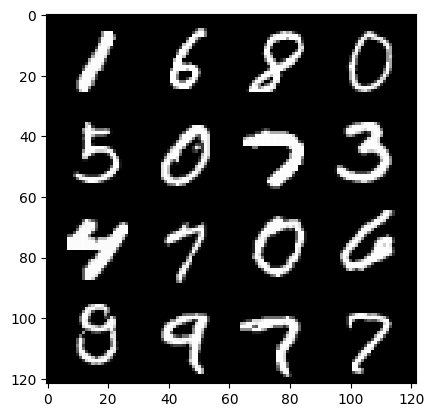

76: step 35700 / Gen loss: 2.9447807852427172 / disc_loss: 0.1628974765539169


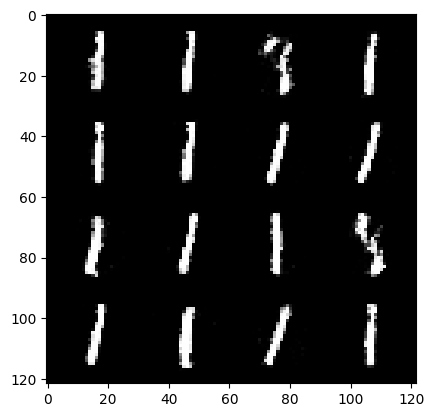

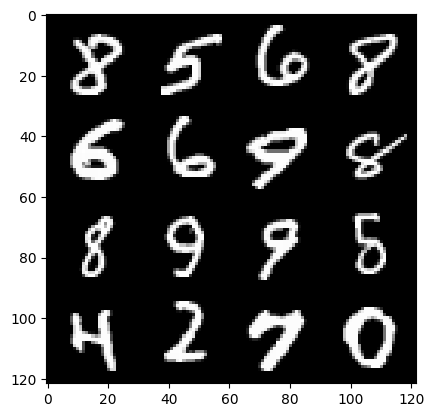

76: step 36000 / Gen loss: 2.825572237173716 / disc_loss: 0.16692555574079362


  0%|          | 0/469 [00:00<?, ?it/s]

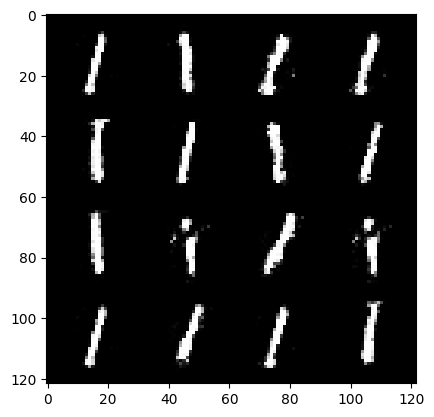

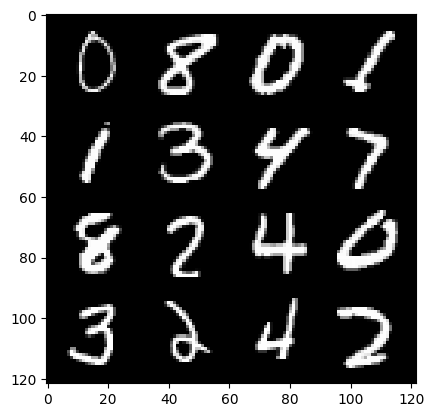

77: step 36300 / Gen loss: 2.8735092671712246 / disc_loss: 0.15060544490814207


  0%|          | 0/469 [00:00<?, ?it/s]

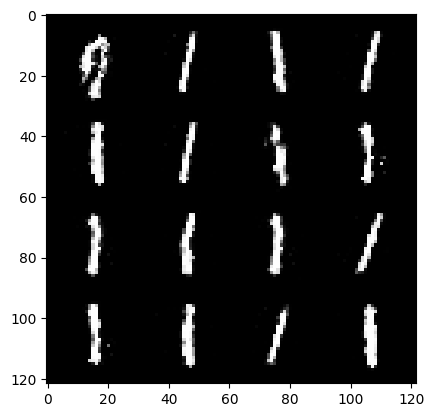

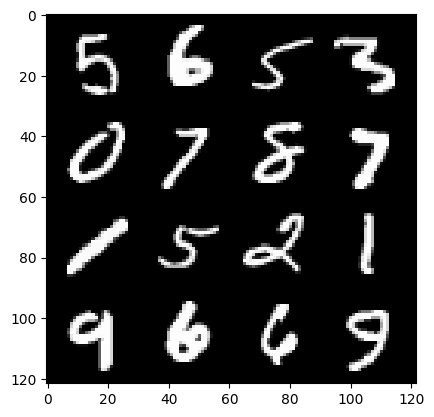

78: step 36600 / Gen loss: 2.8399026139577215 / disc_loss: 0.1500962100426356


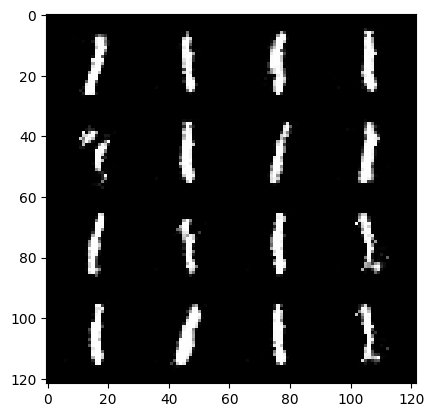

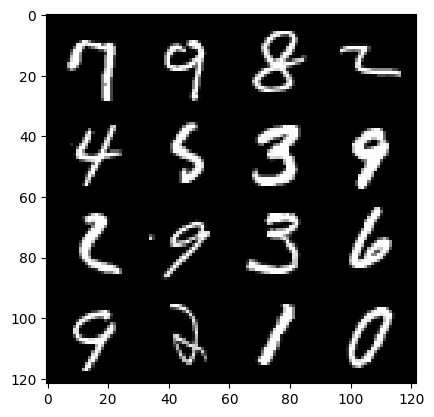

78: step 36900 / Gen loss: 2.7850208330154436 / disc_loss: 0.15373515168825794


  0%|          | 0/469 [00:00<?, ?it/s]

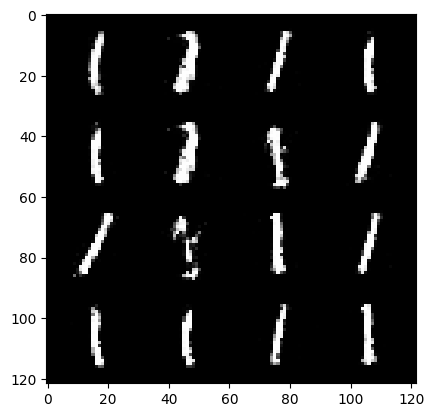

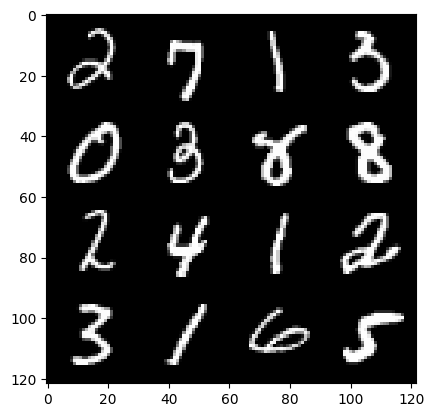

79: step 37200 / Gen loss: 2.8221129353841157 / disc_loss: 0.15130397118628017


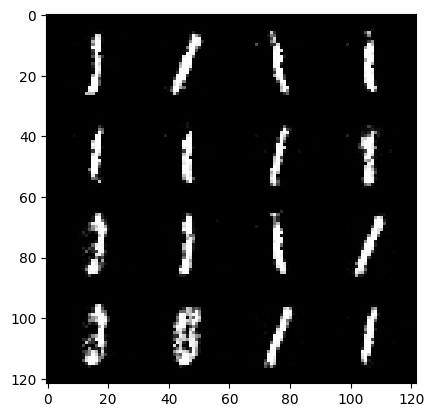

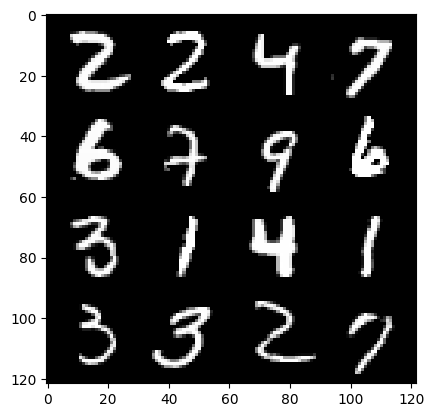

79: step 37500 / Gen loss: 2.7715021800994872 / disc_loss: 0.15995054868360364


  0%|          | 0/469 [00:00<?, ?it/s]

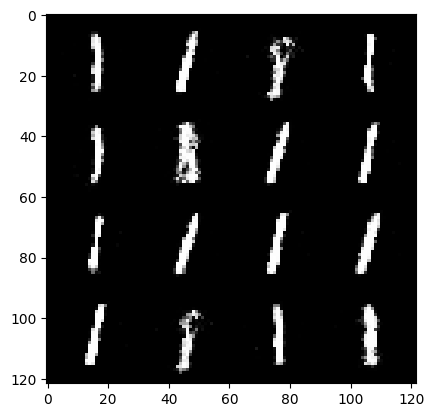

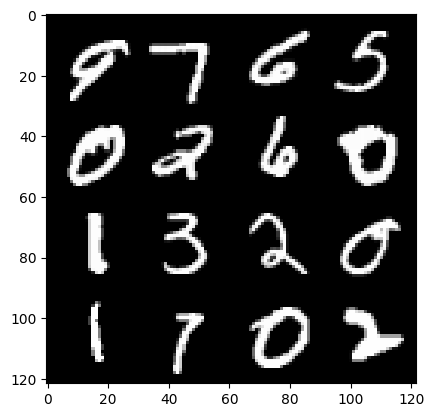

80: step 37800 / Gen loss: 2.76305145899455 / disc_loss: 0.1571248849978051


  0%|          | 0/469 [00:00<?, ?it/s]

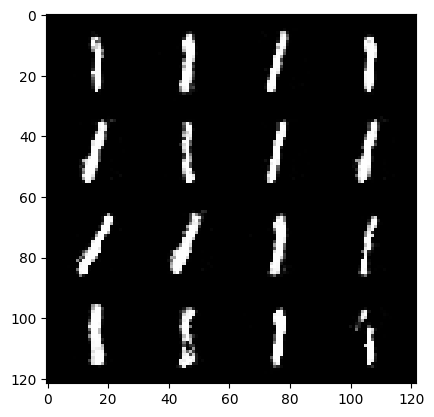

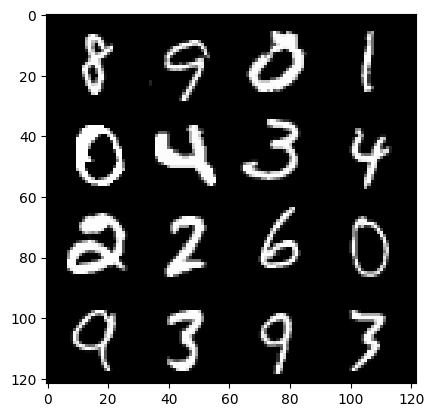

81: step 38100 / Gen loss: 2.728495709896086 / disc_loss: 0.16439413895209637


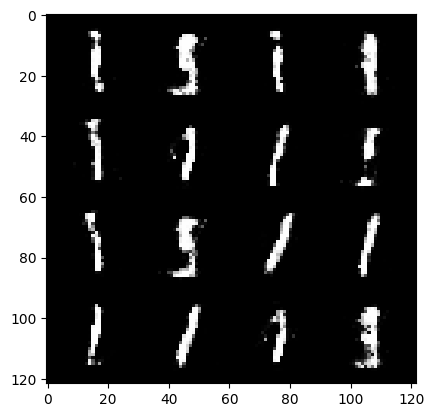

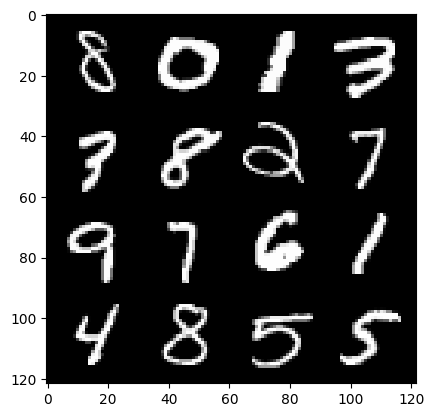

81: step 38400 / Gen loss: 2.840219477812448 / disc_loss: 0.14759888537228097


  0%|          | 0/469 [00:00<?, ?it/s]

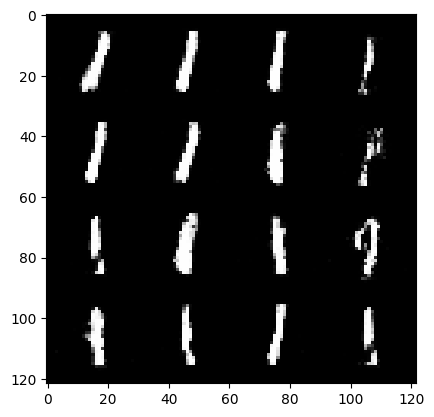

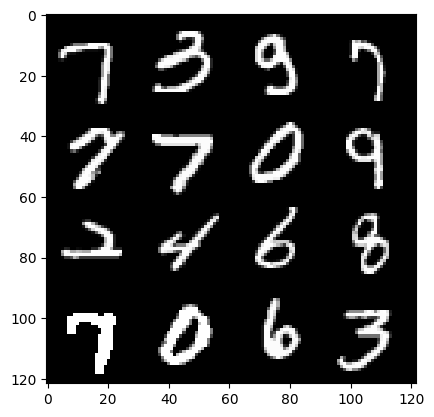

82: step 38700 / Gen loss: 2.7936733913421667 / disc_loss: 0.15865438183148692


  0%|          | 0/469 [00:00<?, ?it/s]

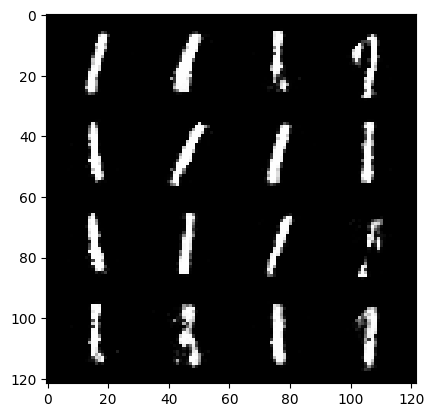

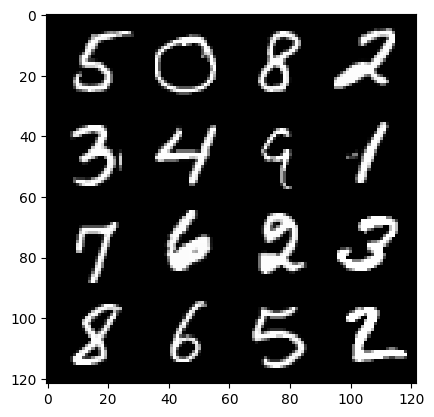

83: step 39000 / Gen loss: 2.788612492879233 / disc_loss: 0.15224340489755062


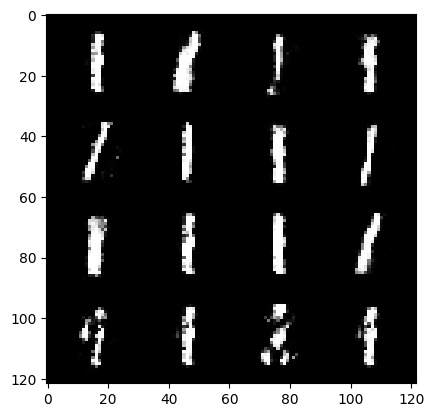

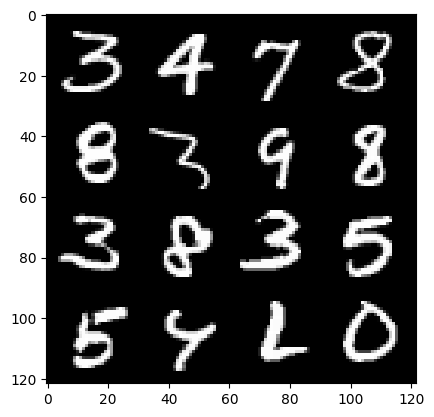

83: step 39300 / Gen loss: 2.7628573306401583 / disc_loss: 0.15146736598263194


  0%|          | 0/469 [00:00<?, ?it/s]

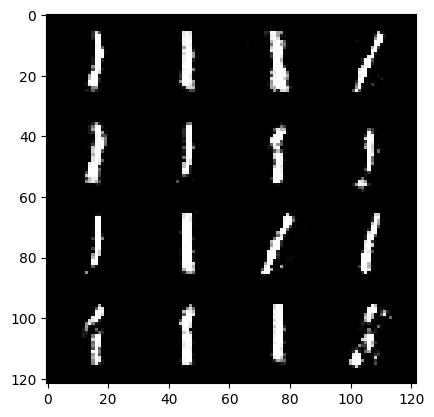

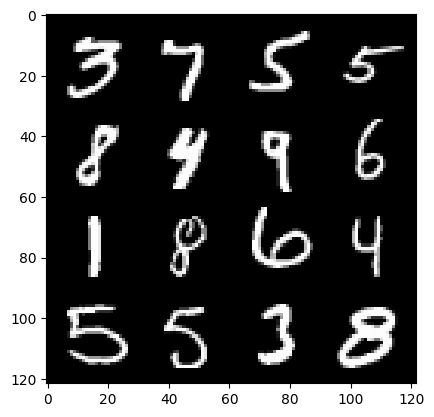

84: step 39600 / Gen loss: 2.6981769204139683 / disc_loss: 0.15763736794392275


  0%|          | 0/469 [00:00<?, ?it/s]

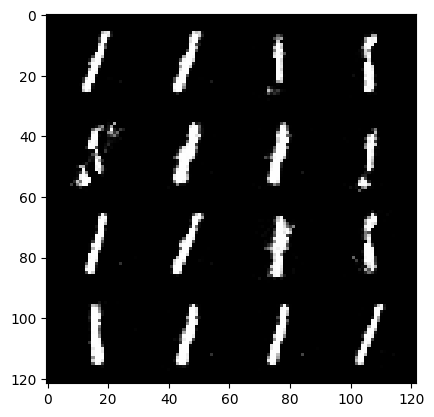

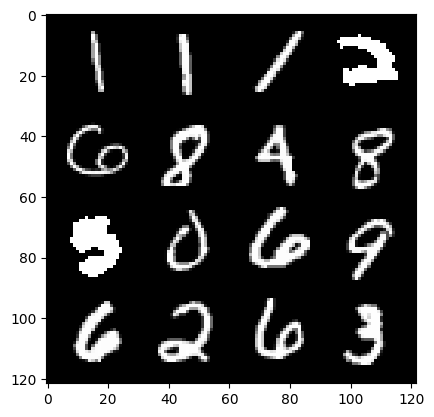

85: step 39900 / Gen loss: 2.7213955553372684 / disc_loss: 0.15601495436082302


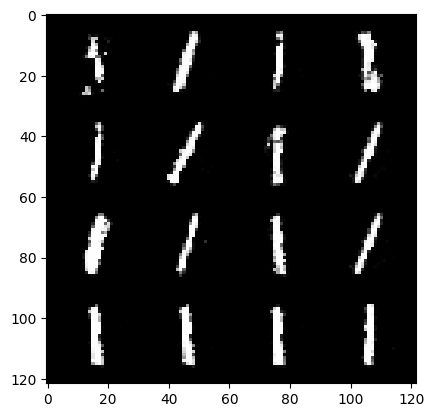

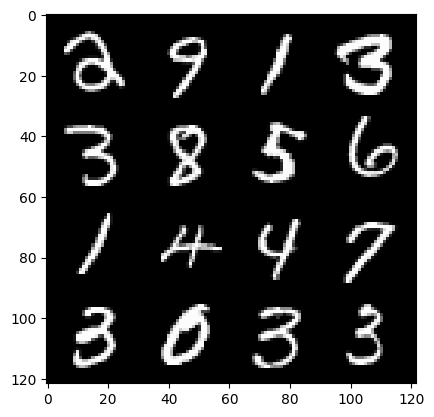

85: step 40200 / Gen loss: 2.7736755951245664 / disc_loss: 0.14840470353762303


  0%|          | 0/469 [00:00<?, ?it/s]

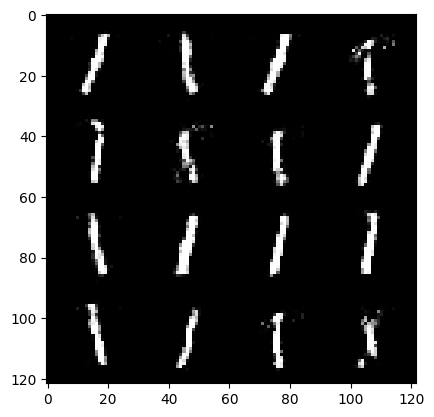

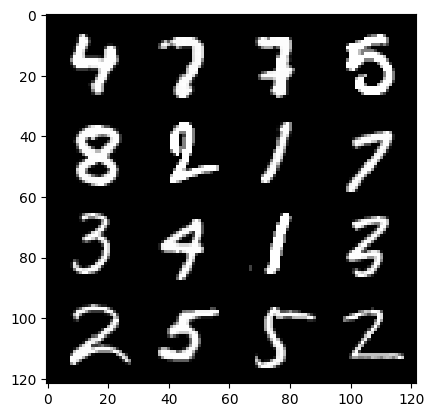

86: step 40500 / Gen loss: 2.7546227892239905 / disc_loss: 0.1572730572770039


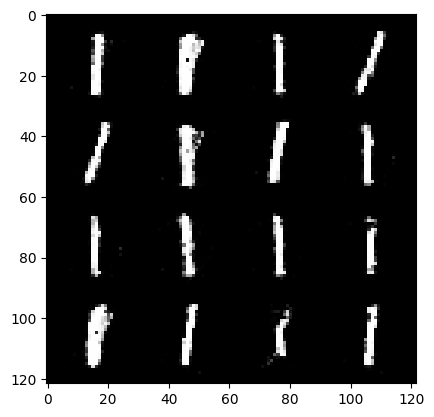

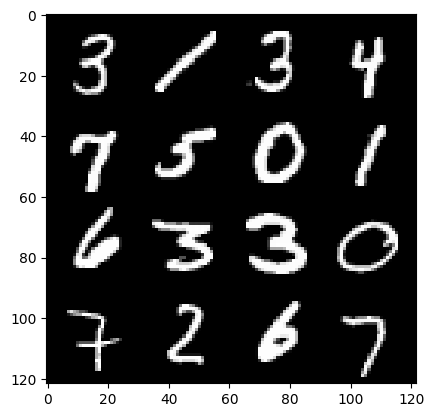

86: step 40800 / Gen loss: 2.8204099233945197 / disc_loss: 0.15134728574504444


  0%|          | 0/469 [00:00<?, ?it/s]

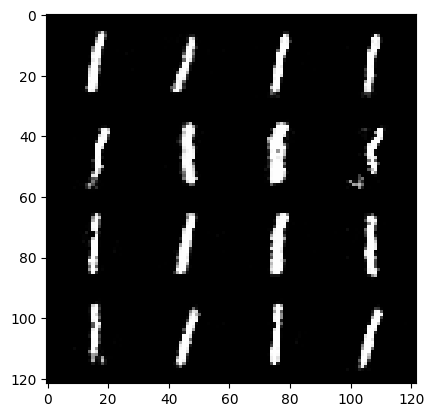

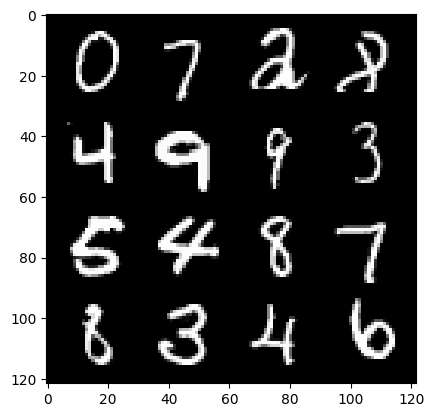

87: step 41100 / Gen loss: 2.7766952761014325 / disc_loss: 0.1561920920759442


  0%|          | 0/469 [00:00<?, ?it/s]

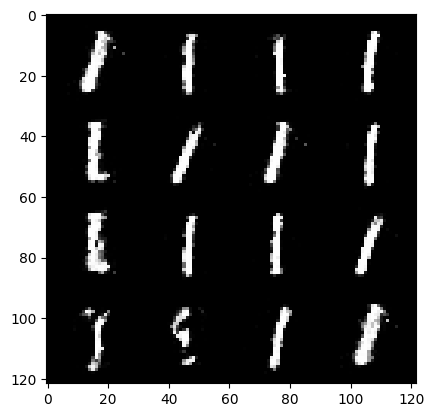

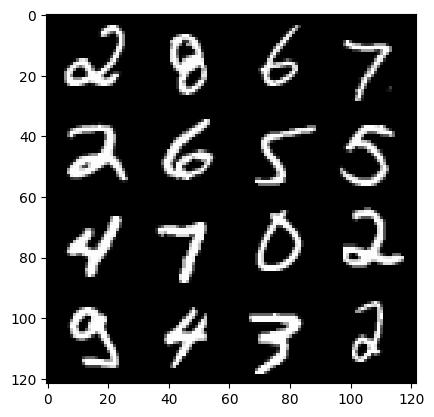

88: step 41400 / Gen loss: 2.711775188446045 / disc_loss: 0.16804344214498995


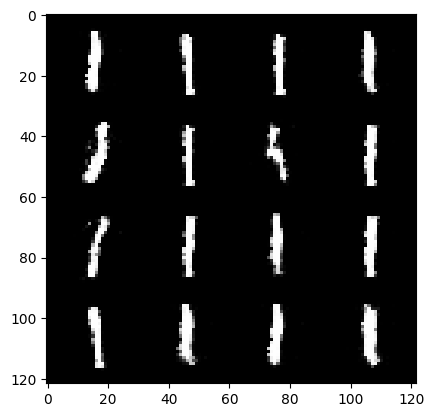

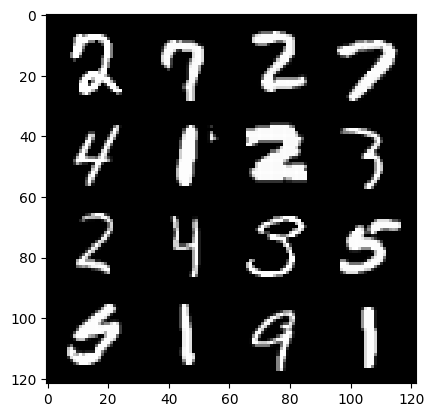

88: step 41700 / Gen loss: 2.734651779333748 / disc_loss: 0.15568050322433333


  0%|          | 0/469 [00:00<?, ?it/s]

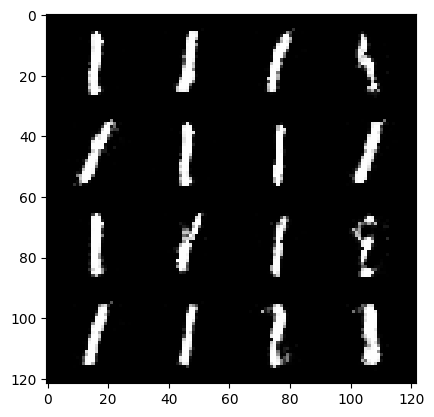

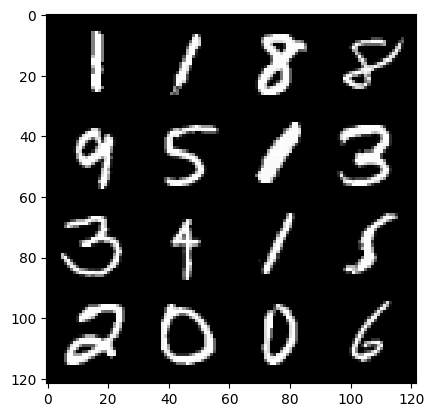

89: step 42000 / Gen loss: 2.666338764031727 / disc_loss: 0.17216993473470227


  0%|          | 0/469 [00:00<?, ?it/s]

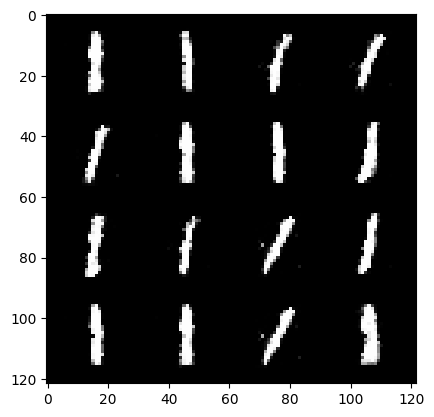

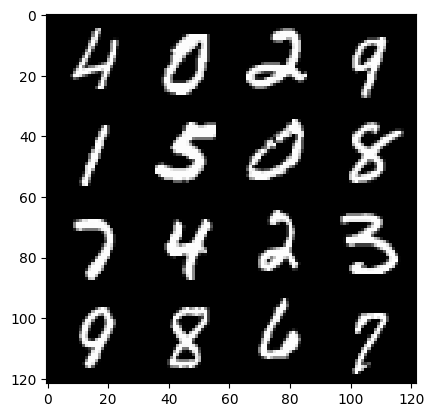

90: step 42300 / Gen loss: 2.6671333352724704 / disc_loss: 0.15936529919505116


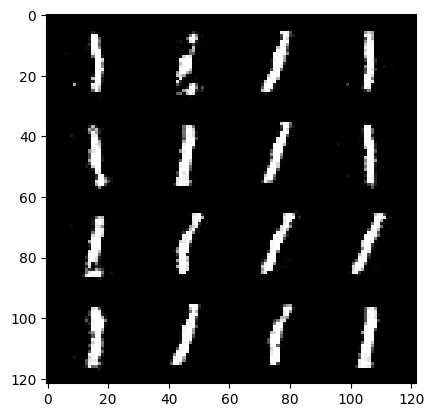

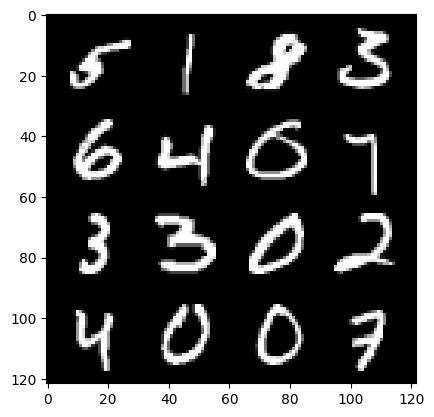

90: step 42600 / Gen loss: 2.72043005545934 / disc_loss: 0.1600294397523005


  0%|          | 0/469 [00:00<?, ?it/s]

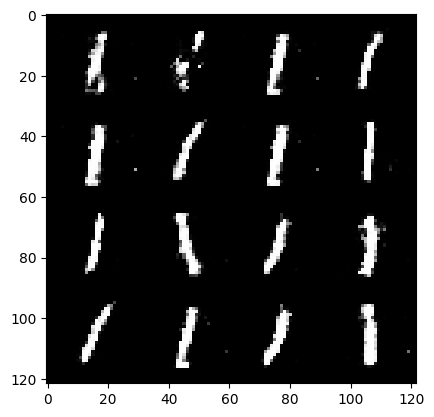

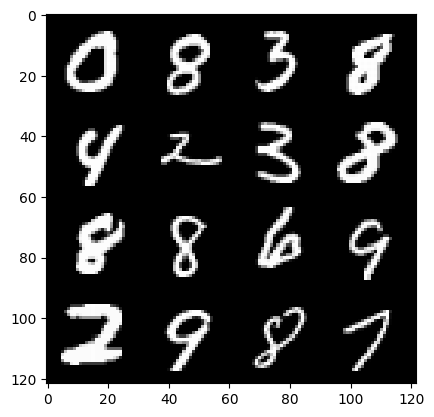

91: step 42900 / Gen loss: 2.7637966910998033 / disc_loss: 0.15363022016982233


  0%|          | 0/469 [00:00<?, ?it/s]

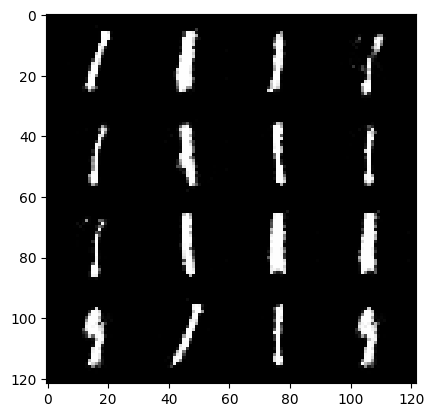

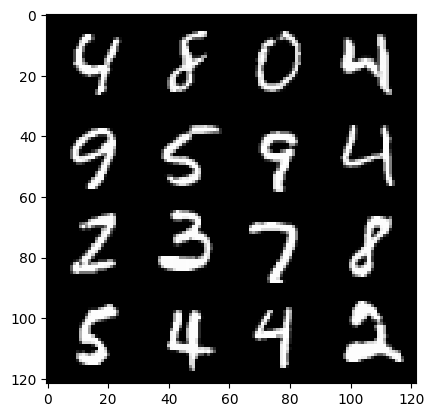

92: step 43200 / Gen loss: 2.6738485932350162 / disc_loss: 0.16232590665419888


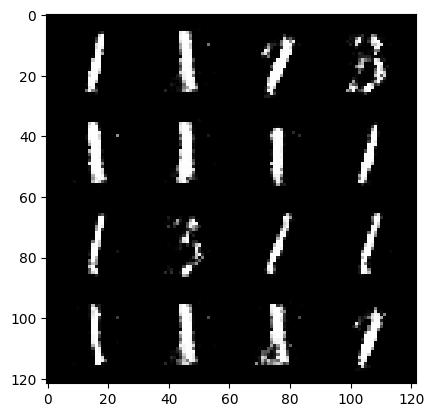

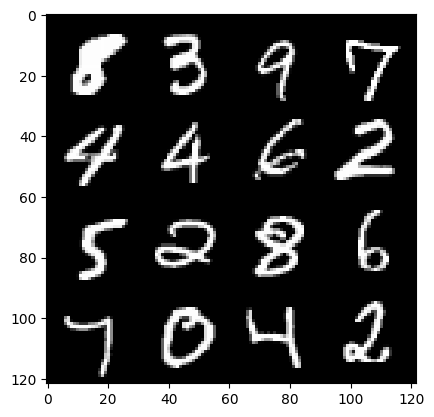

92: step 43500 / Gen loss: 2.5381303207079577 / disc_loss: 0.17687309997777145


  0%|          | 0/469 [00:00<?, ?it/s]

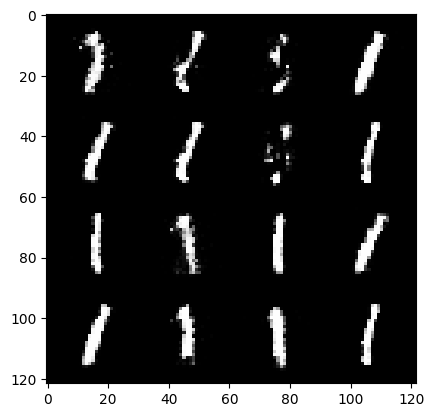

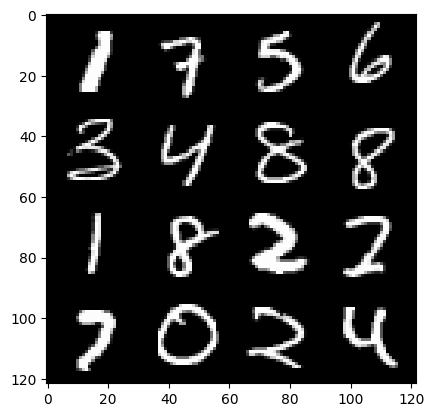

93: step 43800 / Gen loss: 2.598735653559363 / disc_loss: 0.1737486136456329


  0%|          | 0/469 [00:00<?, ?it/s]

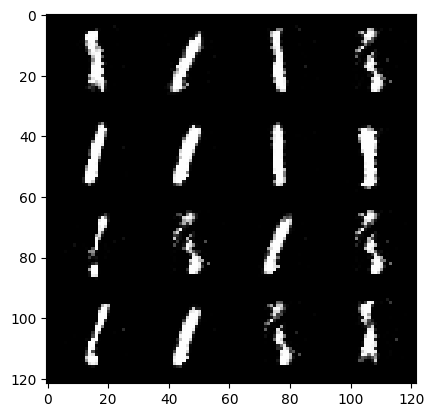

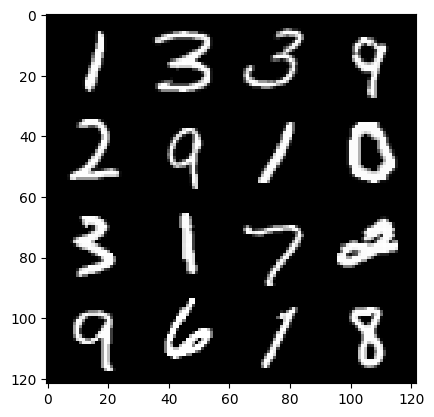

94: step 44100 / Gen loss: 2.5930462400118506 / disc_loss: 0.16282838610311334


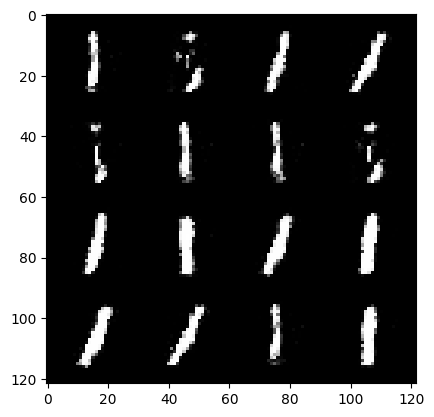

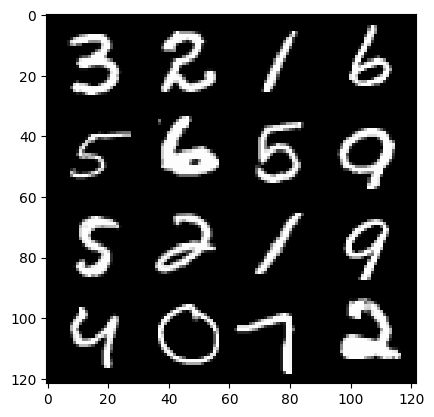

94: step 44400 / Gen loss: 2.729351917107902 / disc_loss: 0.14693047184497116


  0%|          | 0/469 [00:00<?, ?it/s]

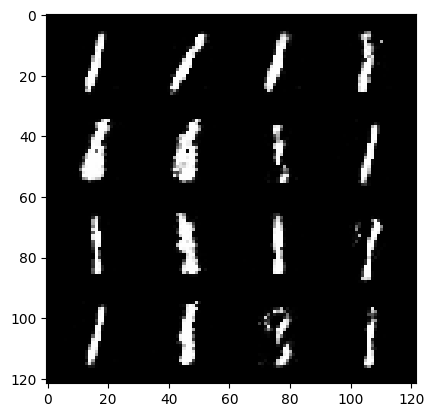

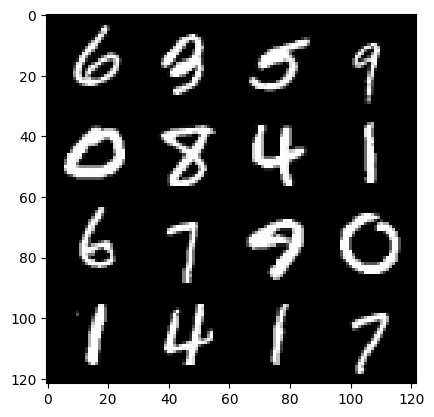

95: step 44700 / Gen loss: 2.731471883455916 / disc_loss: 0.1469907744477192


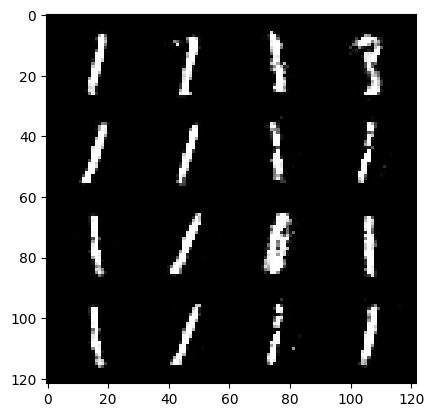

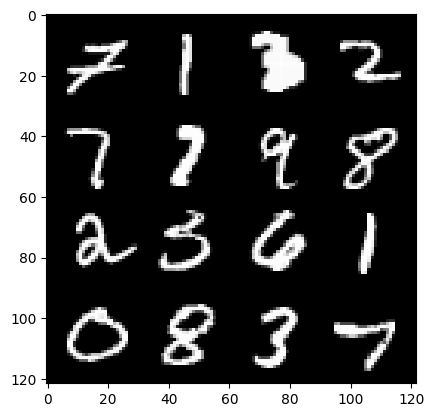

95: step 45000 / Gen loss: 2.6304229338963823 / disc_loss: 0.16471099513272439


  0%|          | 0/469 [00:00<?, ?it/s]

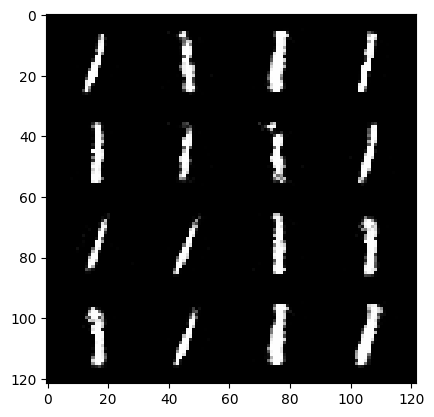

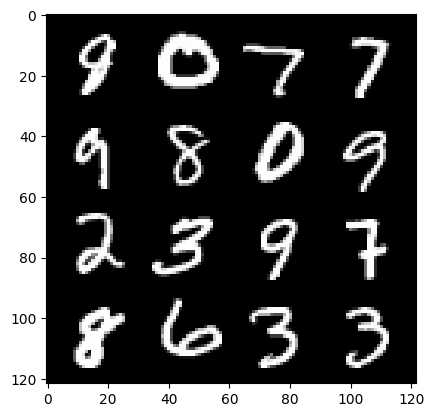

96: step 45300 / Gen loss: 2.5992546987533562 / disc_loss: 0.16548939908544227


  0%|          | 0/469 [00:00<?, ?it/s]

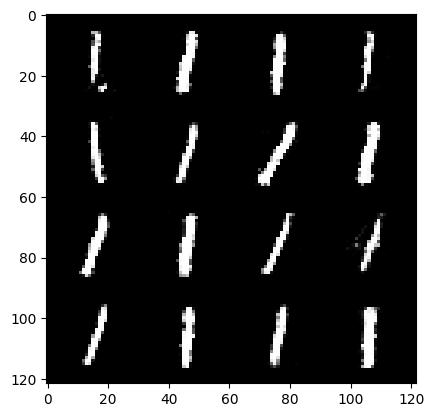

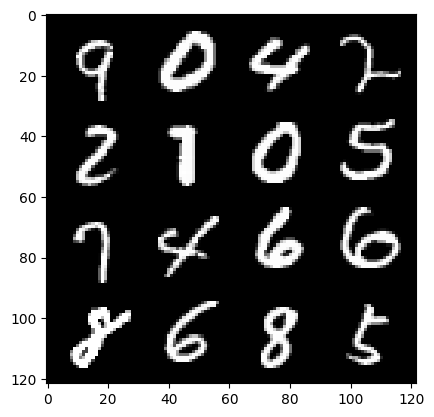

97: step 45600 / Gen loss: 2.6853799565633136 / disc_loss: 0.15428505145013335


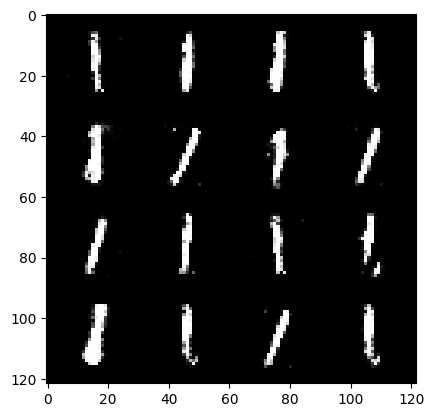

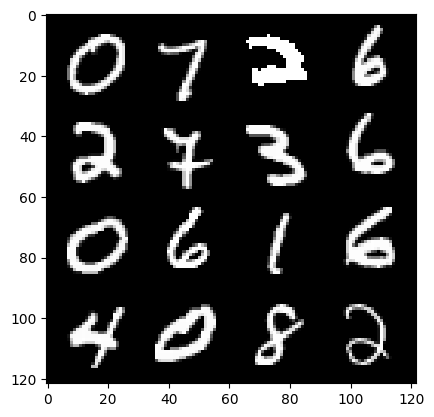

97: step 45900 / Gen loss: 2.6021181750297546 / disc_loss: 0.16046292424201958


  0%|          | 0/469 [00:00<?, ?it/s]

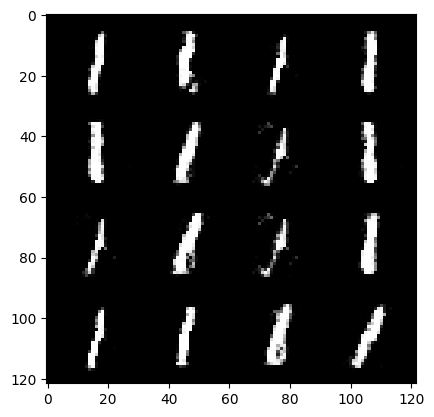

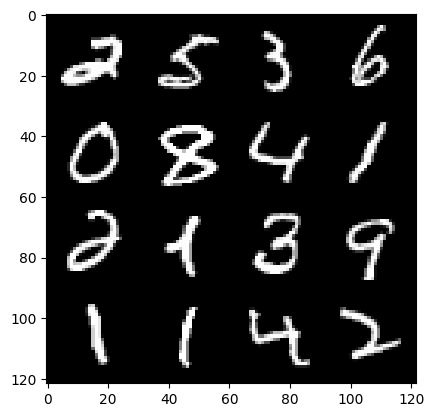

98: step 46200 / Gen loss: 2.7709249893824275 / disc_loss: 0.16156276283164825


  0%|          | 0/469 [00:00<?, ?it/s]

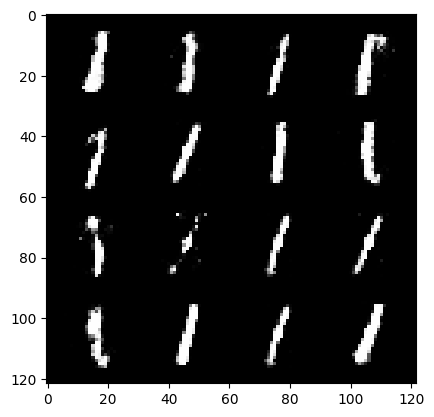

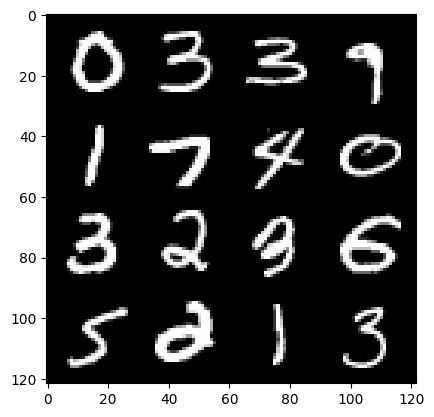

99: step 46500 / Gen loss: 2.658196469942731 / disc_loss: 0.1556112645814816


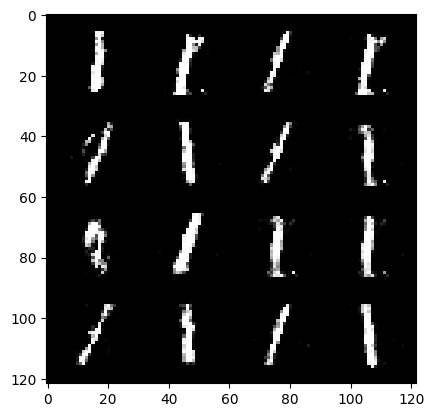

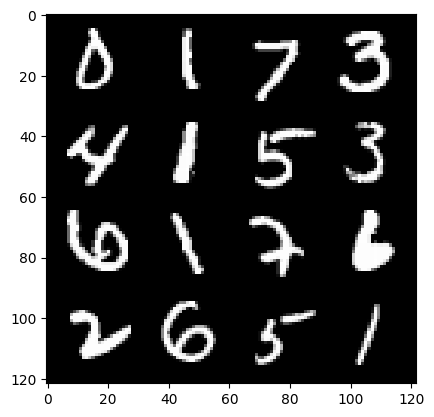

99: step 46800 / Gen loss: 2.5845117394129438 / disc_loss: 0.16722542305787405


  0%|          | 0/469 [00:00<?, ?it/s]

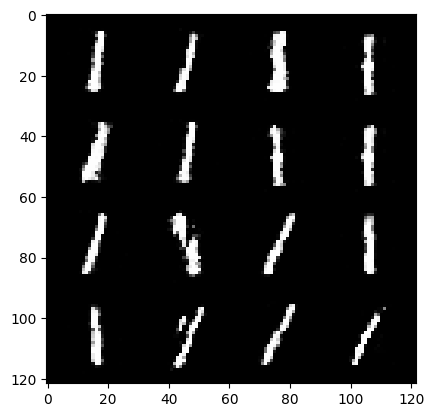

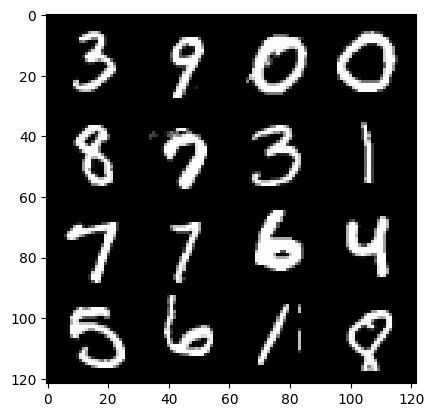

100: step 47100 / Gen loss: 2.6130087828636155 / disc_loss: 0.1725179146726926


  0%|          | 0/469 [00:00<?, ?it/s]

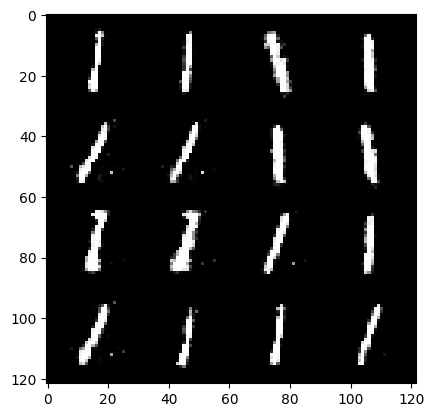

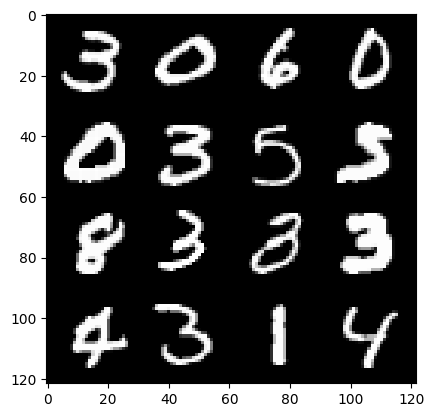

101: step 47400 / Gen loss: 2.5590560682614627 / disc_loss: 0.1730910615126291


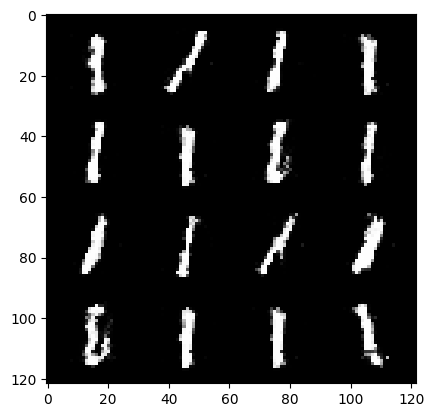

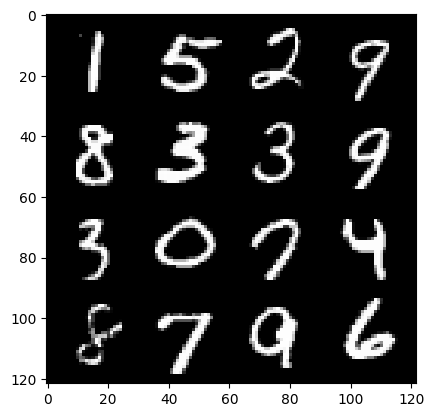

101: step 47700 / Gen loss: 2.468590494791666 / disc_loss: 0.18541218176484114


  0%|          | 0/469 [00:00<?, ?it/s]

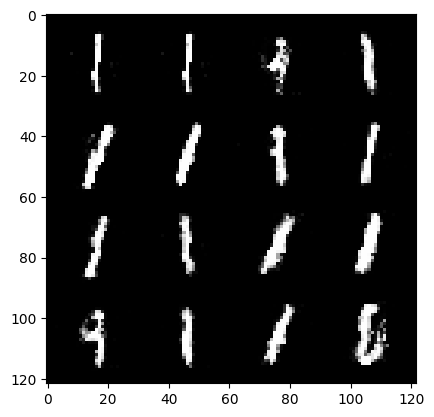

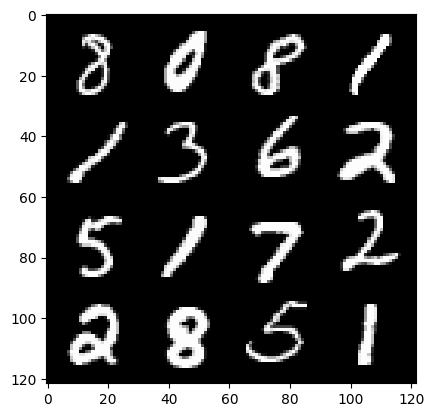

102: step 48000 / Gen loss: 2.4915296117464703 / disc_loss: 0.1867803561687469


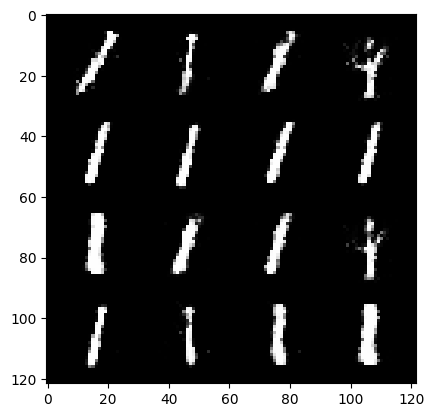

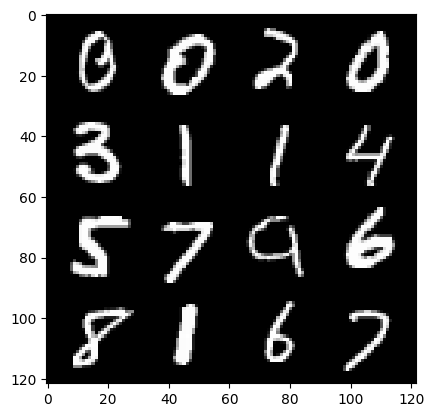

102: step 48300 / Gen loss: 2.4631380256017064 / disc_loss: 0.19072705221672853


  0%|          | 0/469 [00:00<?, ?it/s]

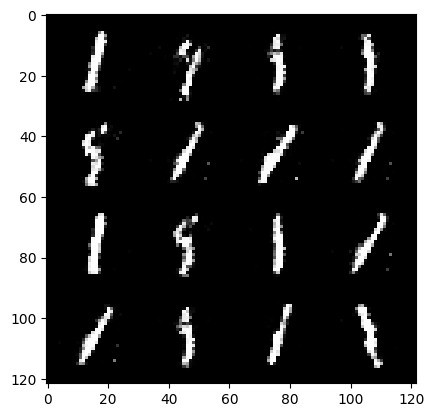

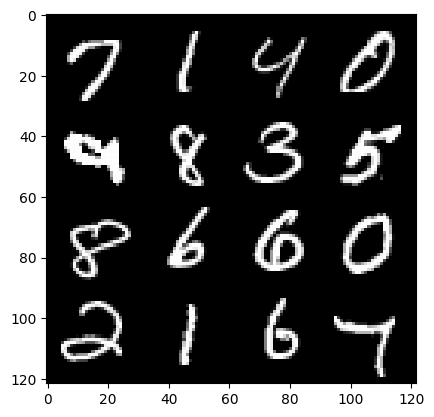

103: step 48600 / Gen loss: 2.4211732697486865 / disc_loss: 0.18578277359406153


  0%|          | 0/469 [00:00<?, ?it/s]

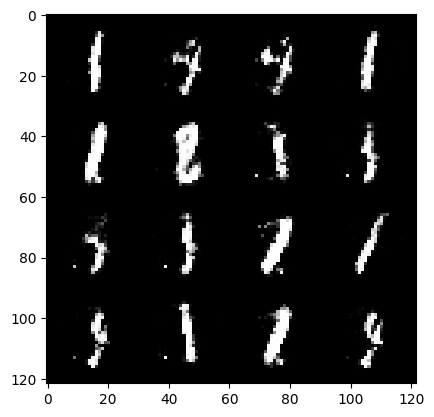

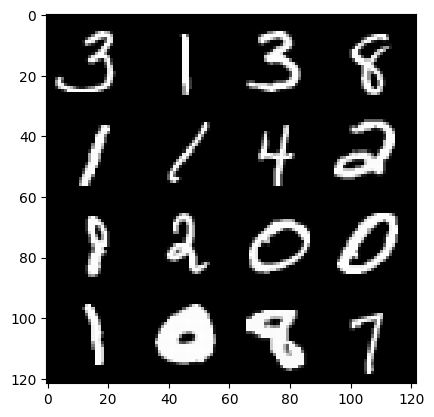

104: step 48900 / Gen loss: 2.5058470630645746 / disc_loss: 0.18580297201871884


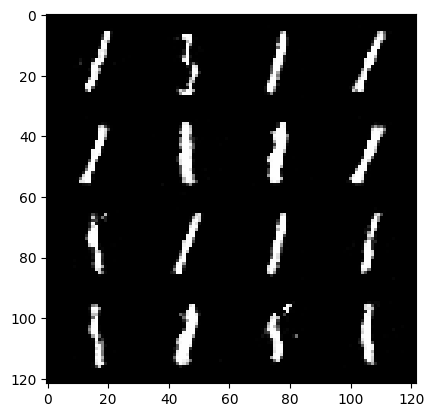

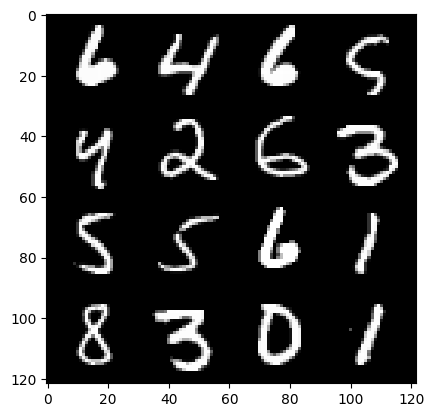

104: step 49200 / Gen loss: 2.4531044363975547 / disc_loss: 0.18426731678346786


  0%|          | 0/469 [00:00<?, ?it/s]

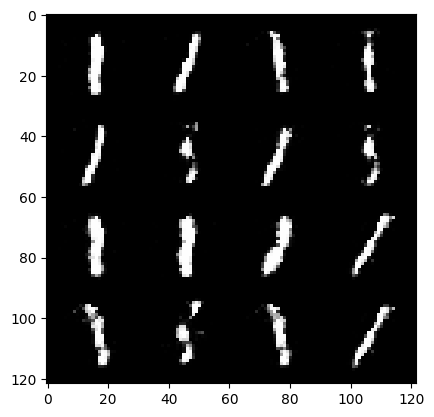

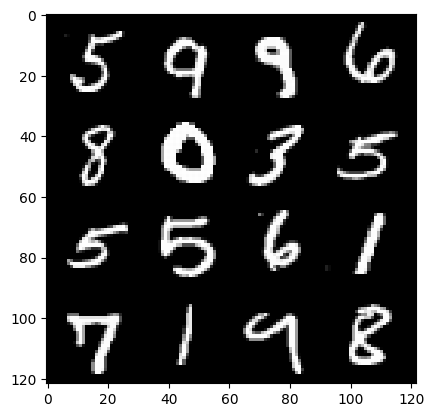

105: step 49500 / Gen loss: 2.517339854240419 / disc_loss: 0.16466279712816098


  0%|          | 0/469 [00:00<?, ?it/s]

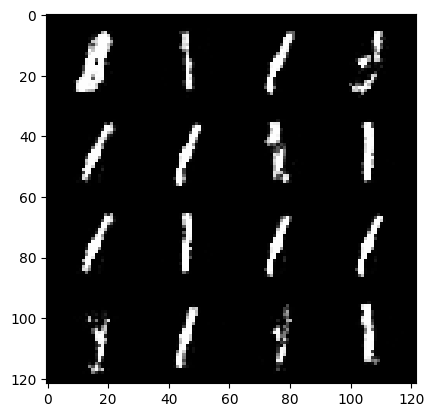

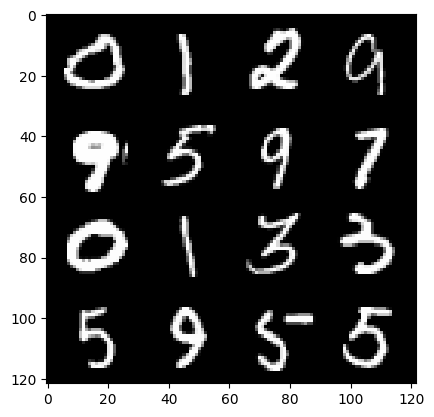

106: step 49800 / Gen loss: 2.53061802625656 / disc_loss: 0.17521413072943692


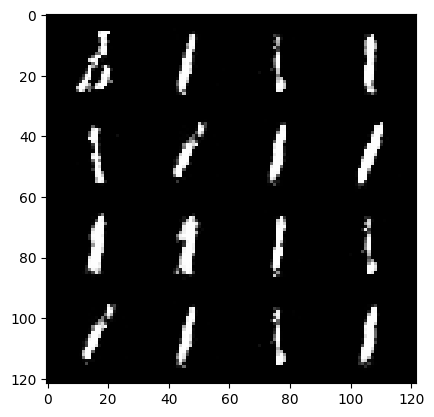

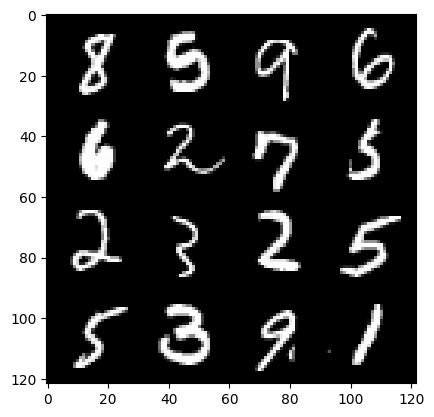

106: step 50100 / Gen loss: 2.538669137954711 / disc_loss: 0.16271501036981734


  0%|          | 0/469 [00:00<?, ?it/s]

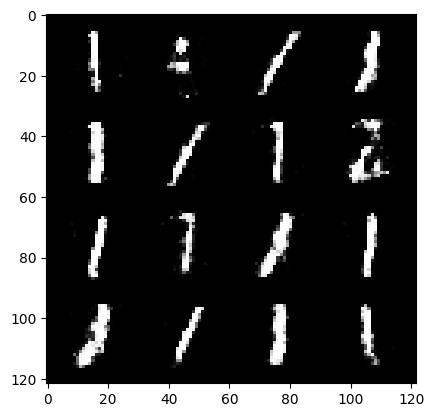

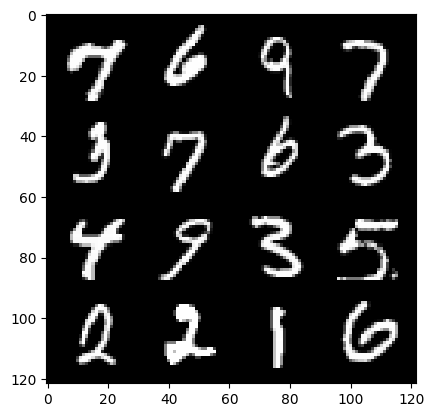

107: step 50400 / Gen loss: 2.5953748067220035 / disc_loss: 0.1765280319253603


  0%|          | 0/469 [00:00<?, ?it/s]

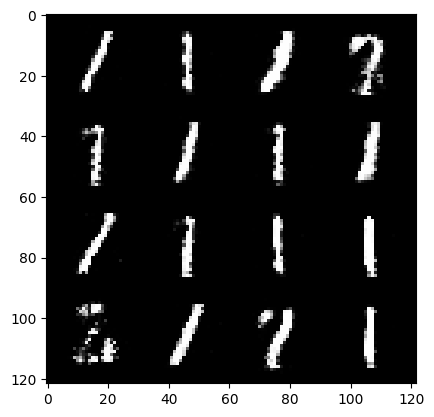

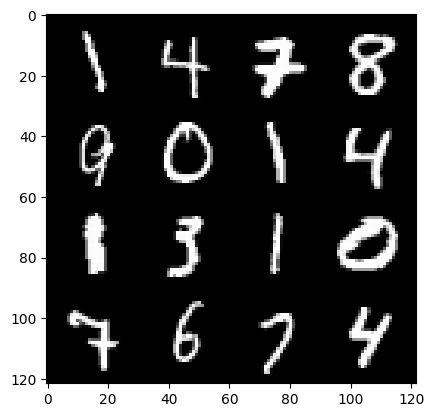

108: step 50700 / Gen loss: 2.3693715182940167 / disc_loss: 0.20432260905702906


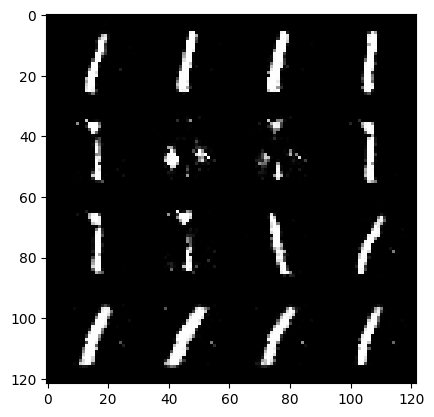

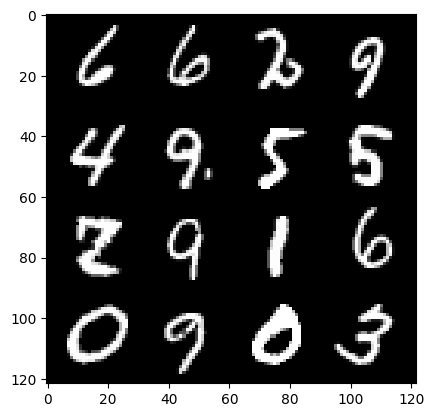

108: step 51000 / Gen loss: 2.4266537642478943 / disc_loss: 0.19065682381391533


  0%|          | 0/469 [00:00<?, ?it/s]

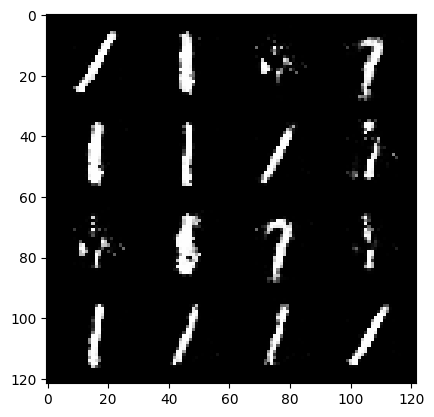

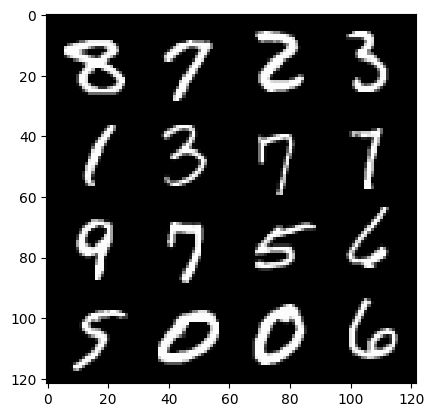

109: step 51300 / Gen loss: 2.43055688937505 / disc_loss: 0.1782141439368328


  0%|          | 0/469 [00:00<?, ?it/s]

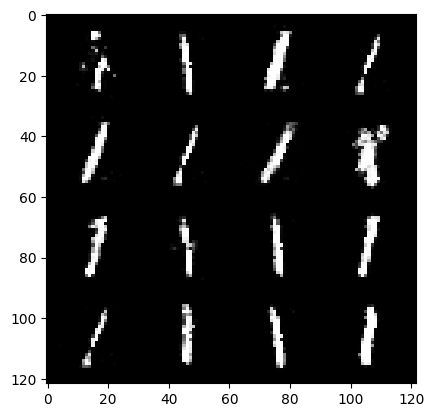

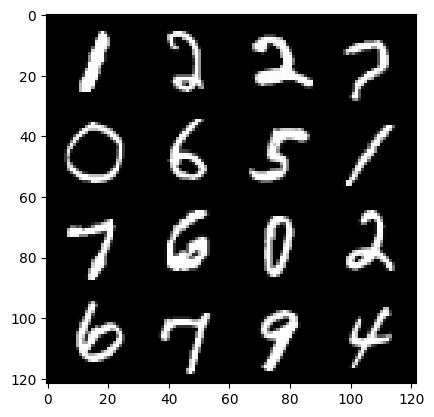

110: step 51600 / Gen loss: 2.5850288724899277 / disc_loss: 0.1666155775388083


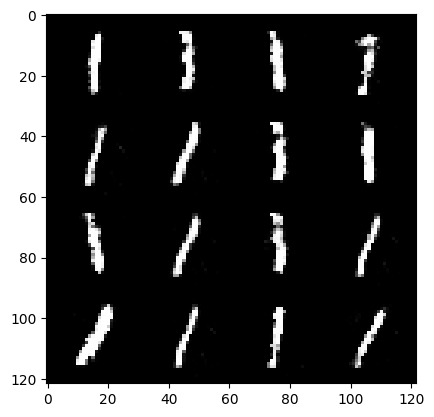

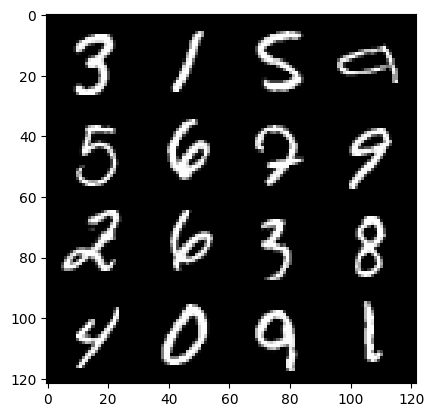

110: step 51900 / Gen loss: 2.467574036121369 / disc_loss: 0.1776885190357764


  0%|          | 0/469 [00:00<?, ?it/s]

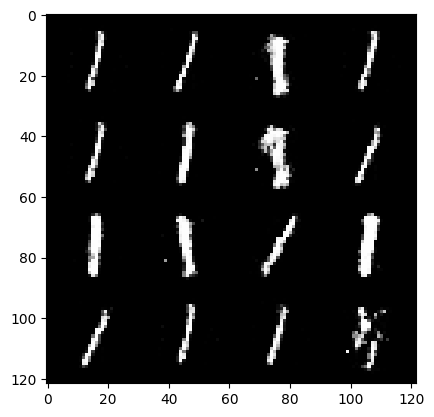

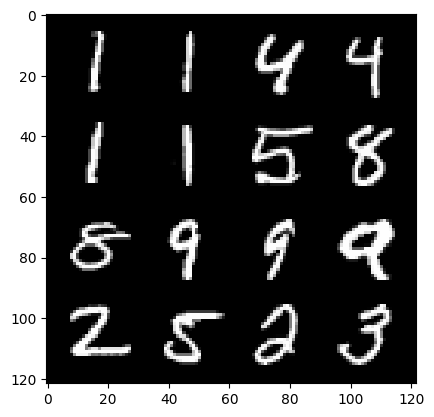

111: step 52200 / Gen loss: 2.624110422134397 / disc_loss: 0.1673867167780797


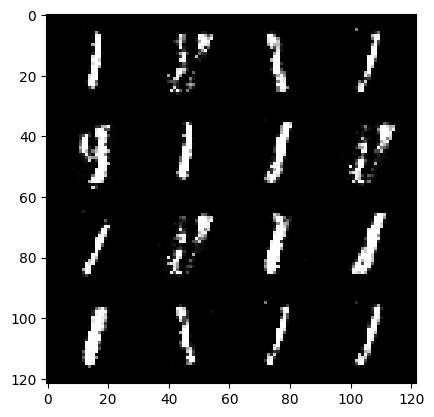

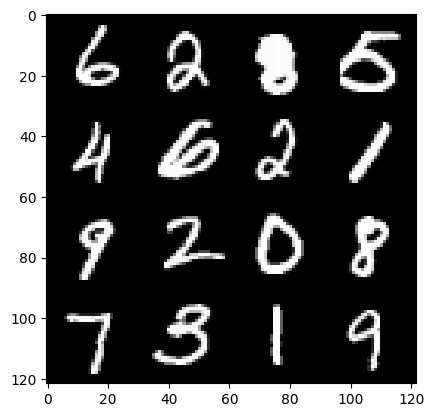

111: step 52500 / Gen loss: 2.5578068391482045 / disc_loss: 0.18278324854870642


  0%|          | 0/469 [00:00<?, ?it/s]

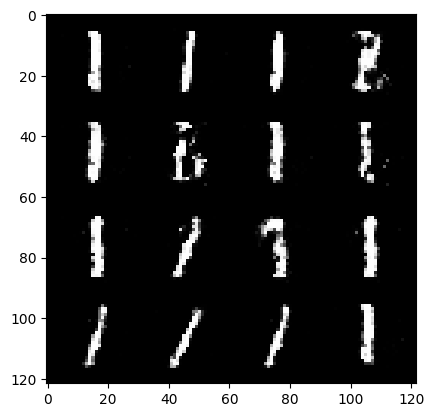

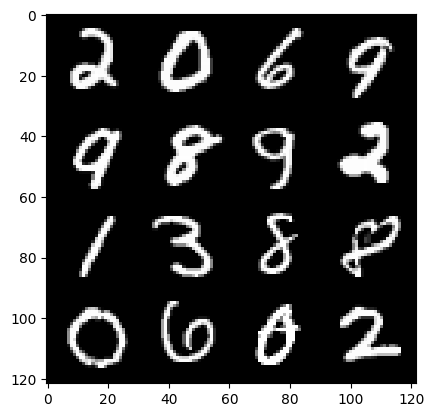

112: step 52800 / Gen loss: 2.4795109947522476 / disc_loss: 0.18023360557854168


  0%|          | 0/469 [00:00<?, ?it/s]

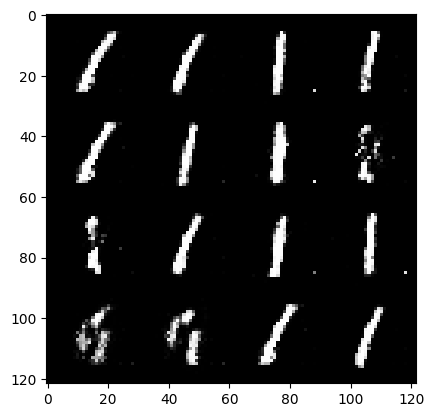

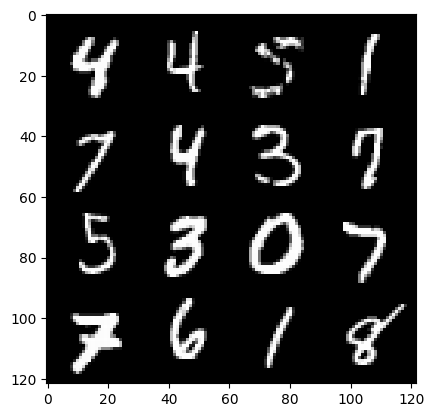

113: step 53100 / Gen loss: 2.455596289634704 / disc_loss: 0.19083366046349204


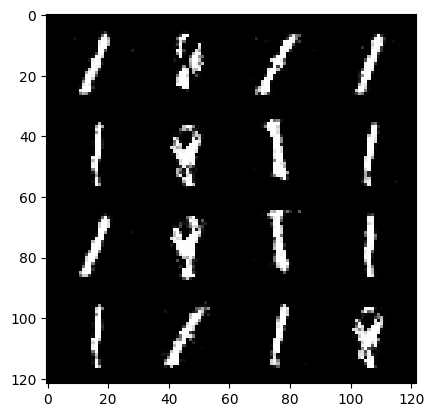

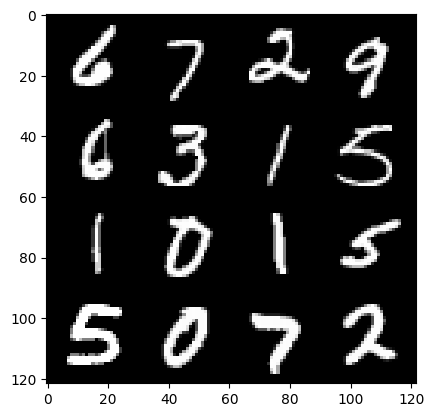

113: step 53400 / Gen loss: 2.51990671634674 / disc_loss: 0.17979208556314305


  0%|          | 0/469 [00:00<?, ?it/s]

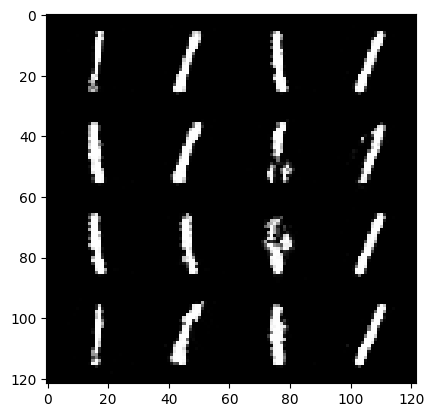

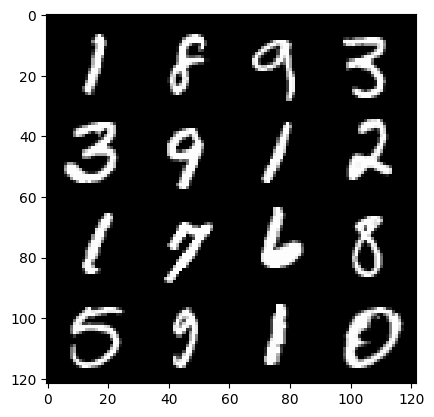

114: step 53700 / Gen loss: 2.552035495440166 / disc_loss: 0.18059518650174136


  0%|          | 0/469 [00:00<?, ?it/s]

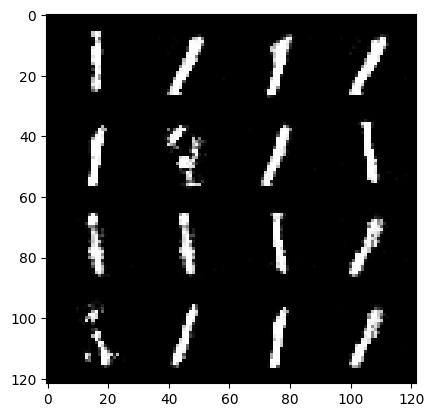

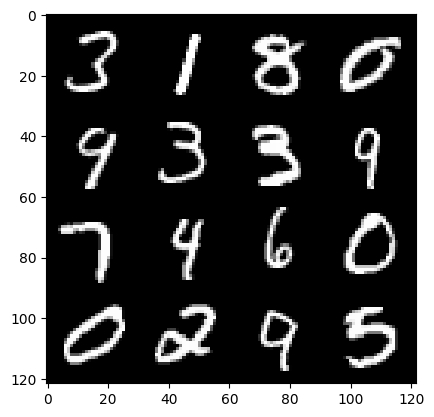

115: step 54000 / Gen loss: 2.557774232228597 / disc_loss: 0.18043565963705396


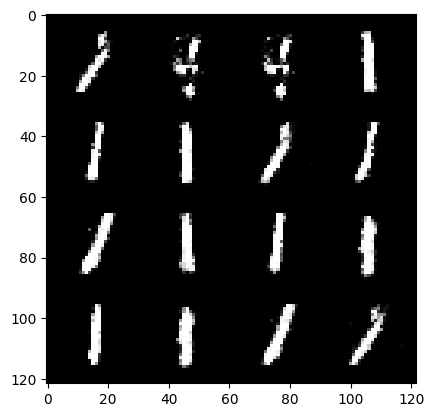

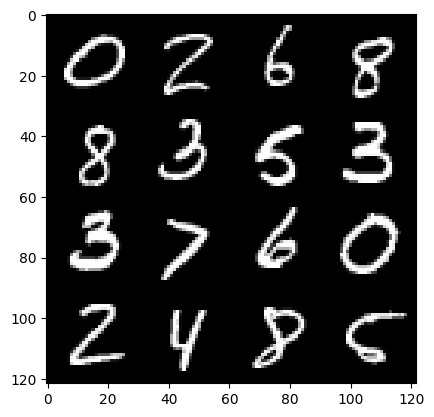

115: step 54300 / Gen loss: 2.4726939908663423 / disc_loss: 0.18860857707758746


  0%|          | 0/469 [00:00<?, ?it/s]

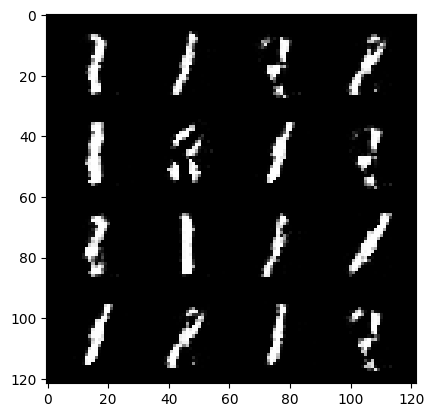

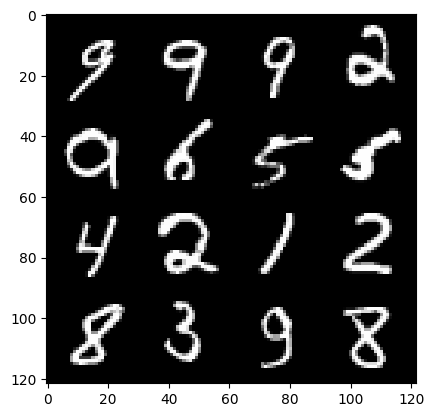

116: step 54600 / Gen loss: 2.4714733775456774 / disc_loss: 0.18331300278504684


  0%|          | 0/469 [00:00<?, ?it/s]

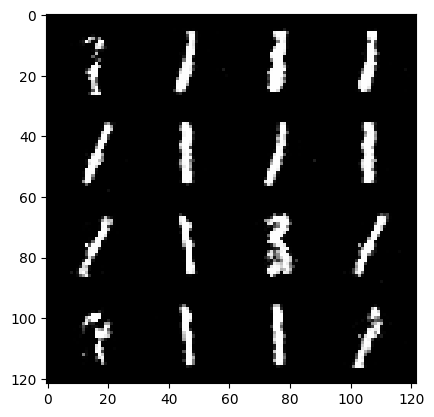

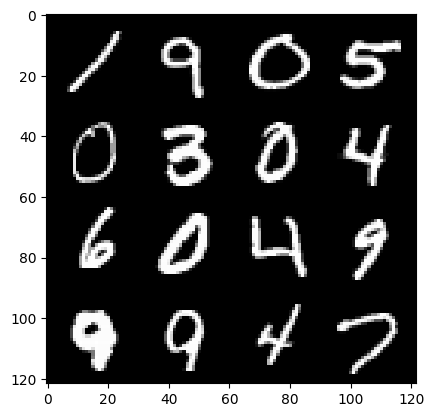

117: step 54900 / Gen loss: 2.469774465560914 / disc_loss: 0.18773187900582938


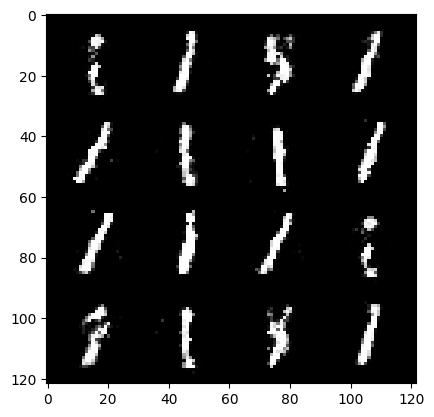

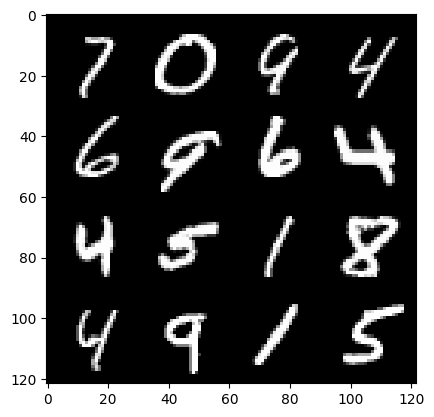

117: step 55200 / Gen loss: 2.536218417485558 / disc_loss: 0.17660680291553335


  0%|          | 0/469 [00:00<?, ?it/s]

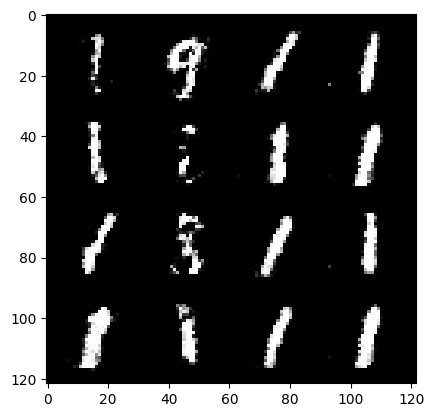

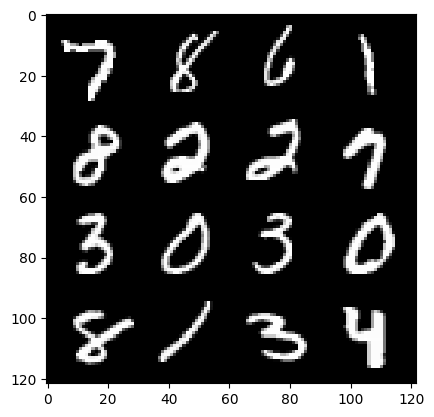

118: step 55500 / Gen loss: 2.5499976873397827 / disc_loss: 0.1779089953502021


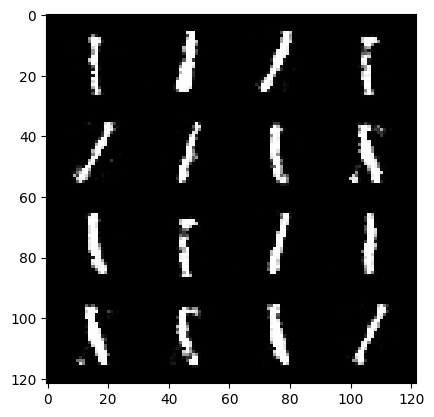

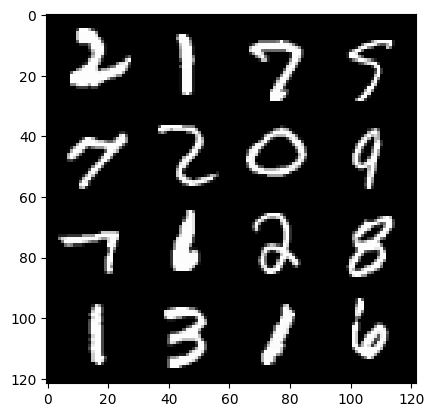

118: step 55800 / Gen loss: 2.4083010999361707 / disc_loss: 0.19144696106513343


  0%|          | 0/469 [00:00<?, ?it/s]

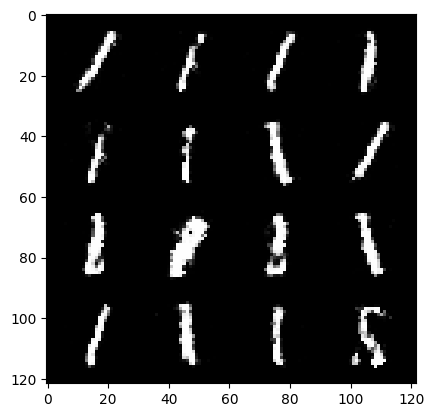

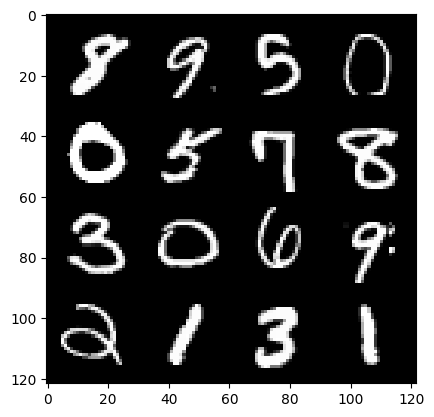

119: step 56100 / Gen loss: 2.3308392532666504 / disc_loss: 0.18673417352139957


  0%|          | 0/469 [00:00<?, ?it/s]

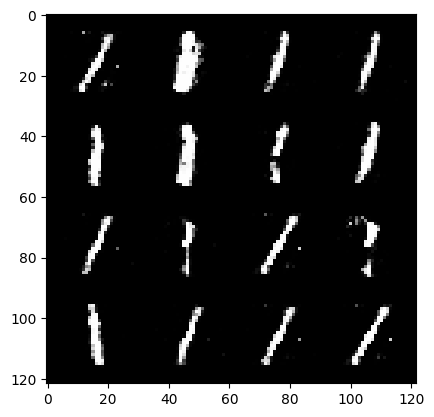

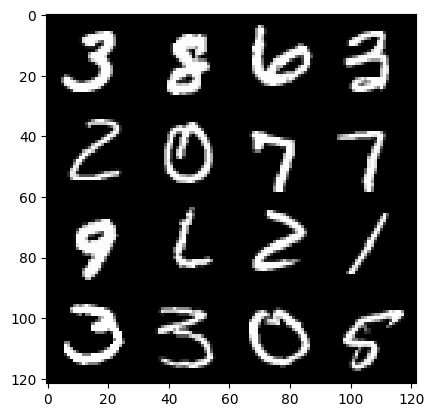

120: step 56400 / Gen loss: 2.432999417781828 / disc_loss: 0.18151191179951018


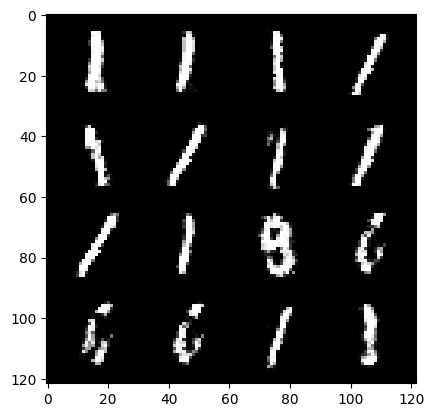

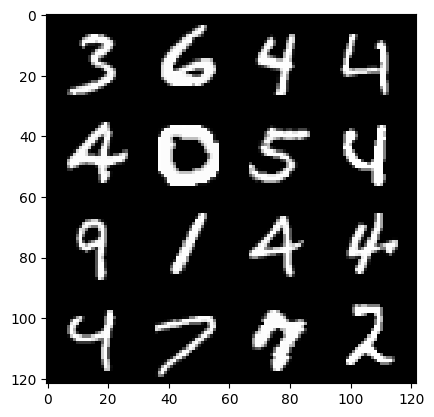

120: step 56700 / Gen loss: 2.464853088855743 / disc_loss: 0.19137751313547285


  0%|          | 0/469 [00:00<?, ?it/s]

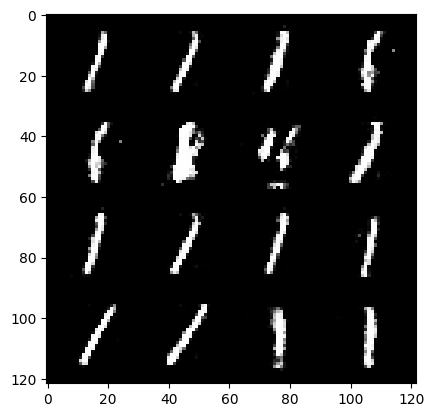

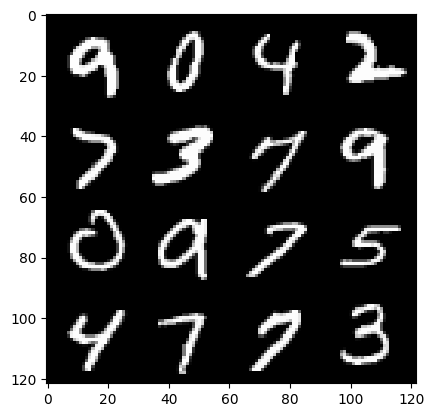

121: step 57000 / Gen loss: 2.365904117425282 / disc_loss: 0.18266579118867735


  0%|          | 0/469 [00:00<?, ?it/s]

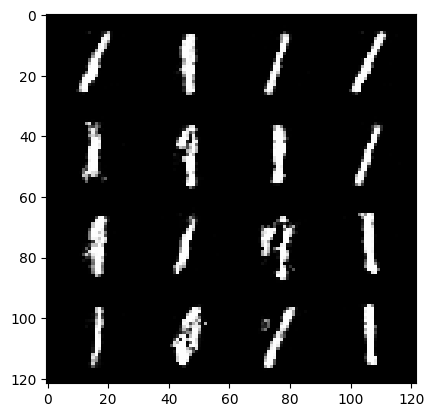

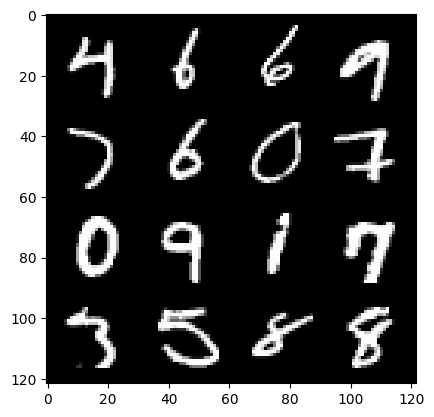

122: step 57300 / Gen loss: 2.503638030687968 / disc_loss: 0.18111544787883768


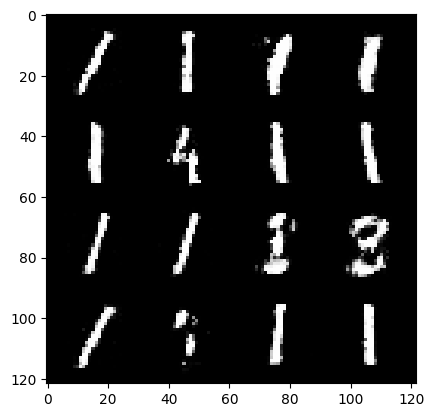

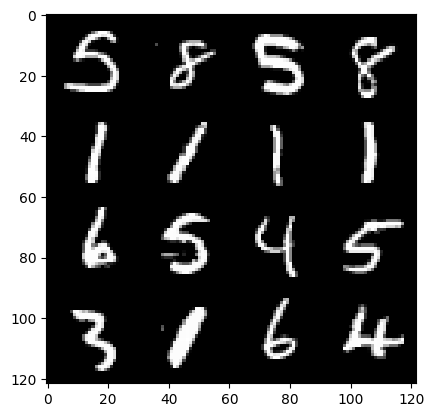

122: step 57600 / Gen loss: 2.4180828388532 / disc_loss: 0.1925517548869053


  0%|          | 0/469 [00:00<?, ?it/s]

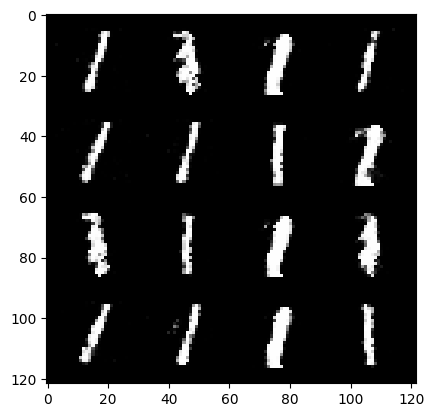

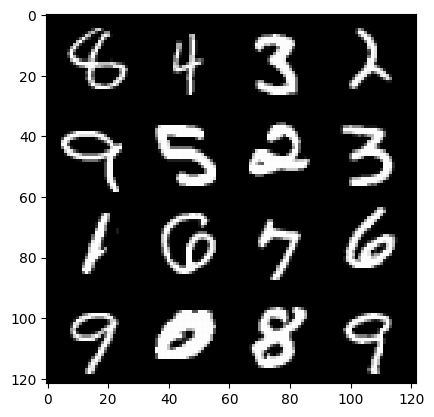

123: step 57900 / Gen loss: 2.3707721400260953 / disc_loss: 0.19766259007155879


  0%|          | 0/469 [00:00<?, ?it/s]

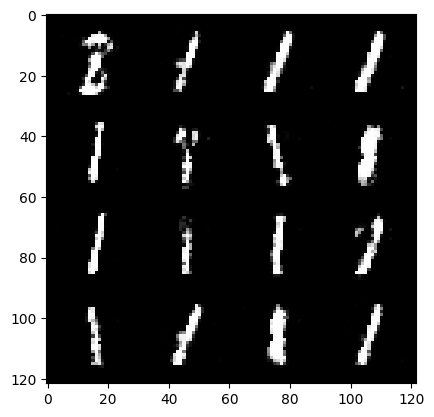

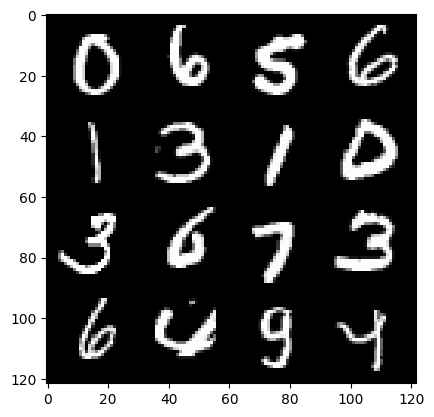

124: step 58200 / Gen loss: 2.3856990218162535 / disc_loss: 0.18830343236525846


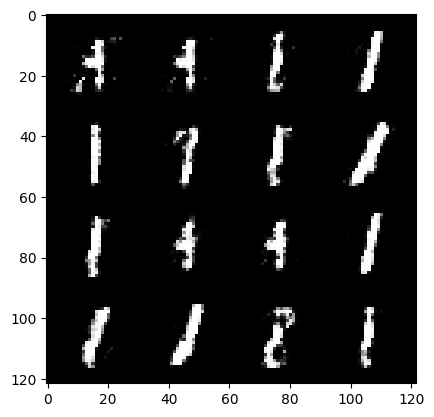

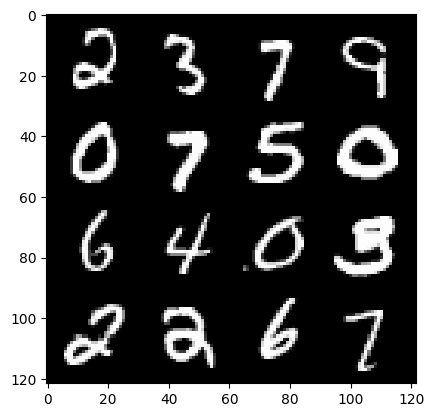

124: step 58500 / Gen loss: 2.3861816096305857 / disc_loss: 0.19572175338864314


  0%|          | 0/469 [00:00<?, ?it/s]

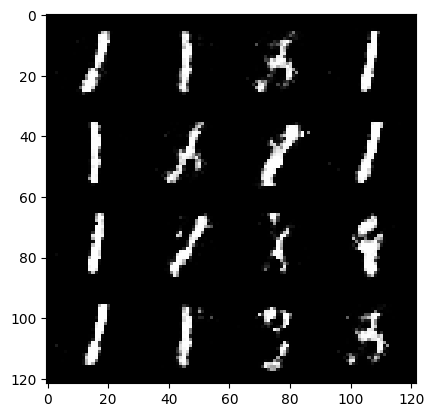

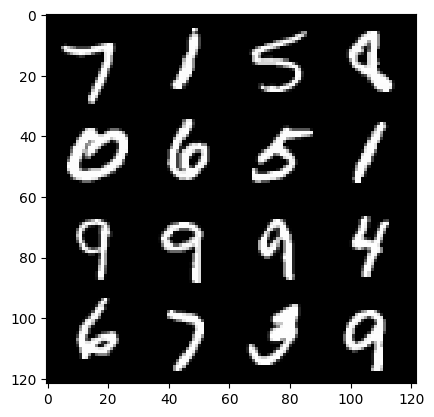

125: step 58800 / Gen loss: 2.3231215298175796 / disc_loss: 0.209803093224764


  0%|          | 0/469 [00:00<?, ?it/s]

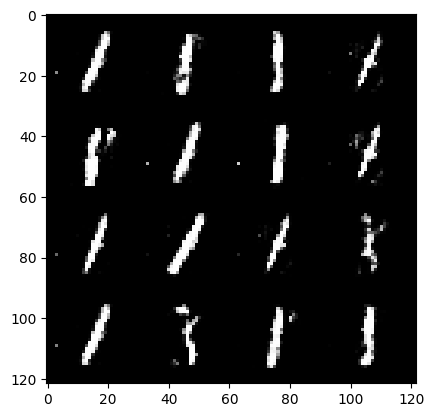

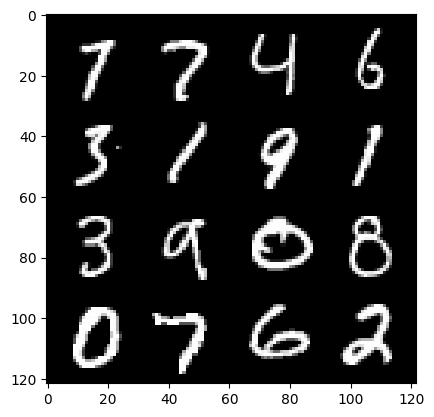

126: step 59100 / Gen loss: 2.368719123999277 / disc_loss: 0.2074926910797754


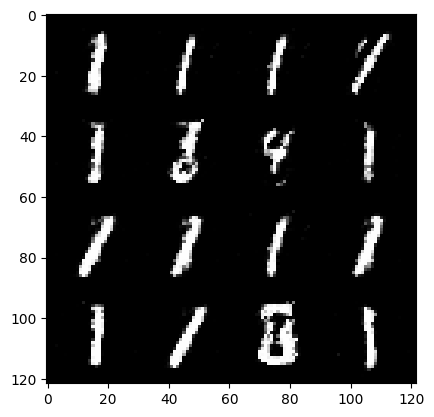

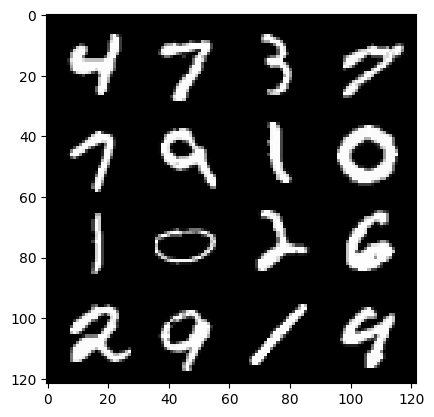

126: step 59400 / Gen loss: 2.287875595092773 / disc_loss: 0.20685209631919863


  0%|          | 0/469 [00:00<?, ?it/s]

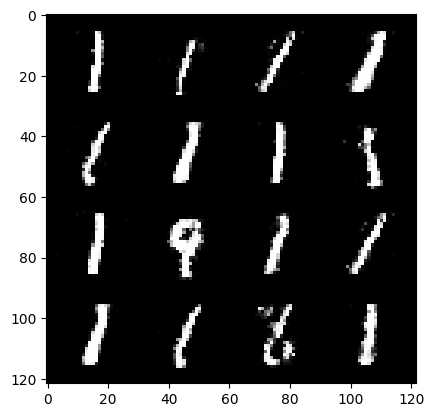

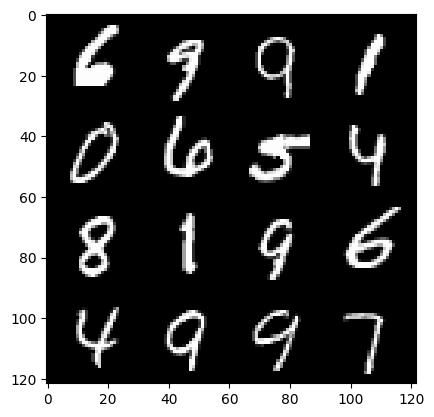

127: step 59700 / Gen loss: 2.279749842484793 / disc_loss: 0.2096246075381834


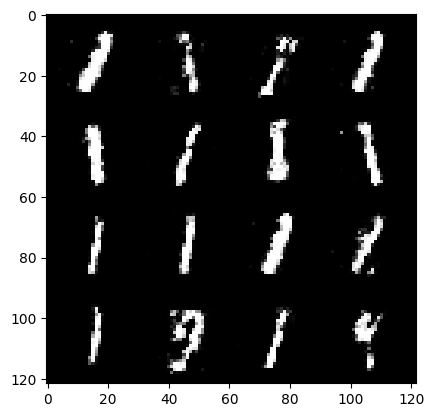

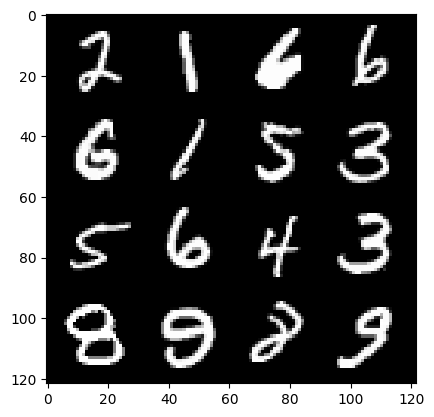

127: step 60000 / Gen loss: 2.354769833882649 / disc_loss: 0.19591119058430206


  0%|          | 0/469 [00:00<?, ?it/s]

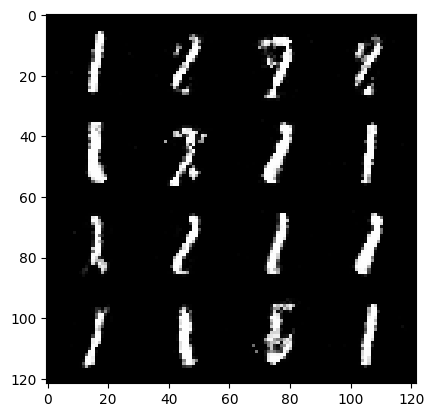

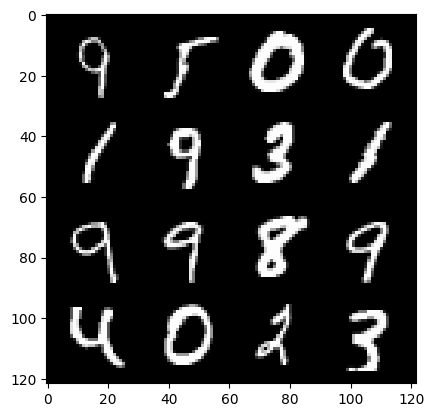

128: step 60300 / Gen loss: 2.2920813226699814 / disc_loss: 0.2067488921682041


  0%|          | 0/469 [00:00<?, ?it/s]

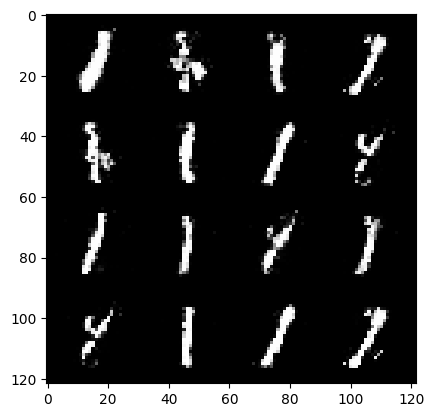

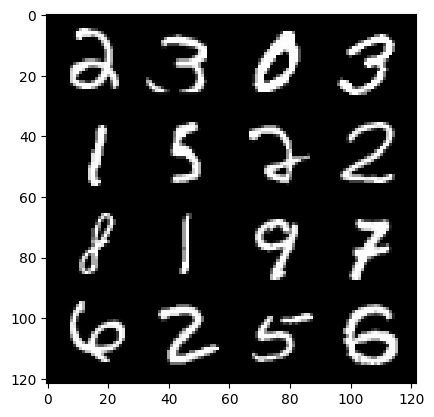

129: step 60600 / Gen loss: 2.4018868875503547 / disc_loss: 0.18801992880801363


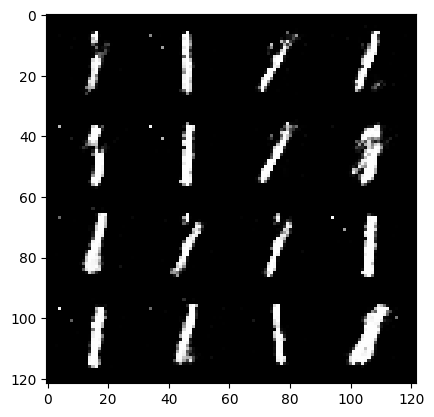

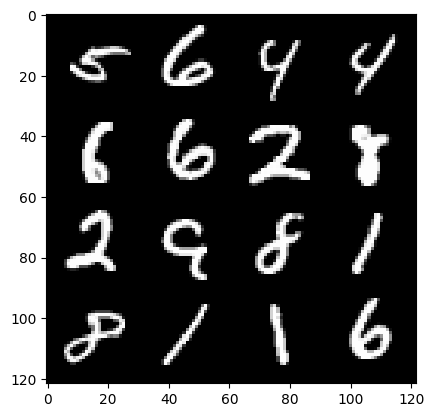

129: step 60900 / Gen loss: 2.411056706905363 / disc_loss: 0.19433248812953624


  0%|          | 0/469 [00:00<?, ?it/s]

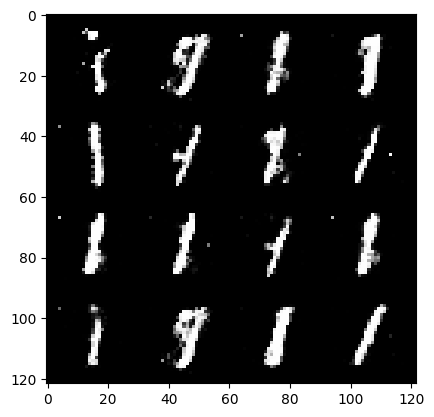

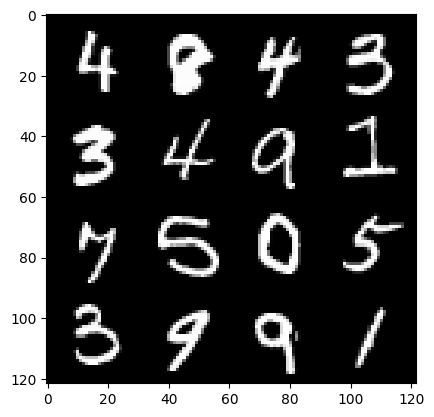

130: step 61200 / Gen loss: 2.381966989835103 / disc_loss: 0.18593471395472694


  0%|          | 0/469 [00:00<?, ?it/s]

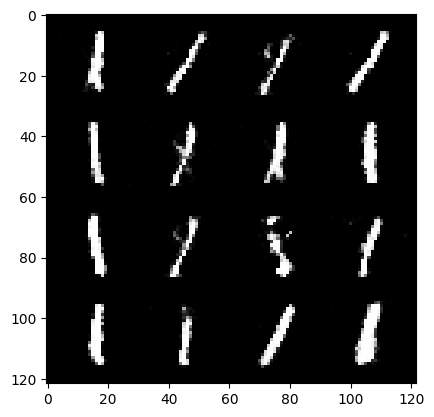

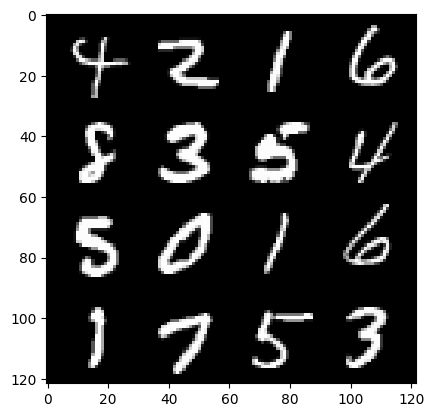

131: step 61500 / Gen loss: 2.531806771755217 / disc_loss: 0.17484192490577696


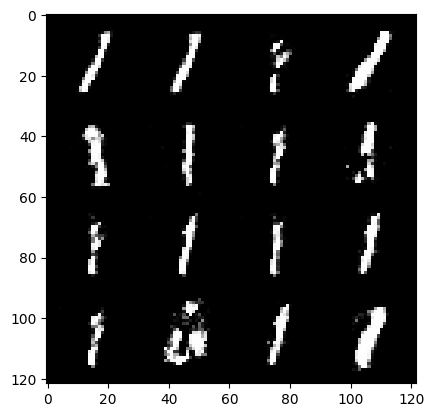

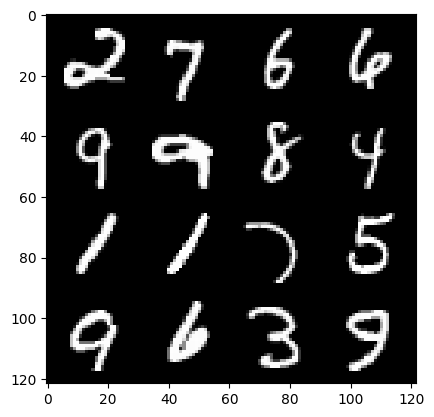

131: step 61800 / Gen loss: 2.312282461722694 / disc_loss: 0.203458535571893


  0%|          | 0/469 [00:00<?, ?it/s]

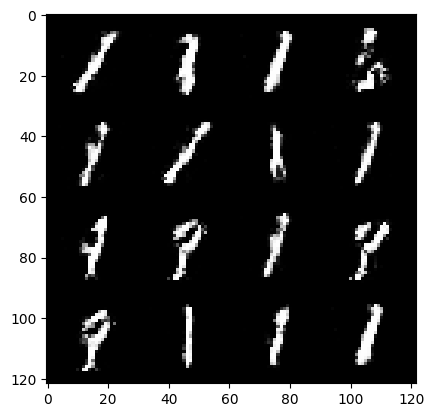

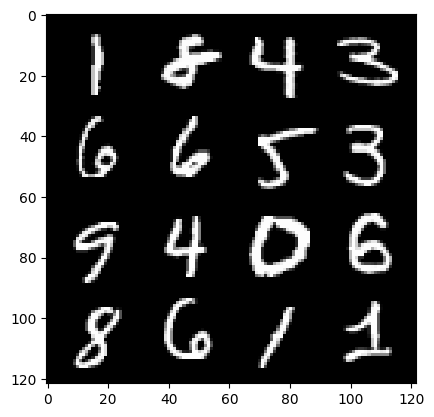

132: step 62100 / Gen loss: 2.2494135900338503 / disc_loss: 0.2069545118510725


  0%|          | 0/469 [00:00<?, ?it/s]

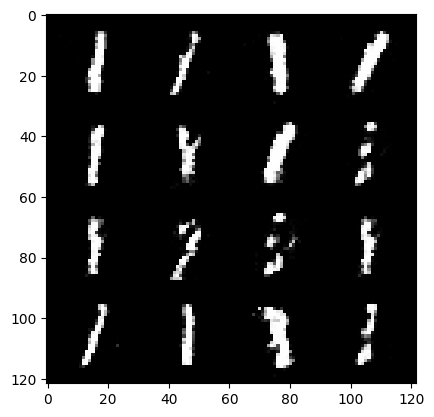

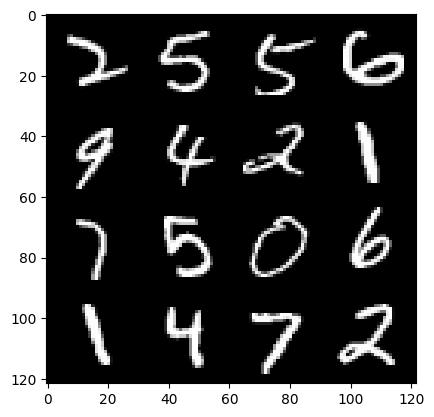

133: step 62400 / Gen loss: 2.3171289944648716 / disc_loss: 0.19500776678323728


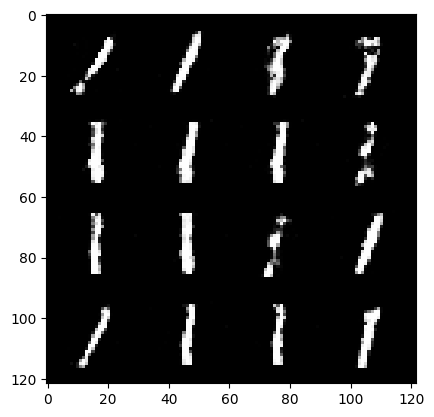

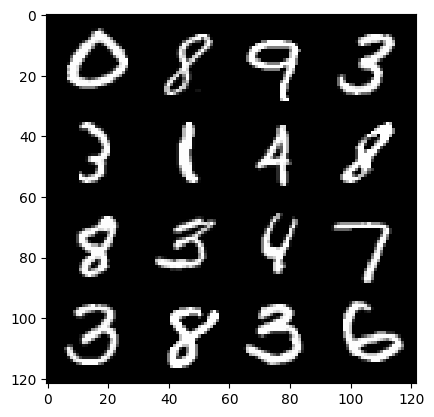

133: step 62700 / Gen loss: 2.312230542500813 / disc_loss: 0.20233501774569346


  0%|          | 0/469 [00:00<?, ?it/s]

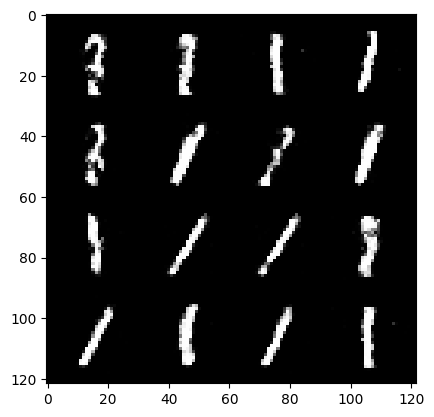

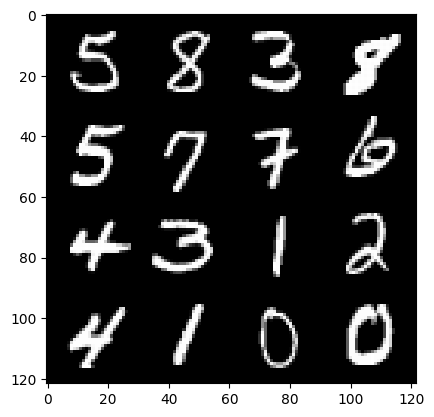

134: step 63000 / Gen loss: 2.268001400629679 / disc_loss: 0.20370570617417505


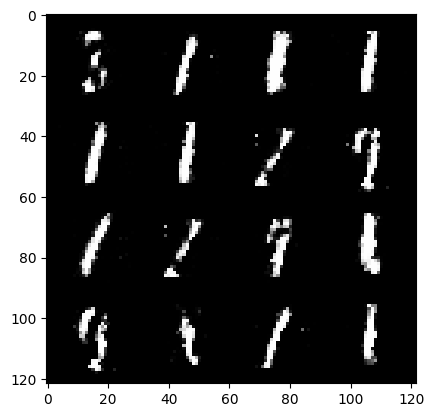

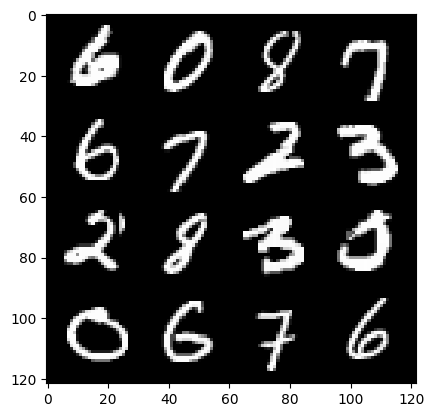

134: step 63300 / Gen loss: 2.4002840081850683 / disc_loss: 0.19364191298683475


  0%|          | 0/469 [00:00<?, ?it/s]

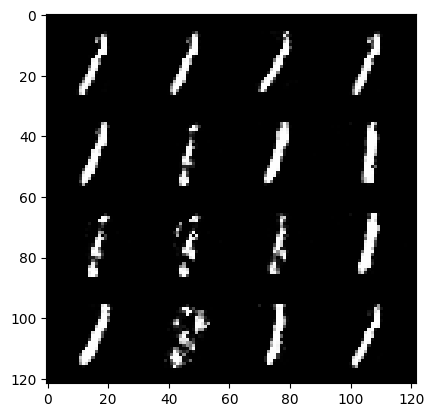

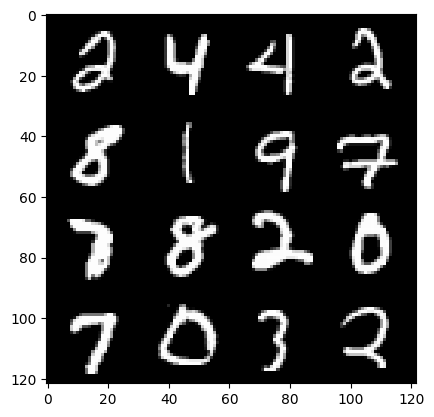

135: step 63600 / Gen loss: 2.340174428621927 / disc_loss: 0.19391523490349452


  0%|          | 0/469 [00:00<?, ?it/s]

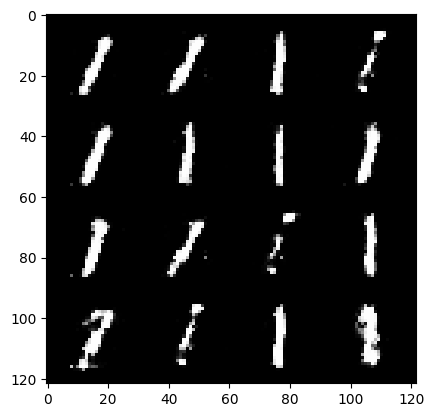

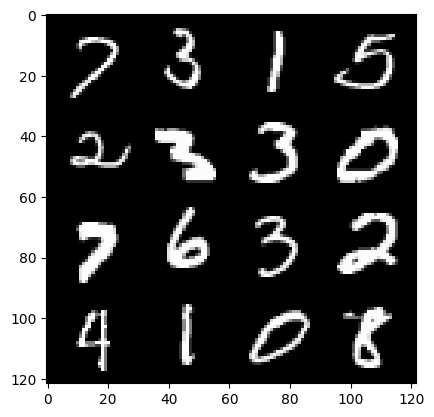

136: step 63900 / Gen loss: 2.2947569187482206 / disc_loss: 0.1979040362437565


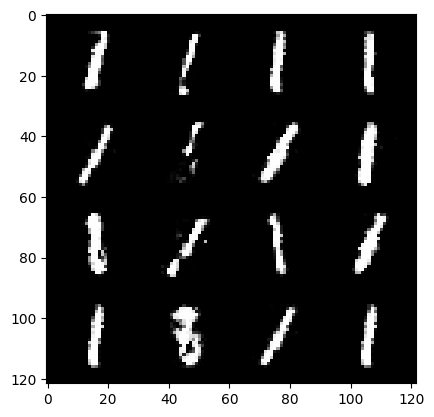

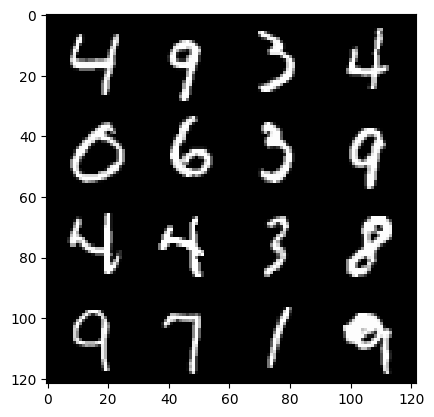

136: step 64200 / Gen loss: 2.4454642430941265 / disc_loss: 0.17817664399743066


  0%|          | 0/469 [00:00<?, ?it/s]

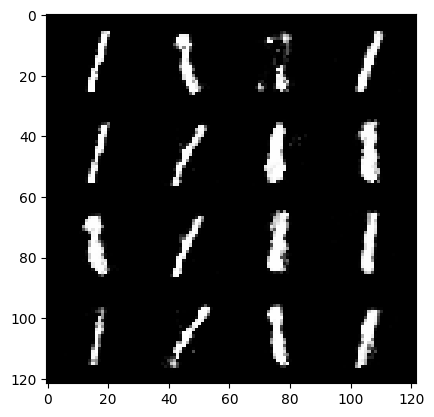

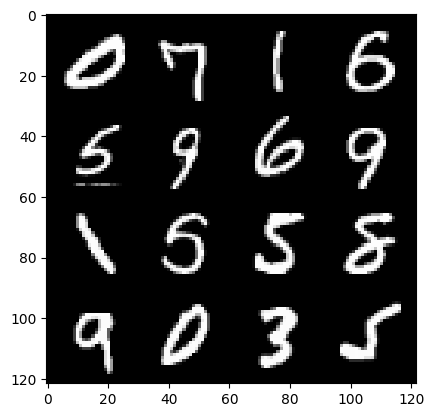

137: step 64500 / Gen loss: 2.3210340317090363 / disc_loss: 0.19369191882510986


  0%|          | 0/469 [00:00<?, ?it/s]

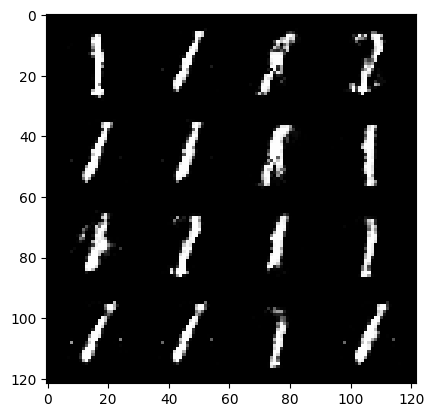

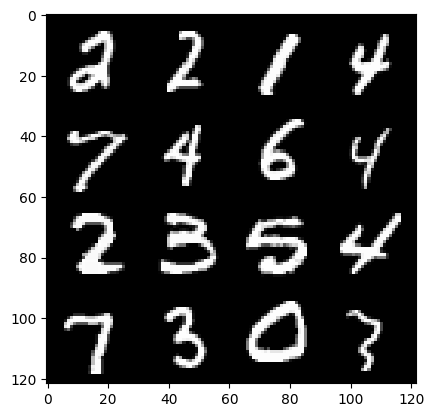

138: step 64800 / Gen loss: 2.372461432615916 / disc_loss: 0.20220802851021297


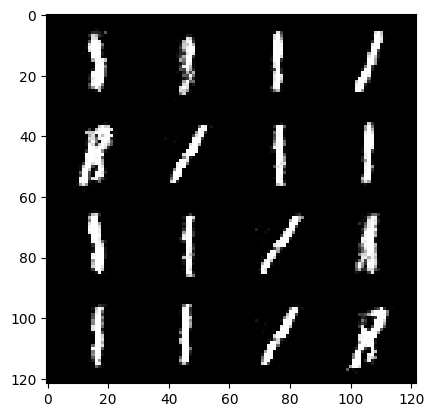

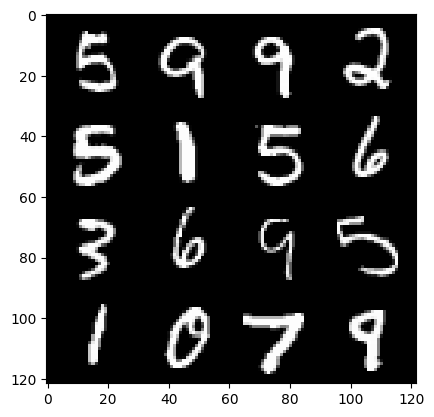

138: step 65100 / Gen loss: 2.4593213367462172 / disc_loss: 0.182468016023437


  0%|          | 0/469 [00:00<?, ?it/s]

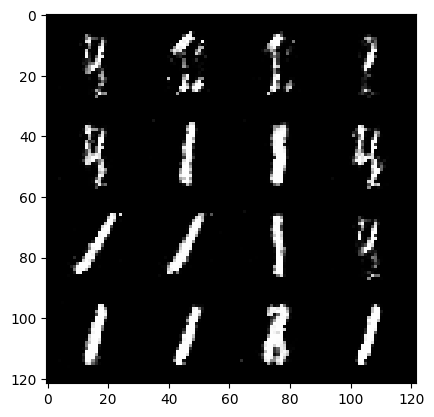

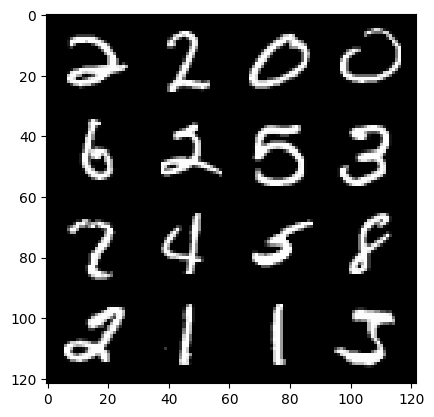

139: step 65400 / Gen loss: 2.3835415720939634 / disc_loss: 0.19687765620648864


  0%|          | 0/469 [00:00<?, ?it/s]

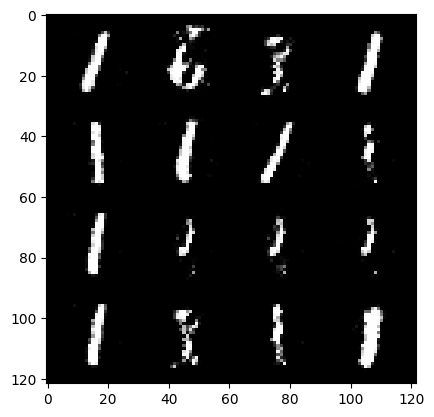

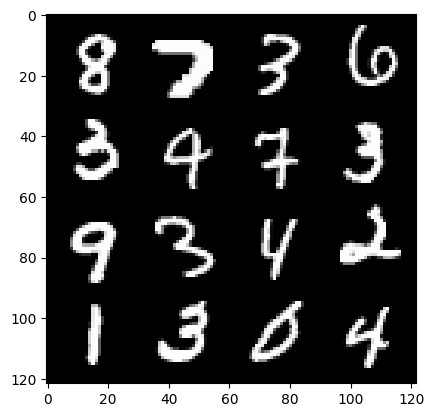

140: step 65700 / Gen loss: 2.3078015367190035 / disc_loss: 0.20178035080432882


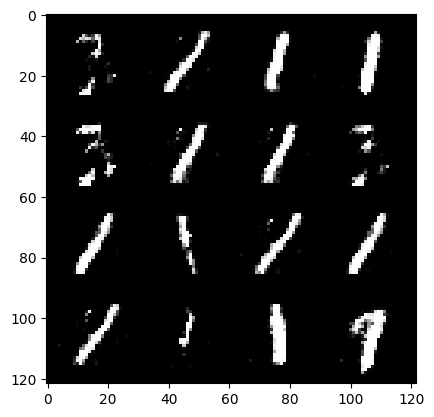

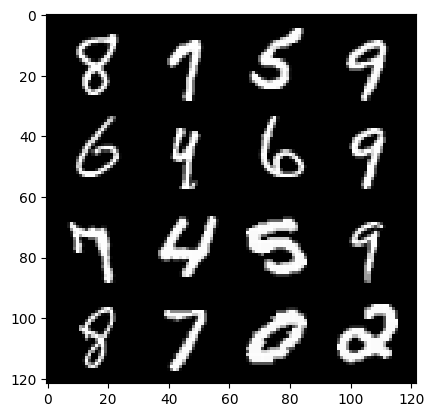

140: step 66000 / Gen loss: 2.2901909542083745 / disc_loss: 0.19770411670207969


  0%|          | 0/469 [00:00<?, ?it/s]

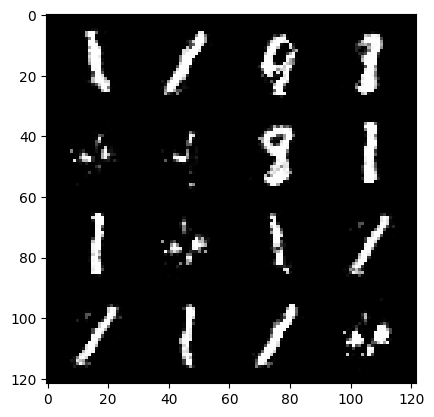

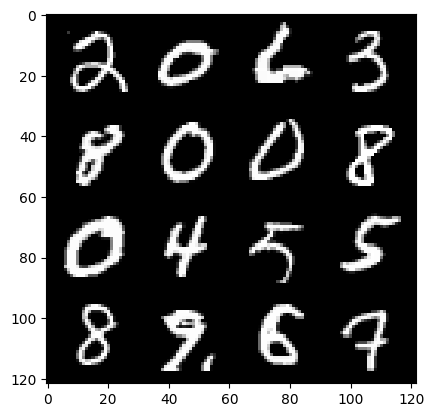

141: step 66300 / Gen loss: 2.2883169460296617 / disc_loss: 0.20194914345939954


  0%|          | 0/469 [00:00<?, ?it/s]

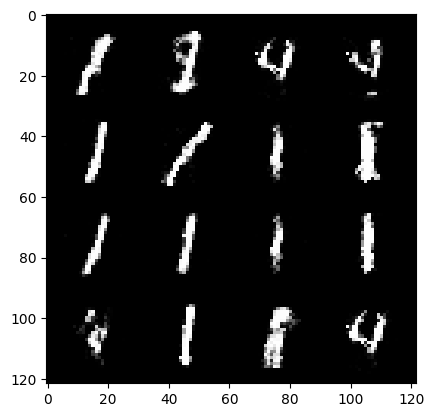

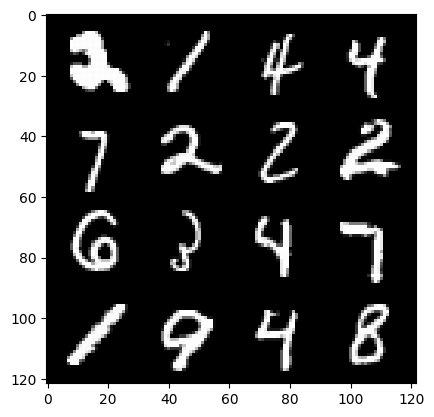

142: step 66600 / Gen loss: 2.291854749917984 / disc_loss: 0.19965886406600464


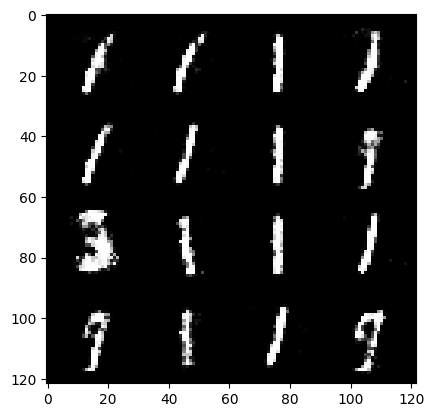

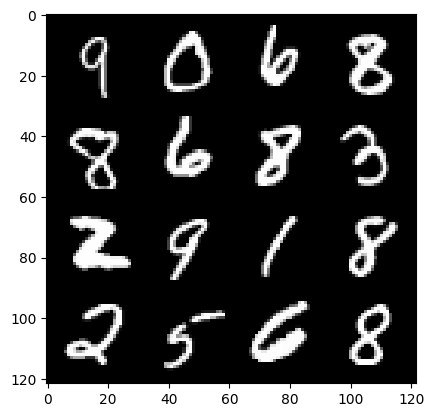

142: step 66900 / Gen loss: 2.3047541189193734 / disc_loss: 0.20674851223826413


  0%|          | 0/469 [00:00<?, ?it/s]

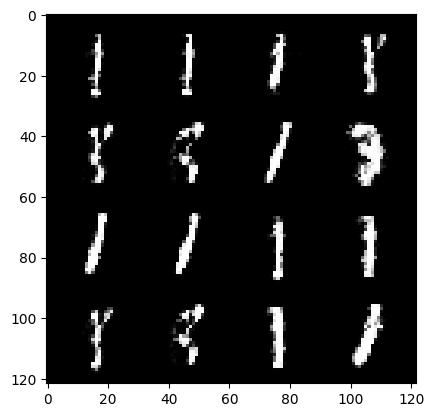

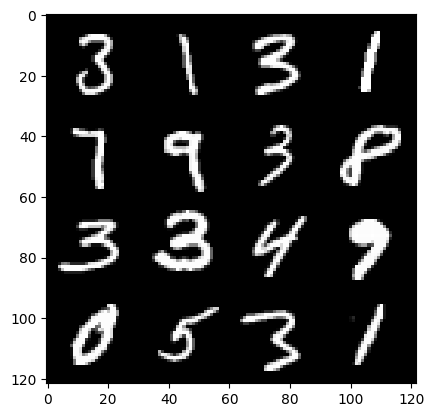

143: step 67200 / Gen loss: 2.257077109813689 / disc_loss: 0.21345629851023357


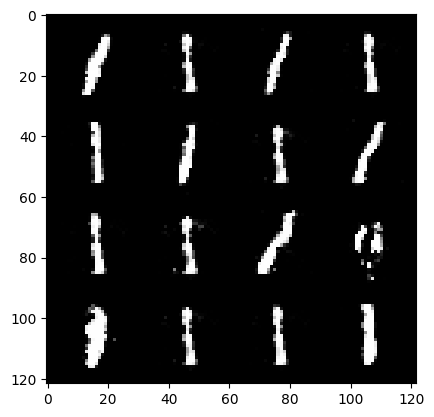

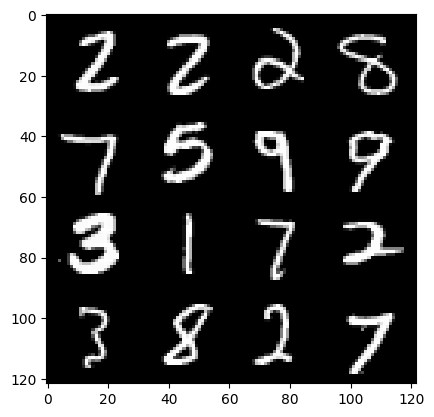

143: step 67500 / Gen loss: 2.3640992331504838 / disc_loss: 0.19728478632867336


  0%|          | 0/469 [00:00<?, ?it/s]

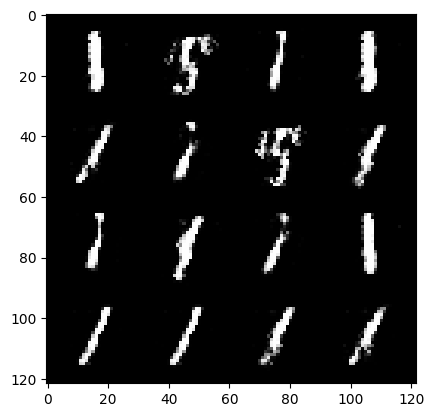

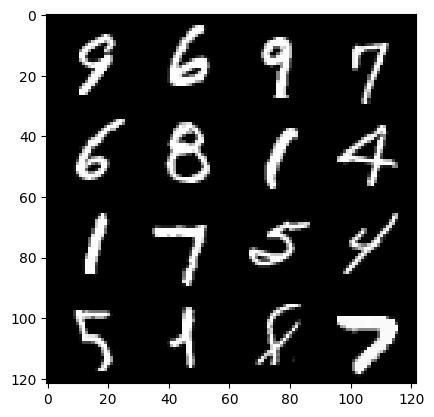

144: step 67800 / Gen loss: 2.39927476803462 / disc_loss: 0.18644701619942983


  0%|          | 0/469 [00:00<?, ?it/s]

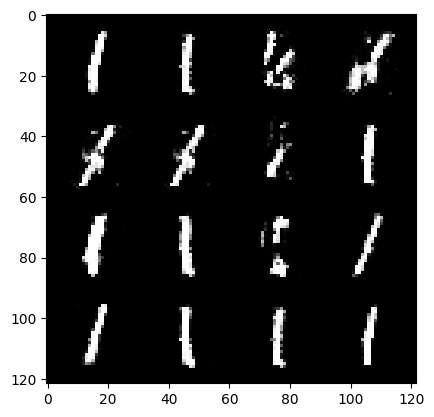

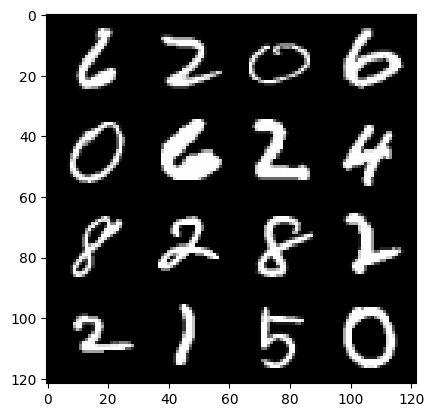

145: step 68100 / Gen loss: 2.3579912002881374 / disc_loss: 0.18683468185365196


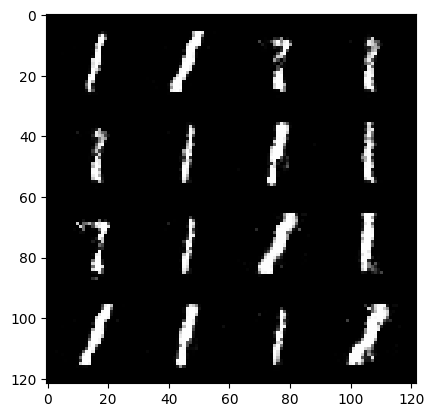

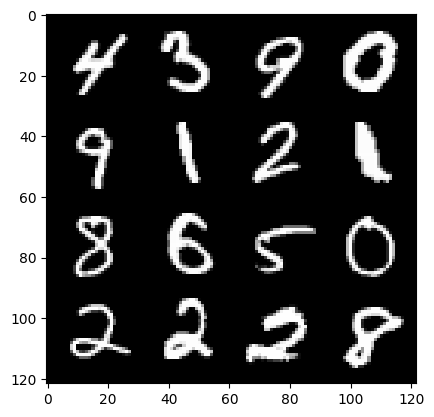

145: step 68400 / Gen loss: 2.4897410996754963 / disc_loss: 0.1867112572739521


  0%|          | 0/469 [00:00<?, ?it/s]

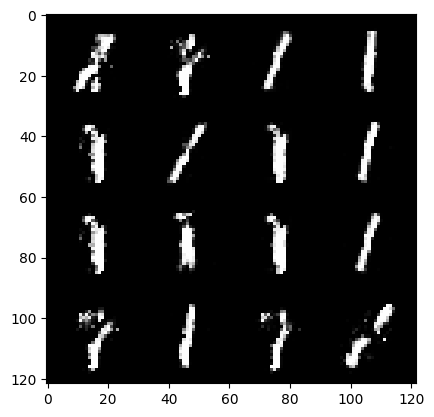

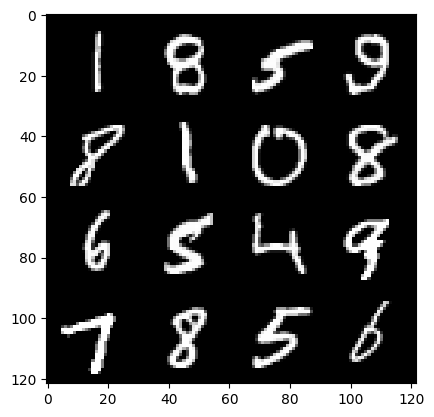

146: step 68700 / Gen loss: 2.620636693636574 / disc_loss: 0.1722219756493966


  0%|          | 0/469 [00:00<?, ?it/s]

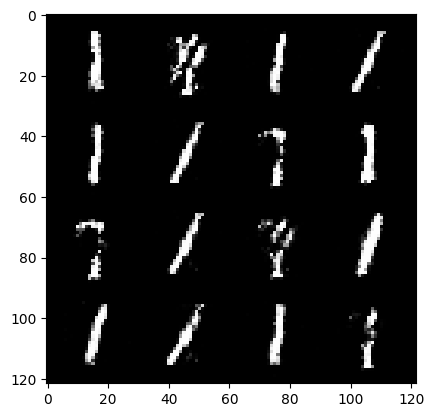

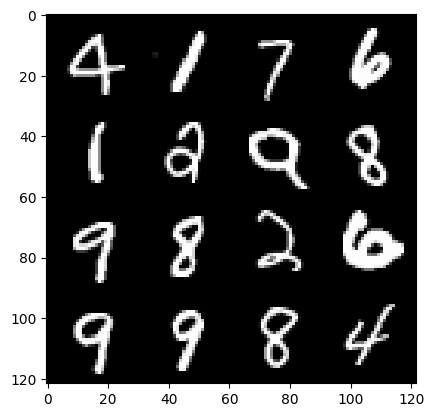

147: step 69000 / Gen loss: 2.602620258331298 / disc_loss: 0.17844479762017718


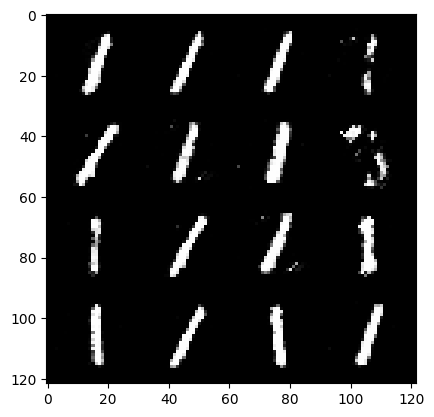

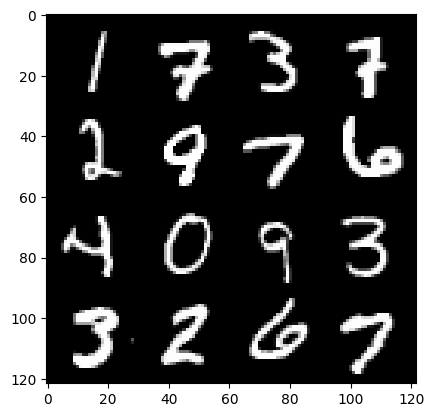

147: step 69300 / Gen loss: 2.35709814310074 / disc_loss: 0.20054938534895586


  0%|          | 0/469 [00:00<?, ?it/s]

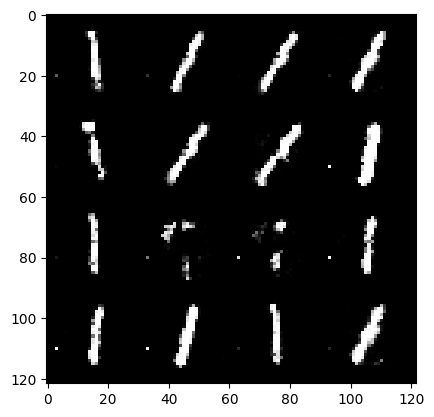

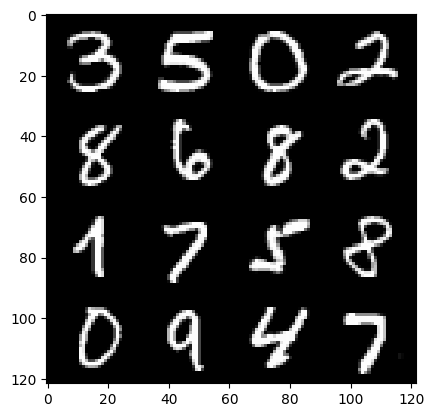

148: step 69600 / Gen loss: 2.2929541905721034 / disc_loss: 0.21345309011638183


  0%|          | 0/469 [00:00<?, ?it/s]

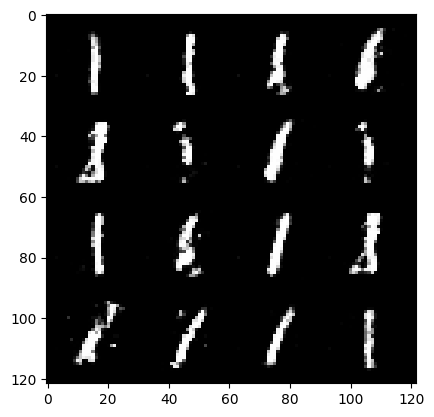

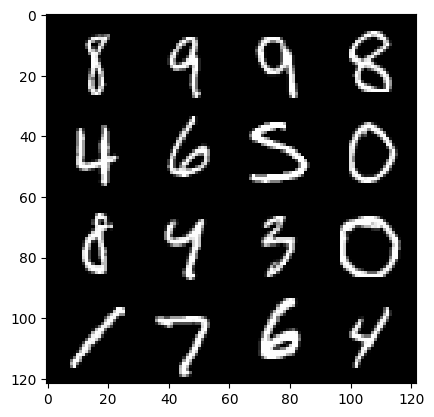

149: step 69900 / Gen loss: 2.4284249385197954 / disc_loss: 0.1855882634470859


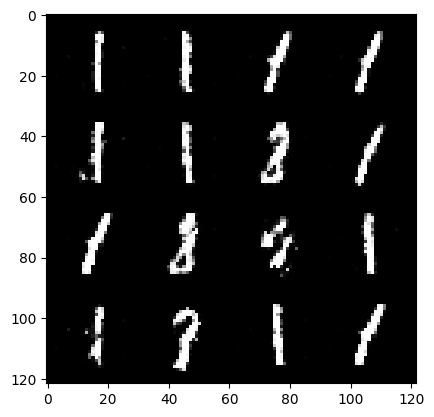

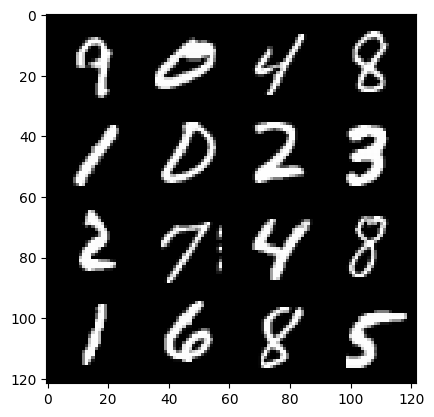

149: step 70200 / Gen loss: 2.3612211028734817 / disc_loss: 0.1825883147368829


  0%|          | 0/469 [00:00<?, ?it/s]

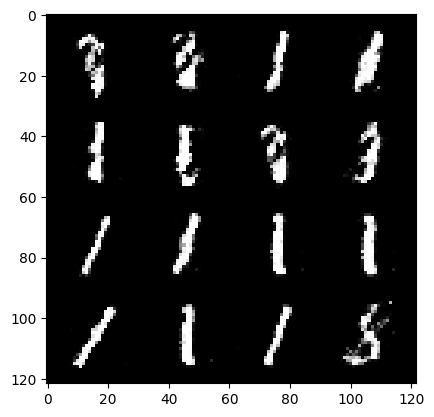

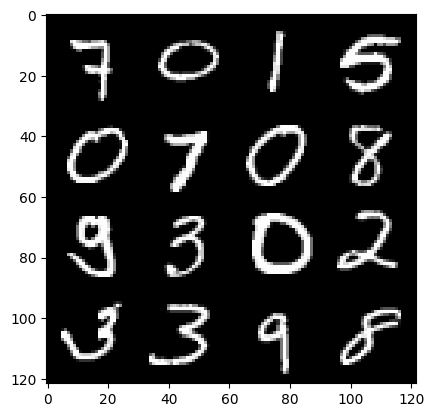

150: step 70500 / Gen loss: 2.3999397818247483 / disc_loss: 0.18848044010500123


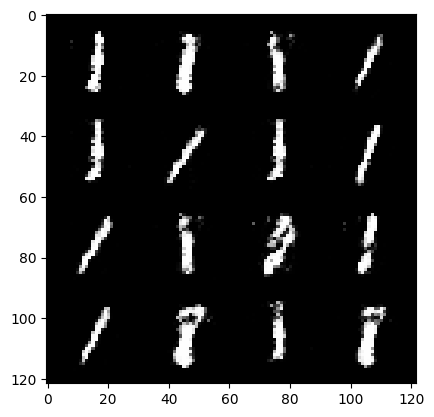

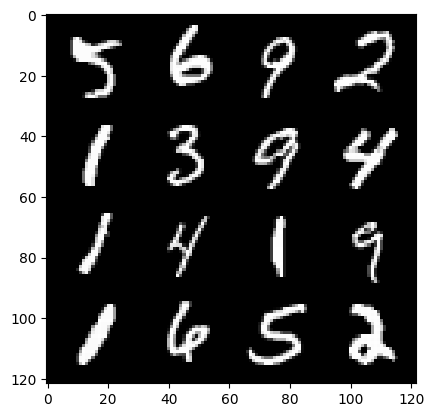

150: step 70800 / Gen loss: 2.497896212736767 / disc_loss: 0.18007355285187554


  0%|          | 0/469 [00:00<?, ?it/s]

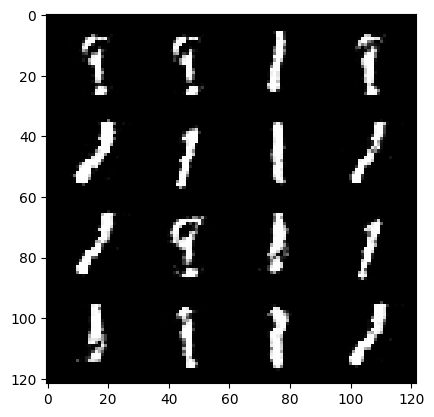

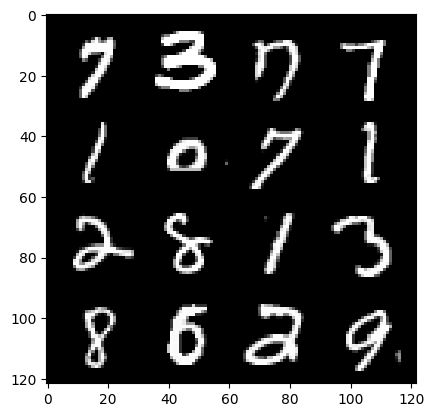

151: step 71100 / Gen loss: 2.301928659280142 / disc_loss: 0.2075929924100638


  0%|          | 0/469 [00:00<?, ?it/s]

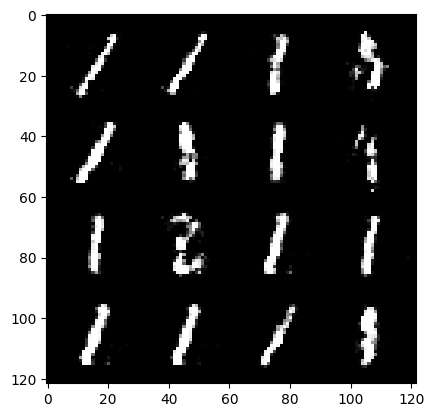

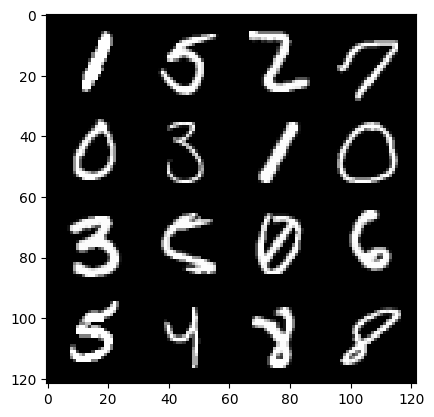

152: step 71400 / Gen loss: 2.3987571851412453 / disc_loss: 0.19140636533498767


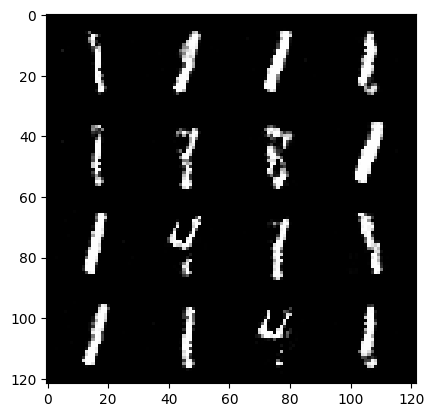

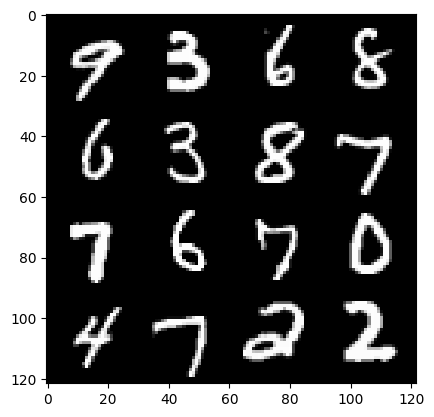

152: step 71700 / Gen loss: 2.3470250082015998 / disc_loss: 0.19825039361913988


  0%|          | 0/469 [00:00<?, ?it/s]

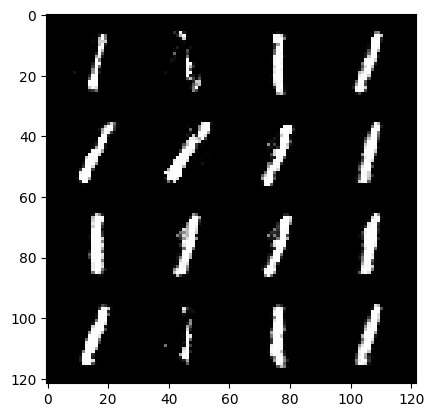

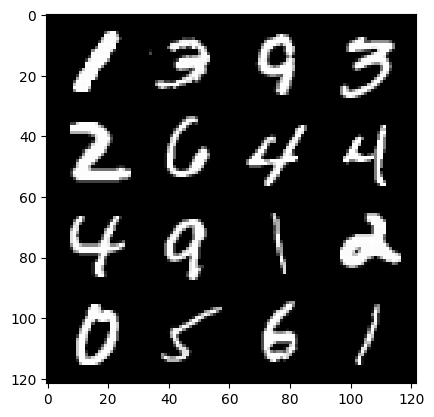

153: step 72000 / Gen loss: 2.2864457380771626 / disc_loss: 0.20354192984600844


  0%|          | 0/469 [00:00<?, ?it/s]

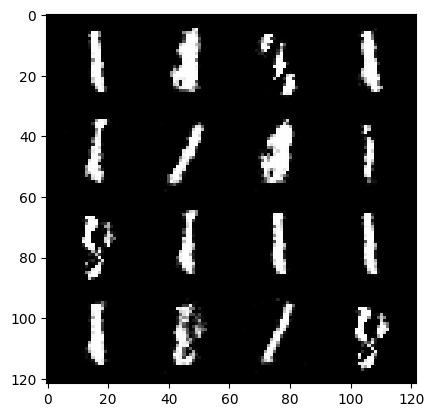

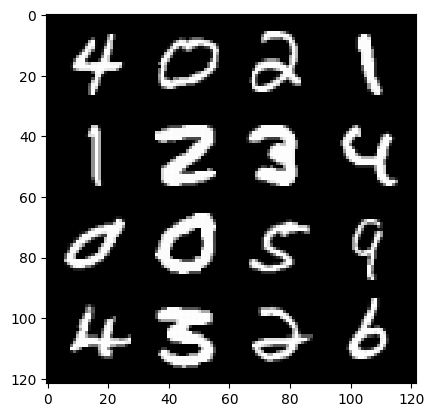

154: step 72300 / Gen loss: 2.3876546176274607 / disc_loss: 0.19698096940914786


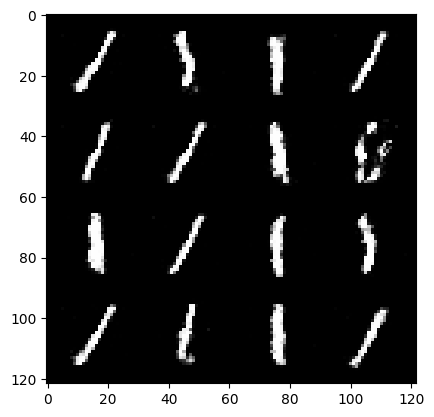

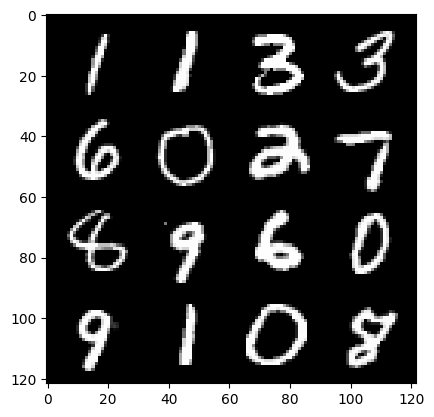

154: step 72600 / Gen loss: 2.293593872388203 / disc_loss: 0.1972459441423415


  0%|          | 0/469 [00:00<?, ?it/s]

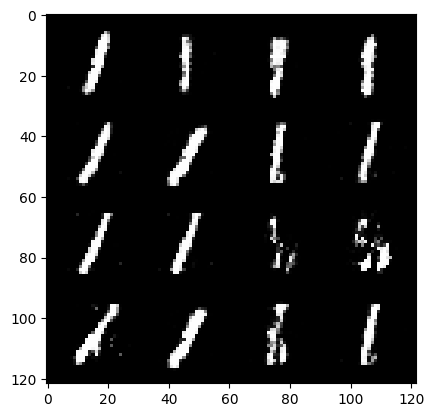

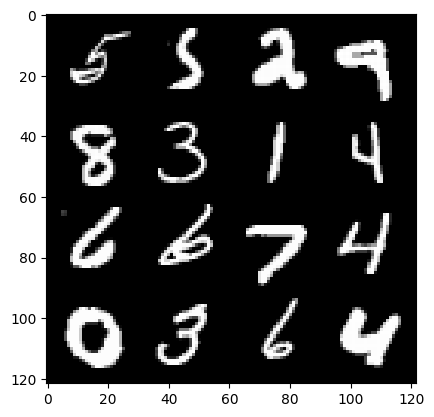

155: step 72900 / Gen loss: 2.410667020479838 / disc_loss: 0.19550145059823987


  0%|          | 0/469 [00:00<?, ?it/s]

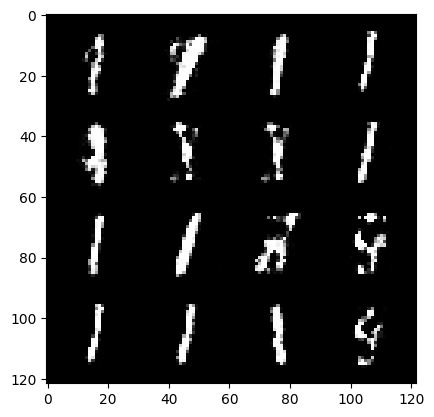

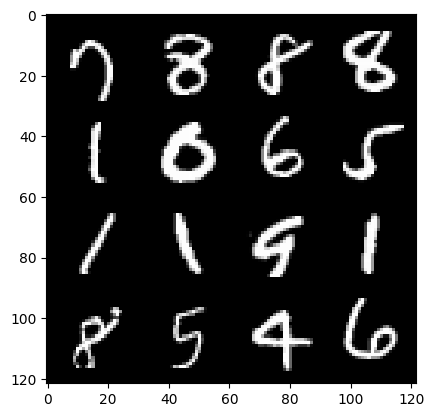

156: step 73200 / Gen loss: 2.2532433271408077 / disc_loss: 0.209845277244846


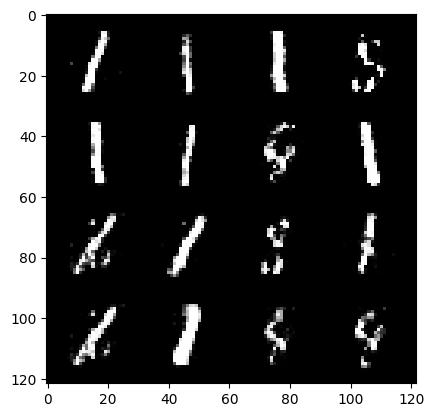

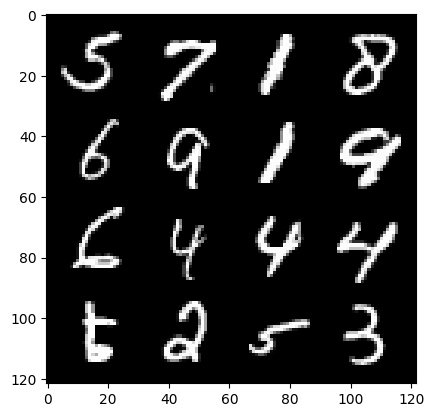

156: step 73500 / Gen loss: 2.29722660064697 / disc_loss: 0.19959732639292874


  0%|          | 0/469 [00:00<?, ?it/s]

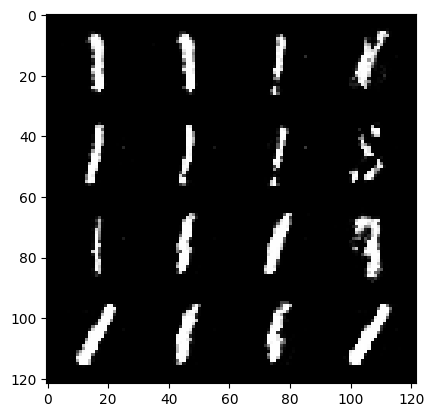

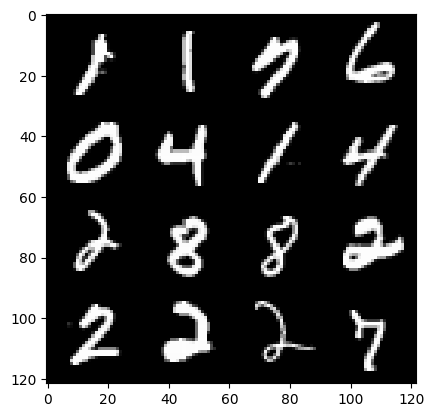

157: step 73800 / Gen loss: 2.359866181214651 / disc_loss: 0.19152320690453048


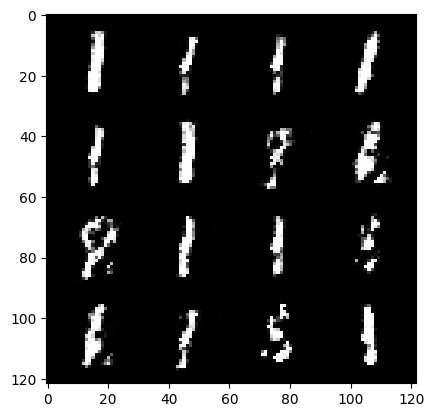

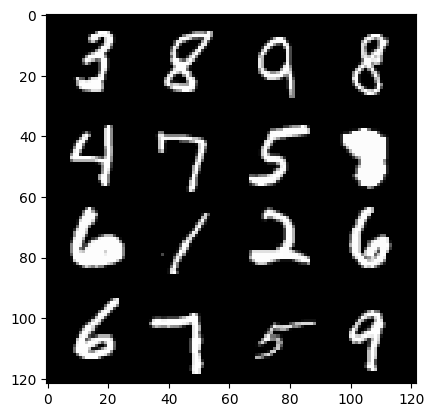

157: step 74100 / Gen loss: 2.410871263345082 / disc_loss: 0.18453005825479823


  0%|          | 0/469 [00:00<?, ?it/s]

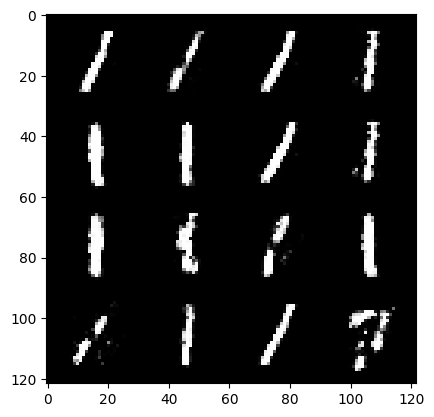

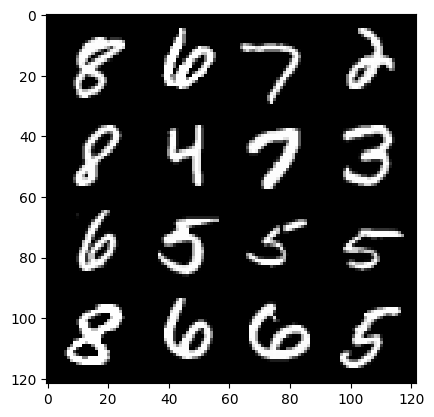

158: step 74400 / Gen loss: 2.271393144925435 / disc_loss: 0.20711904411514598


  0%|          | 0/469 [00:00<?, ?it/s]

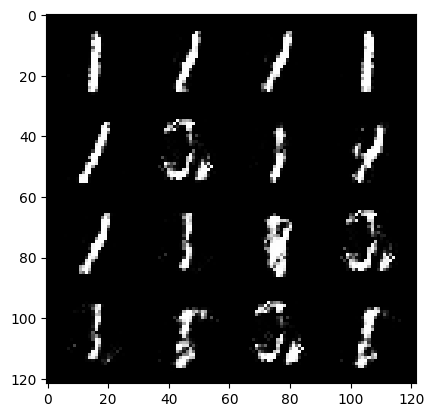

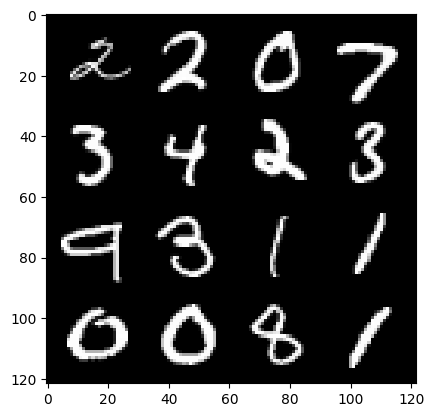

159: step 74700 / Gen loss: 2.278329765796661 / disc_loss: 0.2085337562859056


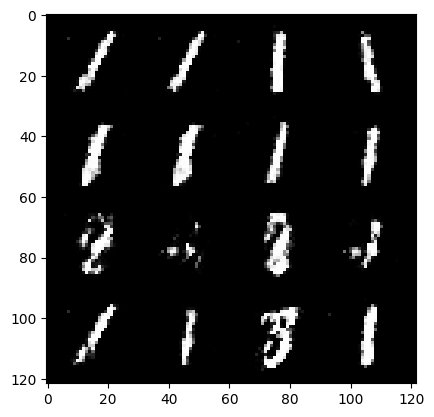

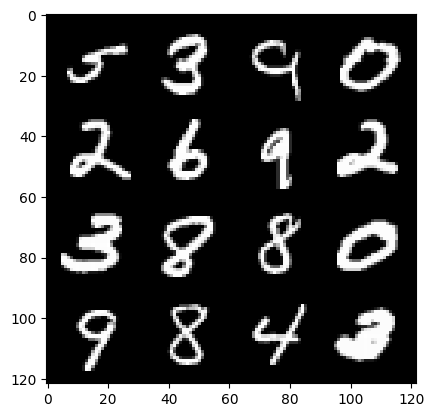

159: step 75000 / Gen loss: 2.2280689462025967 / disc_loss: 0.21340719739596062


  0%|          | 0/469 [00:00<?, ?it/s]

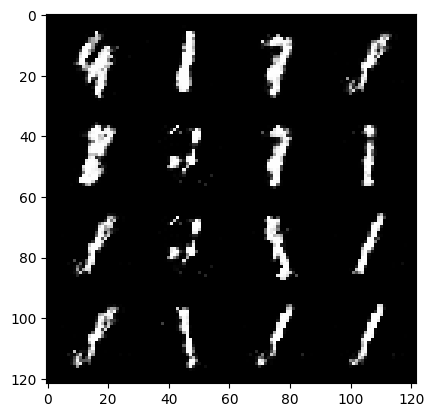

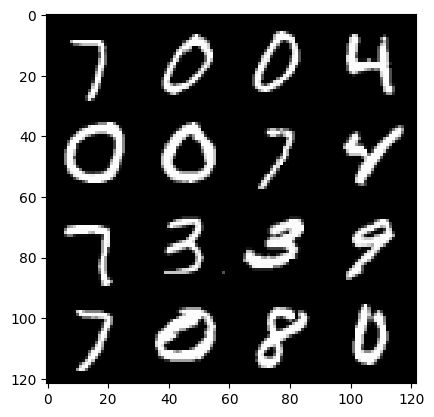

160: step 75300 / Gen loss: 2.243071628808976 / disc_loss: 0.21007542913158744


  0%|          | 0/469 [00:00<?, ?it/s]

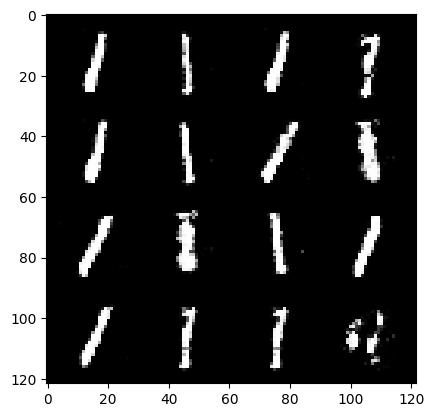

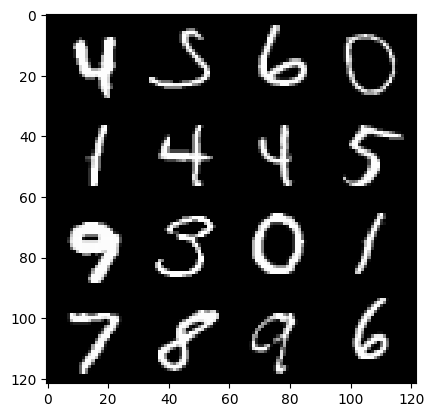

161: step 75600 / Gen loss: 2.2949842174847928 / disc_loss: 0.2087367792924246


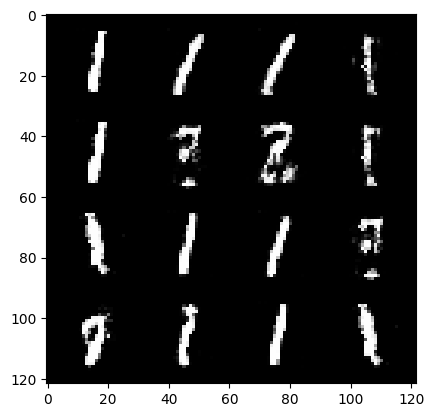

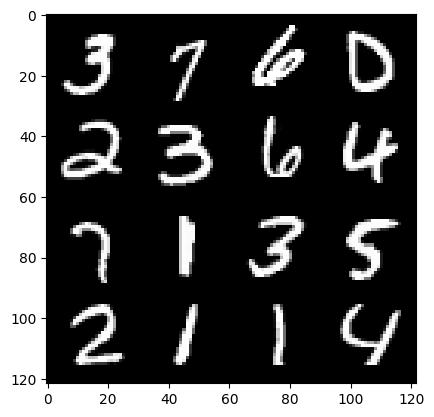

161: step 75900 / Gen loss: 2.1778982909520477 / disc_loss: 0.2258313792943956


  0%|          | 0/469 [00:00<?, ?it/s]

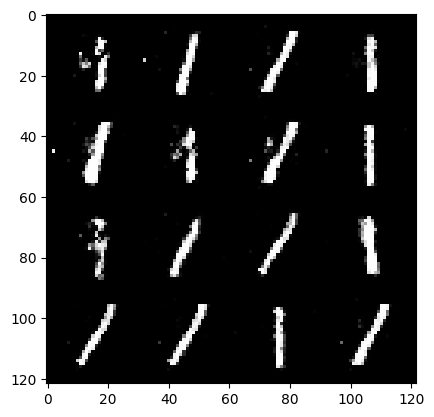

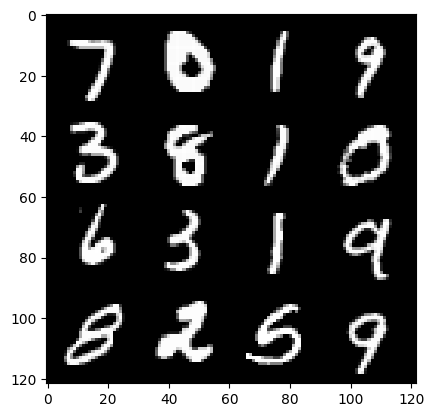

162: step 76200 / Gen loss: 2.314238231976826 / disc_loss: 0.22492159202694872


  0%|          | 0/469 [00:00<?, ?it/s]

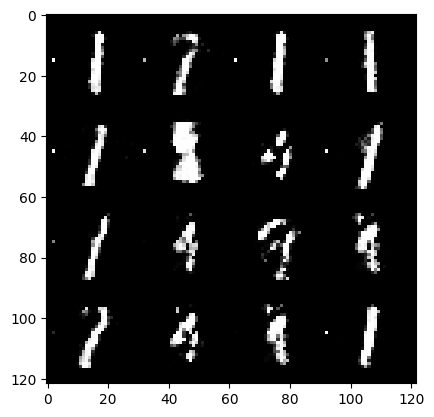

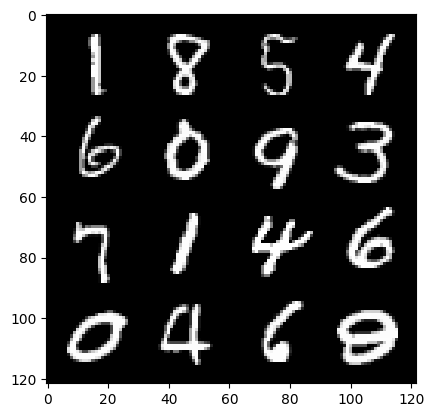

163: step 76500 / Gen loss: 2.108142567078272 / disc_loss: 0.2407046035428842


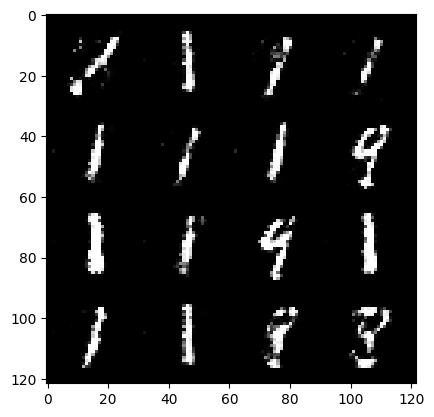

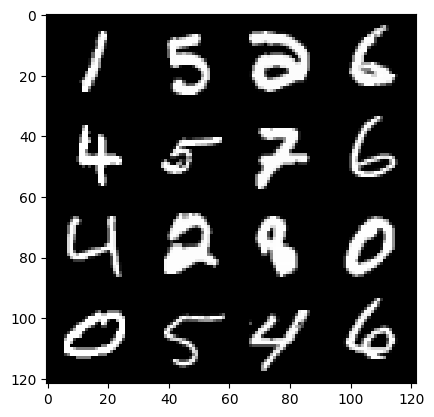

163: step 76800 / Gen loss: 2.4767695752779657 / disc_loss: 0.17544110022485251


  0%|          | 0/469 [00:00<?, ?it/s]

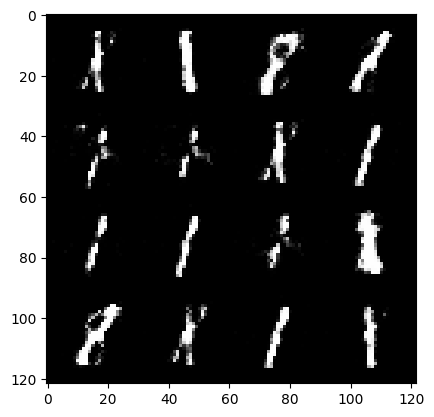

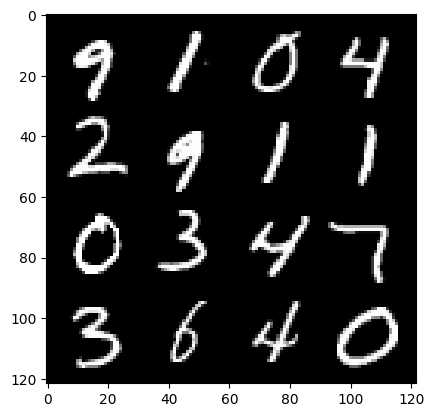

164: step 77100 / Gen loss: 2.455222495396931 / disc_loss: 0.19322889799873041


  0%|          | 0/469 [00:00<?, ?it/s]

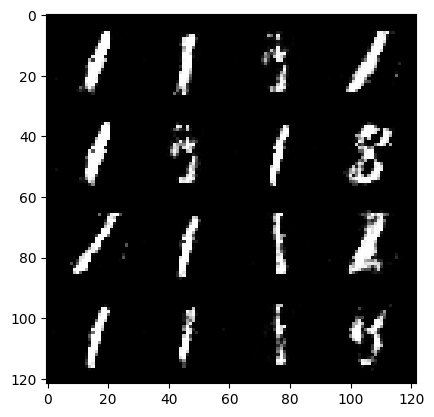

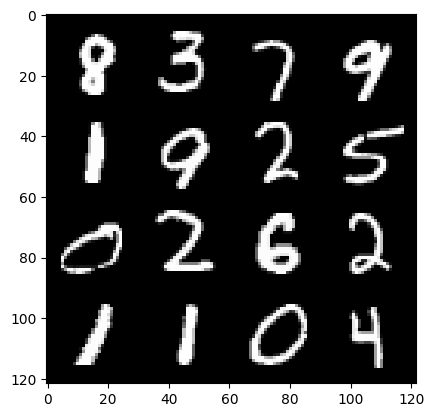

165: step 77400 / Gen loss: 2.269882251421611 / disc_loss: 0.2027222670863071


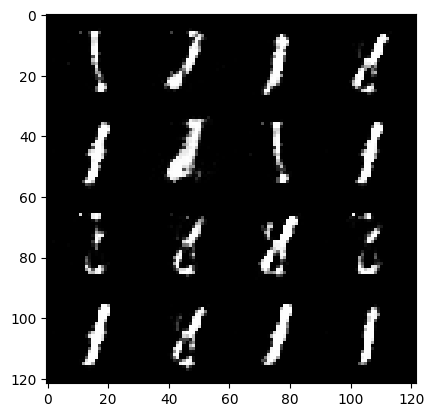

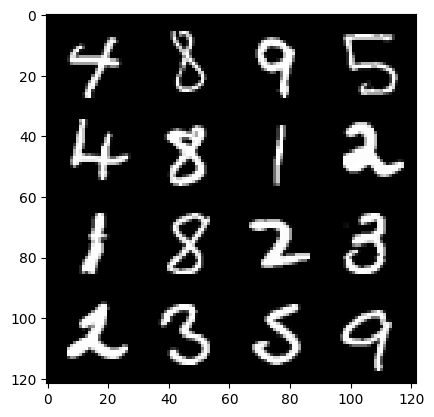

165: step 77700 / Gen loss: 2.2072961982091273 / disc_loss: 0.2109337582190832


  0%|          | 0/469 [00:00<?, ?it/s]

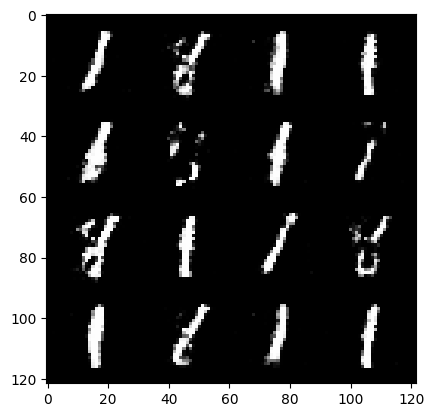

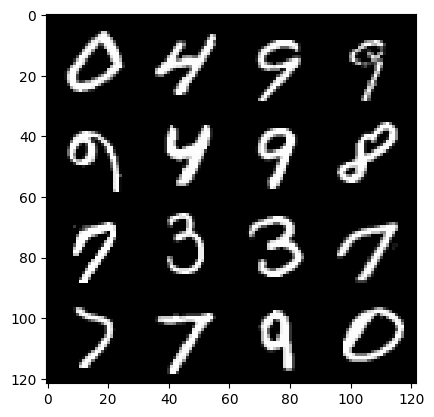

166: step 78000 / Gen loss: 2.2383036235968286 / disc_loss: 0.20416797570884238


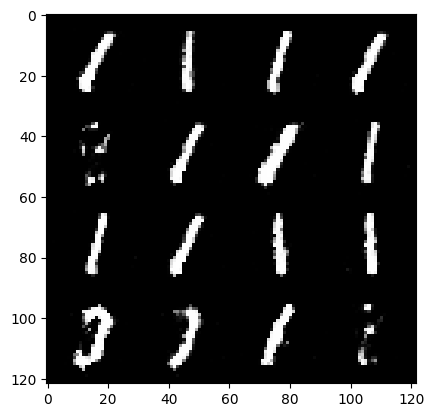

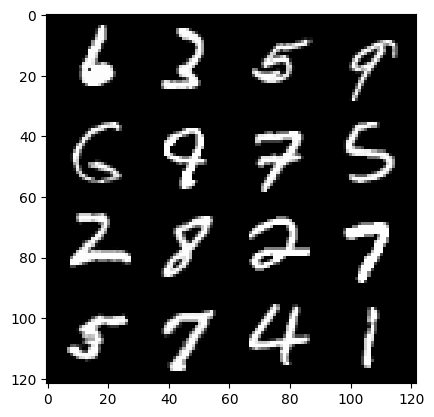

166: step 78300 / Gen loss: 2.4242004672686255 / disc_loss: 0.1777294510602952


  0%|          | 0/469 [00:00<?, ?it/s]

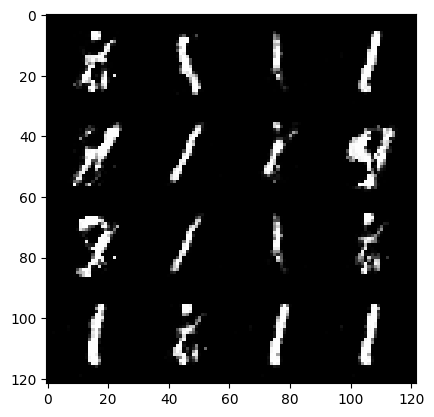

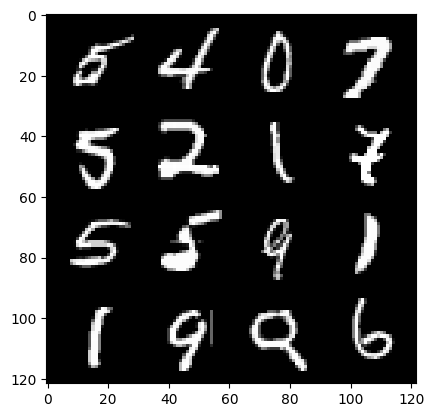

167: step 78600 / Gen loss: 2.465256621837617 / disc_loss: 0.17865157482524727


  0%|          | 0/469 [00:00<?, ?it/s]

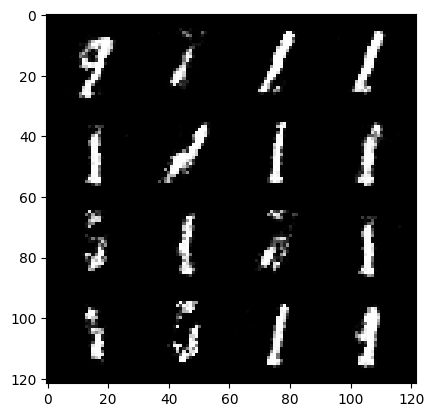

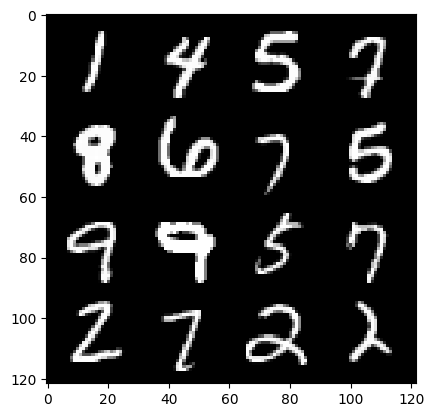

168: step 78900 / Gen loss: 2.468307071526845 / disc_loss: 0.1868482613315185


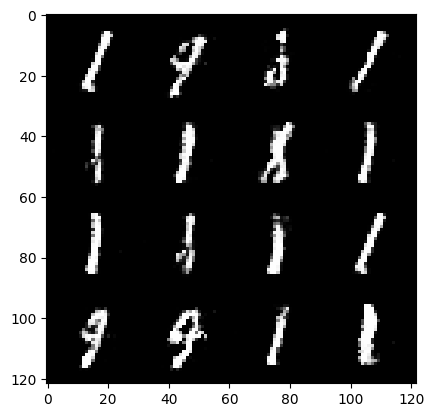

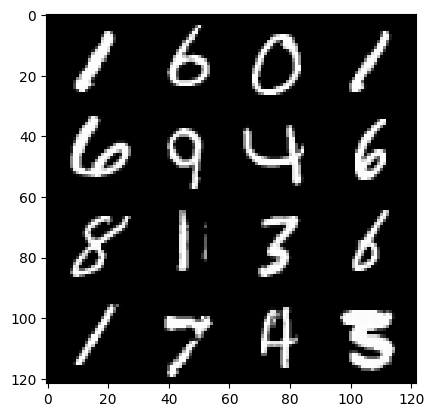

168: step 79200 / Gen loss: 2.3154351353645333 / disc_loss: 0.20446249475081765


  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
### 60000 / 128 = 468.75 = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs = len(real) # real : 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_dis_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step > 0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss = 0
      mean_disc_loss = 0

    cur_step+=1